In [1]:
!which python

/home/mcardia/anaconda3/envs/results/bin/python


In [2]:
import pickle
import pickle5

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from operator import itemgetter
import pandas as pd
import skmob
from skmob.tessellation import tilers
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [456]:
sizes = {
    "title" : 22,
    "ticks" : 18,
    "legend" : 20,
    "labels" : 22,
    "suptitle" : 24
}

In [4]:
STResNet_pred = {} # 1000m, 1500m and 15 30 60 min
STResNet_real = {} # 1000m, 1500m and 15 30 60 min

AdjNet_pred = {} # 1000m, 1500m and 15 30 60 min
AdjNet_real = {} # 1000m, 1500m and 15 30 60 min

In [5]:
dir_name_stresnet = "../CrowdFlowPrediction/temp/"
dir_name_adjnet = "../STGCN-PyTorchNYC/predictions/"

In [6]:
# stresnet_tile1000_freq15min_real_pkl = "PREDICTIONSreal_flow_tile1000time_interval15min.pkl"
# stresnet_tile1000_freq15min_pred_pkl = "PREDICTIONSpredicted_flow_tile1000time_interval15min.pkl"

# adjnet_tile1000_freq15min_real_pkl = "real_flow_tile1000time_interval15min.pkl"
# adjnet_tile1000_freq15min_pred_pkl = "predicted_flow_tile1000time_interval15min.pkl"
tile_sizes = [750, 1000, 1500]
time_intervals = ['15min', '30min', '45min', '60min']

for tile_size in tile_sizes:
    for time_interval in time_intervals:
        with open(dir_name_adjnet+"predicted_flow_tile"+str(tile_size)+"time_interval"+time_interval+".pkl", 'rb') as f:
            AdjNet_pred[str(tile_size)+time_interval] = pickle.load(f)
            
        with open(dir_name_adjnet+"real_flow_tile"+str(tile_size)+"time_interval"+time_interval+".pkl", 'rb') as f:
            AdjNet_real[str(tile_size)+time_interval] = pickle.load(f)
                  
        with open(dir_name_stresnet+"PREDICTIONSreal_flow_tile"+str(tile_size)+"time_interval"+time_interval+".pkl", 'rb') as f:
            STResNet_real[str(tile_size)+time_interval] = pickle5.load(f)
        
        with open(dir_name_stresnet+"PREDICTIONSpredicted_flow_tile"+str(tile_size)+"time_interval"+time_interval+".pkl", 'rb') as f:
            STResNet_pred[str(tile_size)+time_interval] = pickle5.load(f)
                  
#         STResNet_real[str(tile_size)+time_interval] = 
#         AdjNet_real[str(tile_size)+time_interval] = 

In [7]:
# with open(dir_name_adjnet+adjnet_tile1000_freq15min_real_pkl, 'rb') as f:
#     adjnet_tile1000_freq15min_real = pickle.load(f)
    
# with open(dir_name_adjnet+adjnet_tile1000_freq15min_pred_pkl, 'rb') as f:
#     adjnet_tile1000_freq15min_pred = pickle.load(f)
    
# with open(dir_name_stresnet+stresnet_tile1000_freq15min_real_pkl, 'rb') as f:
#     stresnet_tile1000_freq15min_real = pickle5.load(f)
    
# with open(dir_name_stresnet+stresnet_tile1000_freq15min_pred_pkl, 'rb') as f:
#     stresnet_tile1000_freq15min_pred = pickle5.load(f)

In [8]:
AdjNet_real["75015min"].shape

(949, 141, 1, 141)

In [9]:
STResNet_real["100015min"].shape

(960, 7, 11, 2)

In [10]:
def get_matrix_mapping(tile_size):
    
    tessellation = tilers.tiler.get("squared", base_shape="Manhattan, New York City, USA", meters=tile_size)
#     tessellation = pd.read_csv("../STGCN-PyTorchNYC/data/Tessellation_"+str(tile_size)+".csv")
#     skmob.utils.plot.plot_gdf(tessellation, popup_features=['tile_ID', 'positions'])

    list_positions = [np.array(el) for el in tessellation['position']]
    list_positions = np.array(sorted(list_positions,key=itemgetter(1)))
    max_x = list_positions[:, 0].max()
    max_y = list_positions[:, 1].max()

    pos_set = set()
    new_value = max_y +1
    for i, pos in enumerate(list_positions[:, 1]):
        if pos not in pos_set:
            new_value -= 1
            pos_set.add(pos)
        list_positions[i, 1] = new_value
        
    tessellation['positions'] = list(sorted(list_positions, key=itemgetter(0)))
#     skmob.utils.plot.plot_gdf(tessellation, popup_features=['tile_ID', 'positions'])


    matrix_mapping = {el[0]:el[1] for el in zip(tessellation['tile_ID'], tessellation['positions'])}
    y_max = np.array(list(tessellation['positions']))[:,1].max()+1
    x_max = np.array(list(tessellation['positions']))[:,0].max()+1

    return matrix_mapping, x_max, y_max

In [11]:
def OD_matrix_to_map(OD_matrix, mapping, offset, map_shape):
    map_matrix = np.zeros(map_shape)
    for i in range(OD_matrix.shape[1]): # origin
        for j in range(OD_matrix.shape[3]): # destination
            x, y = mapping[str(j+offset)]
            map_matrix[:, x, y, 0, :] += OD_matrix[:, i, :, j]#.numpy() # Inflow
            x, y = mapping[str(i+offset)]
            map_matrix[:, x, y, 1, :] += OD_matrix[:, i, :, j]#.numpy() # Outflow
    return map_matrix

In [12]:
def remove_empty_rows(X_dataset, flows):
    X_new = []
    X_sum = []
    for i in range(flows):
        X_new.append(X_dataset[:,:,:,i])
        X_sum.append(np.add.reduce(X_new[i]))

        X_new[i] = X_new[i][:,~(X_sum[i]==0).all(1)]    # Removing empty rows
        X_new[i] = X_new[i][:,:,~(X_sum[i].T==0).all(1)]    # Removing empty columns

    X_dataset = np.empty([X_dataset.shape[0], X_new[0].shape[1], X_new[0].shape[2], flows])

    for i in range(flows):
        X_dataset[:,:,:,i] = X_new[i]

    return X_dataset, (~(X_sum[i]==0).all(1), ~(X_sum[i].T==0).all(1))

In [13]:
def restore_od_matrix_pred(matrix, empty_indices):
    for idx in empty_indices:
        matrix = np.insert(matrix, idx, np.zeros([matrix.shape[0], 1, matrix.shape[2], matrix.shape[3]]), 1)
        matrix = np.insert(matrix, idx, np.zeros([matrix.shape[0], matrix.shape[1], 1, matrix.shape[3]]), 2)
    return matrix

In [14]:
def to_2D_map(actual, predicted, matrix_mapping, min_tile_id, x_max, y_max):
    # actual = restore_od_matrix_pred(actual, empty_indices)
    # predicted = restore_od_matrix_pred(predicted, empty_indices)

    actual_map = OD_matrix_to_map(actual, matrix_mapping, min_tile_id, [actual.shape[0], x_max, y_max, 2, 1])
    predicted_map = OD_matrix_to_map(predicted, matrix_mapping, min_tile_id, [predicted.shape[0], x_max, y_max, 2, 1])

    # Removing rows and columns with no flows
    actual_map, non_empty_shape = remove_empty_rows(actual_map[:,:,:,:,0], 2)
    predicted_map = predicted_map[:, non_empty_shape[0], :, :]
    predicted_map = predicted_map[:, :, non_empty_shape[1], :, :]
    predicted_map = predicted_map[:, :, :, :, 0]

    return actual_map, predicted_map, non_empty_shape

In [15]:
# matrix_mapping, x_max, y_max = get_matrix_mapping(tile_size)

In [16]:
AdjNet_real_map = {}
AdjNet_pred_map = {}
min_tile_id = {}

for tile_size in tile_sizes:
    matrix_mapping, x_max, y_max = get_matrix_mapping(tile_size)
    df = pd.read_csv("../STGCN-PyTorchNYC/data/df_grouped_tile"+str(tile_size)+"freq30min.csv")
    min_tile_id[tile_size] = df['tile_ID_origin'].min()
    del df
    for time_interval in time_intervals:
        AdjNet_real_map[str(tile_size)+time_interval], AdjNet_pred_map[str(tile_size)+time_interval], non_empty_shape = to_2D_map(
            AdjNet_real[str(tile_size)+time_interval], AdjNet_pred[str(tile_size)+time_interval], matrix_mapping, min_tile_id[tile_size], x_max, y_max)

In [509]:
def show_heatmaps(real_map, STResNetMap, AdjNetMap, tile_size, time_interval, flow):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24,8))
    flow_str = "Outflow" if flow == 1 else "Inflow"
#     fig.suptitle(flow_str+" Heatmaps Manhattan area, tile size: "+str(tile_size)+"m, time intervals: "+time_interval, fontsize=22)
    fig.suptitle(flow_str+" Heatmaps, tile size: "+str(tile_size)+"m, time intervals: "+time_interval, fontsize=sizes['suptitle'])

    for ax in (ax1, ax2, ax3):
        ax.set_xlabel('X', fontsize=sizes['labels'])
        ax.set_ylabel('Y', fontsize=sizes['labels'])
        ax.set_yticks(np.arange(real_map.shape[2]))
        ax.set_xticks(np.arange(real_map.shape[1]))
        ax.set_yticklabels(np.arange(real_map.shape[2]), fontsize=sizes['ticks'])
        ax.set_xticklabels(np.arange(real_map.shape[1]), fontsize=sizes['ticks'])
        

    map_2D = AdjNetMap
    heatmap_adjnet = map_2D[0, :, :, flow].copy()
    ax1.set_title("AdjNet Prediction", fontsize=sizes['title'])
    for img in map_2D[1:]:
        heatmap_adjnet += img[:, :, flow]
    heatmap_adjnet = heatmap_adjnet/map_2D.shape[0]

    map_2D = real_map
    heatmap = map_2D[0, :, :, flow].copy()
    ax2.set_title("Real", fontsize=sizes['title'])
    for img in map_2D[1:]:
        heatmap += img[:, :, flow]
    heatmap = heatmap/map_2D.shape[0]
    
    map_2D = STResNetMap
    heatmap_STResNet = map_2D[0, :, :, flow].copy()
    ax3.set_title("STResNet Prediction", fontsize=sizes['title'])
    for img in map_2D[1:]:
        heatmap_STResNet += img[:, :, flow]
    heatmap_STResNet = heatmap_STResNet/map_2D.shape[0]
    
    # Taking the max value for the legend
    max_v = max([heatmap_adjnet.max(), heatmap.max(), heatmap_STResNet.max()])
        
    c = ax1.imshow(heatmap_adjnet.T, cmap='Reds', interpolation='nearest', 
                   vmax=max_v)
    fig.colorbar(c, ax=ax1).ax.tick_params(labelsize=sizes['ticks']) 
    
    
    c = ax2.imshow(heatmap.T, cmap='Reds', interpolation='nearest',
                   vmax=max_v)
    fig.colorbar(c, ax=ax2).ax.tick_params(labelsize=sizes['ticks']) 

    c = ax3.imshow(heatmap_STResNet.T, cmap='Reds', interpolation='nearest',
                   vmax=max_v)
    fig.colorbar(c, ax=ax3).ax.tick_params(labelsize=sizes['ticks']) 
    
    plt.savefig("Heatmap_"+flow_str+"_"+str(tile_size)+"m_"+time_interval+".png")
    plt.show()

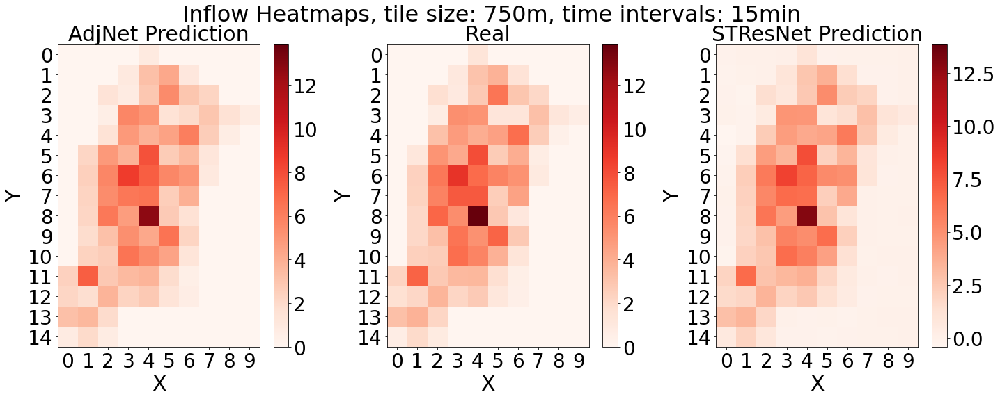

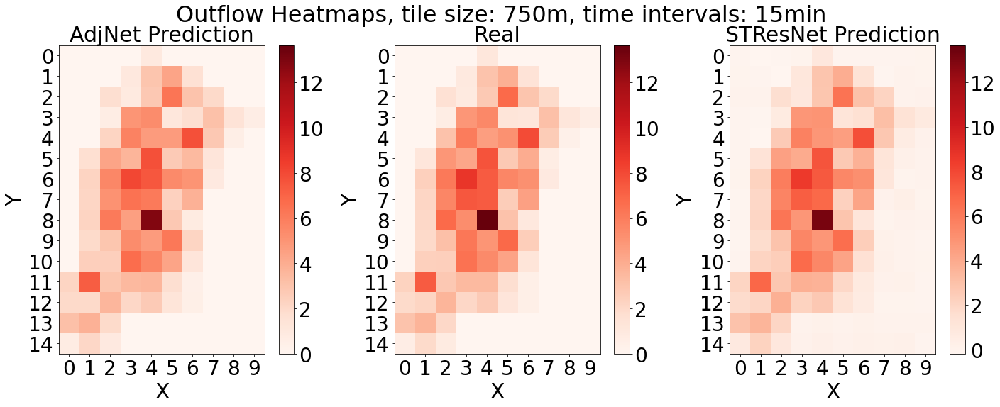

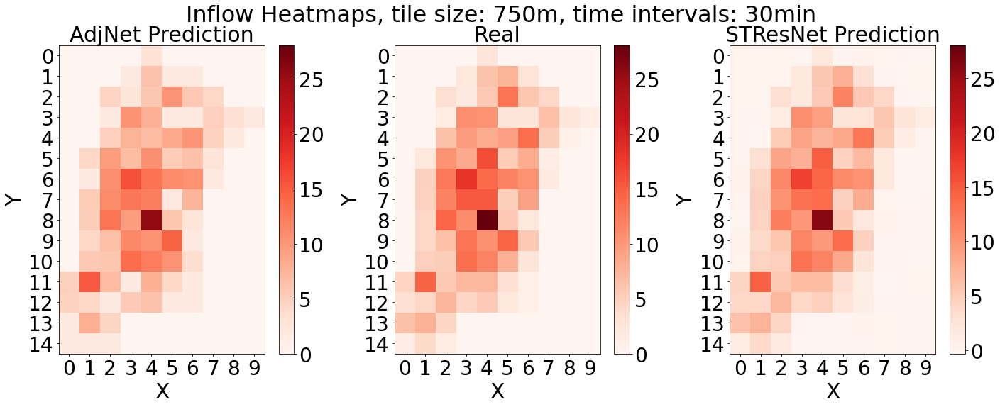

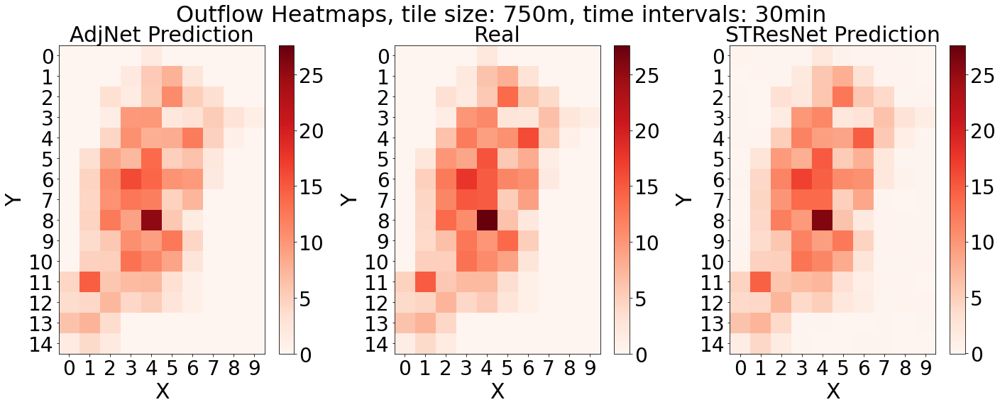

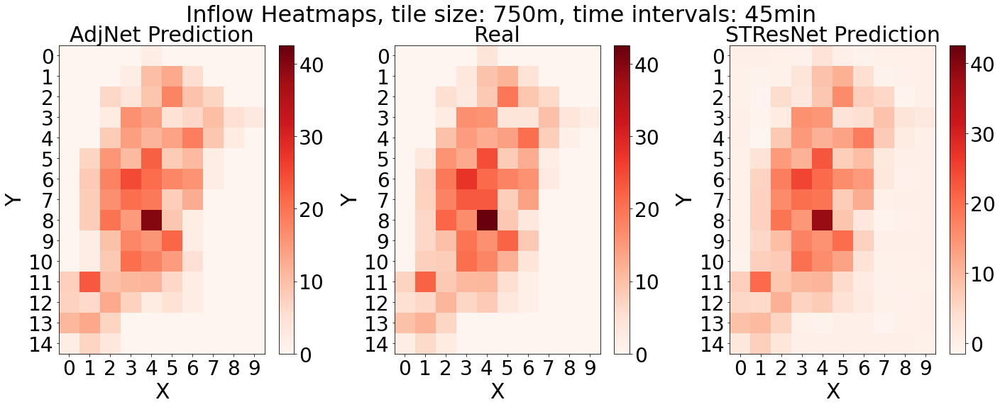

...

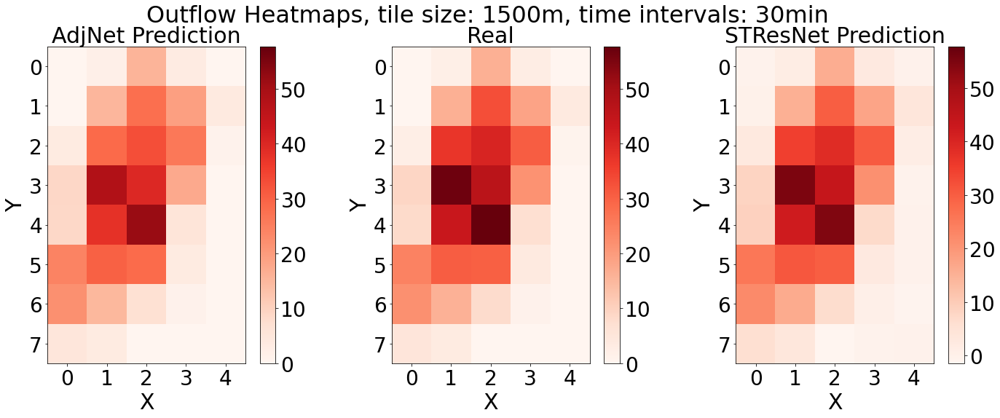

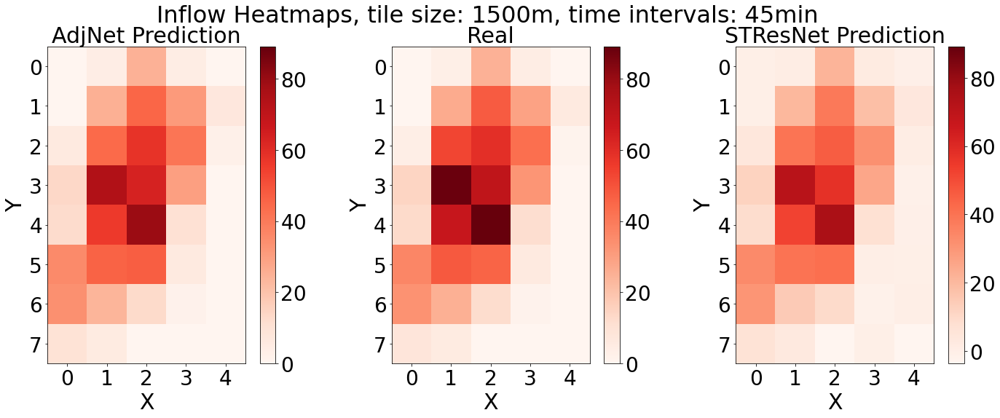

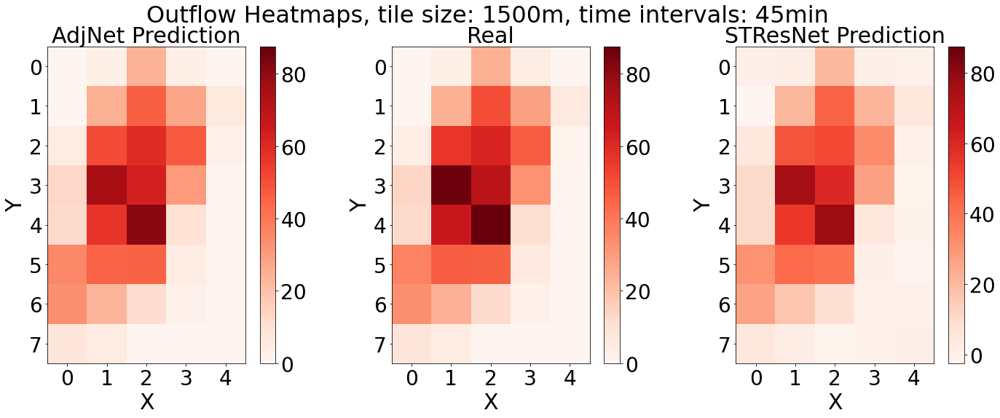

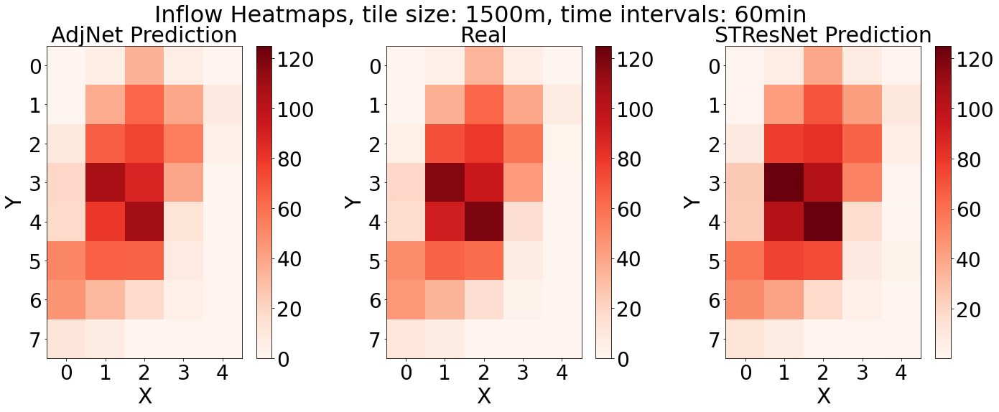

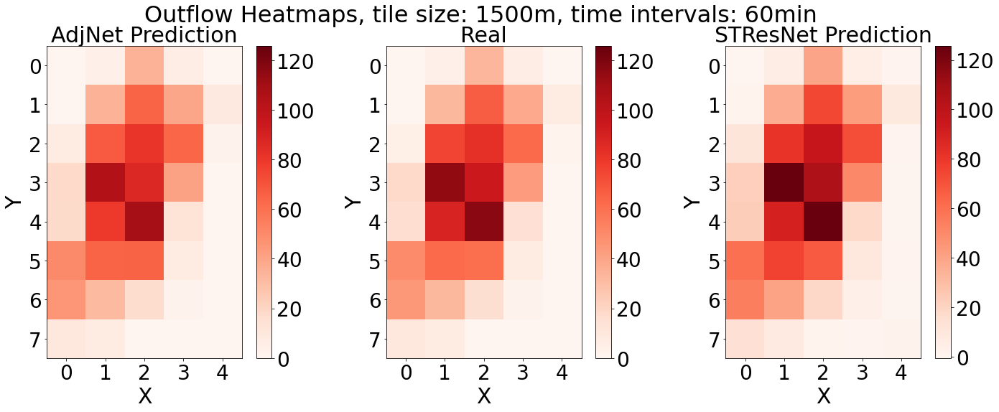

In [510]:
for tile_size in tile_sizes:
    for time_interval in time_intervals:
        for flow in [0,1]:
            show_heatmaps(AdjNet_real_map[str(tile_size)+time_interval], 
                          STResNet_pred[str(tile_size)+time_interval][11:], 
                          AdjNet_pred_map[str(tile_size)+time_interval], tile_size, time_interval, flow)

In [ ]:
tessellation = tilers.tiler.get("squared", base_shape="Manhattan, New York City, USA", meters=tile_size)
list_positions = [np.array(el) for el in tessellation['position']]
list_positions = np.array(sorted(list_positions,key=itemgetter(1)))
max_x = list_positions[:, 0].max()
max_y = list_positions[:, 1].max()

pos_set = set()
new_value = max_y +1
for i, pos in enumerate(list_positions[:, 1]):
    if pos not in pos_set:
        new_value -= 1
        pos_set.add(pos)
    list_positions[i, 1] = new_value

tessellation['positions'] = list(sorted(list_positions, key=itemgetter(0)))
inverse_matrix_mapping = {str(el[1]):el[0] for el in zip(tessellation['tile_ID'], tessellation['positions'])}

In [20]:
m = restore_od_matrix_pred(AdjNet_real_map[str(tile_size)+time_interval], non_empty_shape)

/home/mcardia/anaconda3/envs/results/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: in the future insert will treat boolean arrays and array-likes as a boolean index instead of casting it to integer
  This is separate from the ipykernel package so we can avoid doing imports until
/home/mcardia/anaconda3/envs/results/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: in the future insert will treat boolean arrays and array-likes as a boolean index instead of casting it to integer
  after removing the cwd from sys.path.


In [21]:
m.shape

(229, 36, 39, 2)

In [22]:
f, tile_pos = [], []
for x in range(m.shape[1]):
    for y in range(m.shape[2]):
        try:
            if m[:,x,y,flow].sum() != 0:
                print(x, ",", y)
                print(m[:,x,y,flow].sum())
            tile_pos.append(int(inverse_matrix_mapping[str(np.array([x,y]))])+min_tile_id[tile_size])
            f.append(m[:,x,y,flow].sum())
        except KeyError:
            pass

print(len(tile_pos))
print(len(f))
flow_df = pd.DataFrame()
flow_df['tile_id'] = tile_pos
flow_df['flow'] = f

26 , 33
1116.0
26 , 34
4264.0
26 , 35
3794.0
26 , 36
11374.0
26 , 37
10240.0
26 , 38
2461.0
32 , 26
955.0
32 , 32
7515.0
32 , 33
17250.0
32 , 34
26284.0
32 , 35
20258.0
32 , 36
14343.0
32 , 37
7478.0
32 , 38
1640.0
33 , 26
7587.0
33 , 32
15364.0
33 , 33
19006.0
33 , 34
21541.0
33 , 35
26751.0
33 , 36
14027.0
33 , 37
3668.0
34 , 26
1314.0
34 , 32
8696.0
34 , 33
14348.0
34 , 34
9946.0
34 , 35
3288.0
34 , 36
1708.0
34 , 37
522.0
35 , 32
1719.0
35 , 33
389.0
79
79


In [23]:
# tessellation.positions[30]

array([ 5, 15])

In [24]:
# flow_df[flow_df.flow != '0.0']

,tile_id,flow
0,5,0.0
1,4,0.0
2,6,0.0
3,14,0.0
4,13,0.0
...,...,...
74,74,0.0
75,73,0.0
76,82,0.0
77,81,0.0


In [25]:
# tessellation
# AdjNet_real_map[str(tile_size)+time_interval]

,tile_ID,geometry,position,positions
0,0,"POLYGON ((-74.04722 40.68394, -74.04722 40.694...","[0, 0]","[0, 19]"
1,1,"POLYGON ((-74.04722 40.69416, -74.04722 40.704...","[0, 1]","[0, 18]"
2,2,"POLYGON ((-74.03375 40.68394, -74.03375 40.694...","[1, 0]","[1, 19]"
3,3,"POLYGON ((-74.02027 40.68394, -74.02027 40.694...","[2, 0]","[2, 19]"
4,4,"POLYGON ((-74.02027 40.69416, -74.02027 40.704...","[2, 1]","[2, 18]"
...,...,...,...,...
74,74,"POLYGON ((-73.92595 40.86761, -73.92595 40.877...","[9, 18]","[9, 1]"
75,75,"POLYGON ((-73.92595 40.87780, -73.92595 40.887...","[9, 19]","[9, 0]"
76,76,"POLYGON ((-73.91247 40.85742, -73.91247 40.867...","[10, 17]","[10, 2]"
77,77,"POLYGON ((-73.91247 40.86761, -73.91247 40.877...","[10, 18]","[10, 1]"


In [26]:
# def show_heatmaps(real_map, STResNetMap, AdjNetMap, tile_size, time_interval, flow):
#     fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,6))
#     flow_str = "Outflow" if flow == 1 else "Inflow"
#     fig.suptitle(flow_str+" Heatmaps Manhattan area, tile size: "+str(tile_size)+"m, time intervals: "+time_interval, fontsize=20)

#     for ax in (ax1, ax2, ax3):
#         ax.set_xlabel('longitude', fontsize=20)
#         ax.set_ylabel('latitude', fontsize=20)
#         ax.set_yticks(np.arange(real_map.shape[2]))
#         ax.set_xticks(np.arange(real_map.shape[1]))
#         ax.set_yticklabels(np.arange(real_map.shape[2]), fontsize=12)
#         ax.set_xticklabels(np.arange(real_map.shape[1]), fontsize=12)

#     map_2D = AdjNetMap
#     heatmap = map_2D[0, :, :, flow].copy()
#     ax1.set_title("AdjNet Prediction Map", fontsize=14)
#     for img in map_2D[1:]:
#         heatmap += img[:, :, flow]
#     heatmap = heatmap/map_2D.shape[0]
#     c = ax1.imshow(heatmap.T, cmap='Reds', interpolation='nearest')
#     fig.colorbar(c, ax=ax1)

#     map_2D = real_map
#     heatmap = map_2D[0, :, :, flow].copy()
#     ax2.set_title("Real Map", fontsize=14)
#     for img in map_2D[1:]:
#         heatmap += img[:, :, flow]
#     heatmap = heatmap/map_2D.shape[0]
#     c = ax2.imshow(heatmap.T, cmap='Reds', interpolation='nearest')
#     fig.colorbar(c, ax=ax2)

#     map_2D = STResNetMap
#     heatmap = map_2D[0, :, :, flow].copy()
#     ax3.set_title("STResNet Prediction Map", fontsize=14)
#     for img in map_2D[1:]:
#         heatmap += img[:, :, flow]
#     heatmap = heatmap/map_2D.shape[0]
#     c = ax3.imshow(heatmap.T, cmap='Reds', interpolation='nearest')
#     fig.colorbar(c, ax=ax3)
#     plt.savefig(flow_str+"Heatmap_TileSize"+str(tile_size)+"_TimeInterval"+time_interval+".png")
#     plt.show()

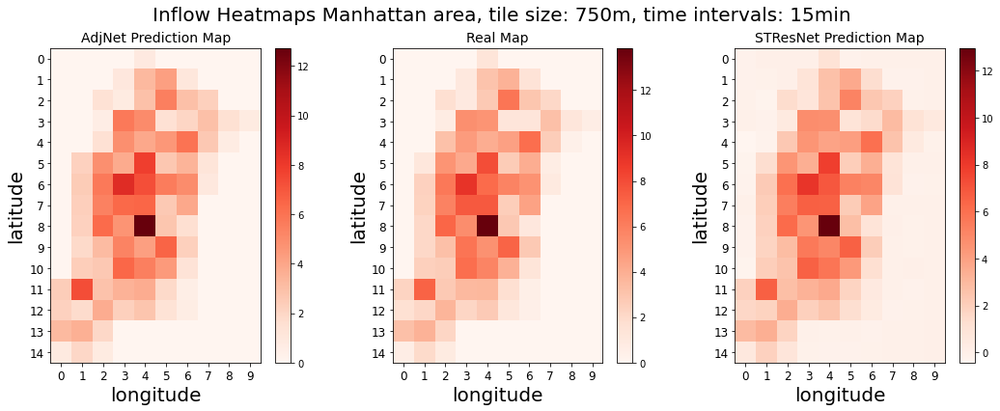

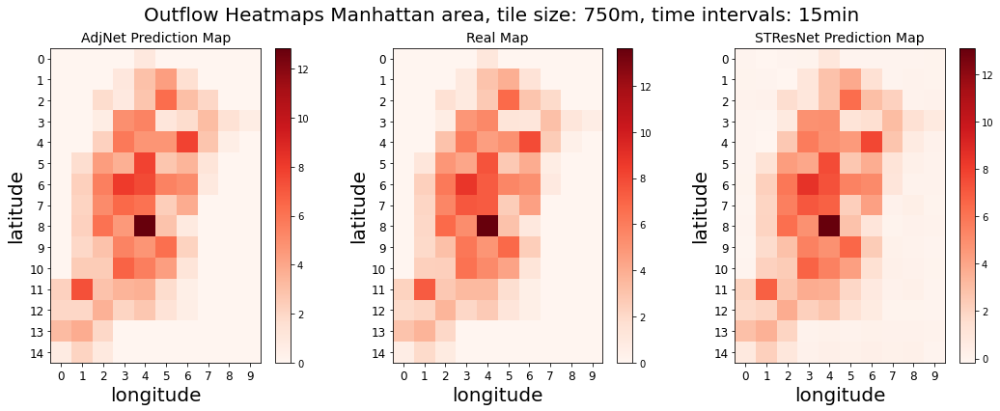

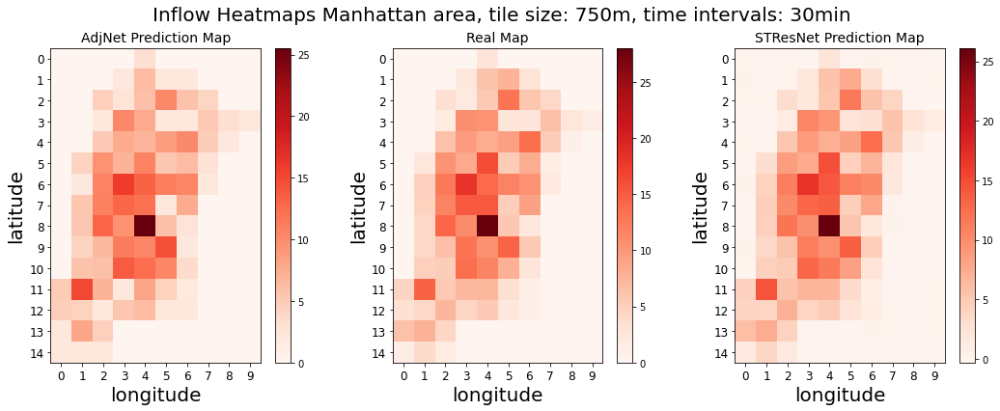

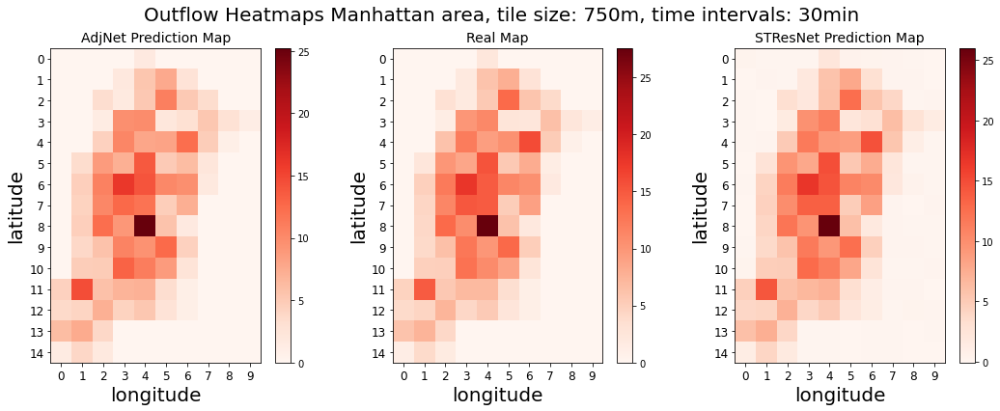

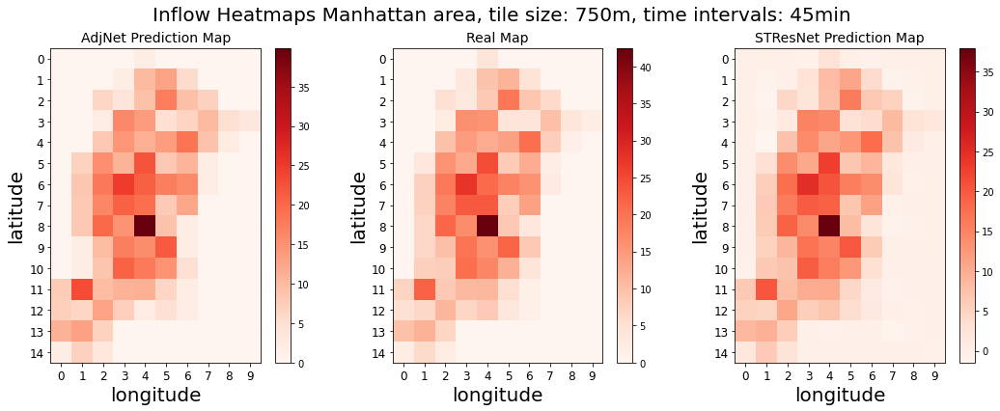

...

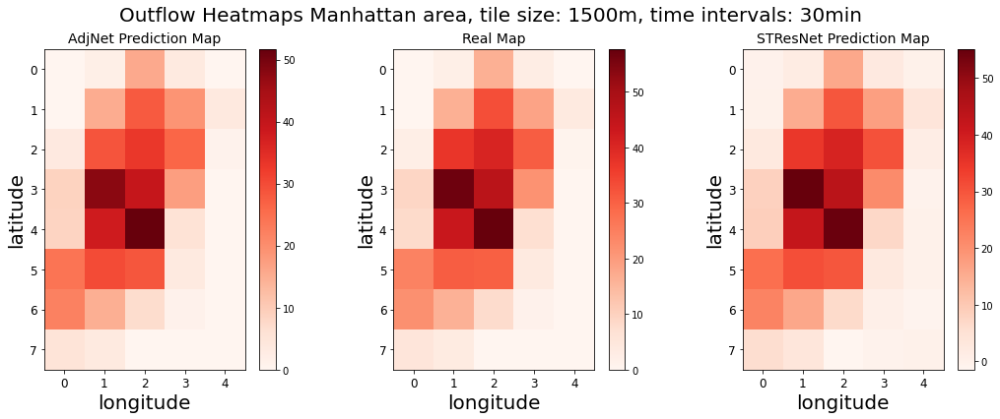

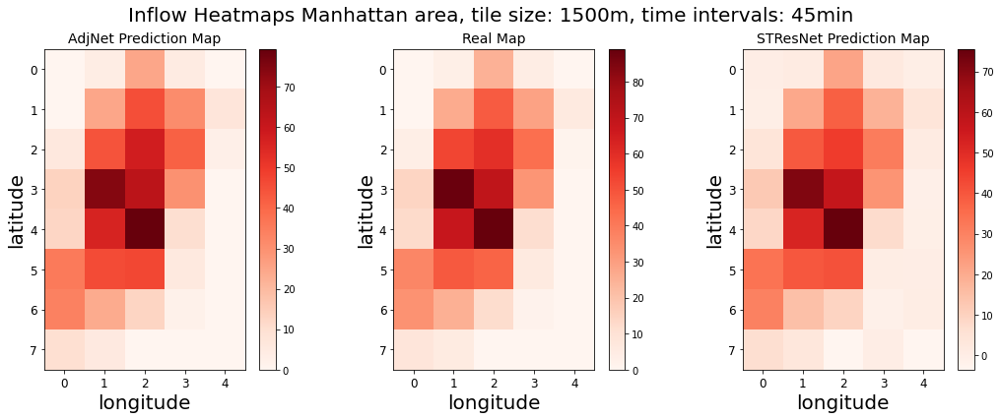

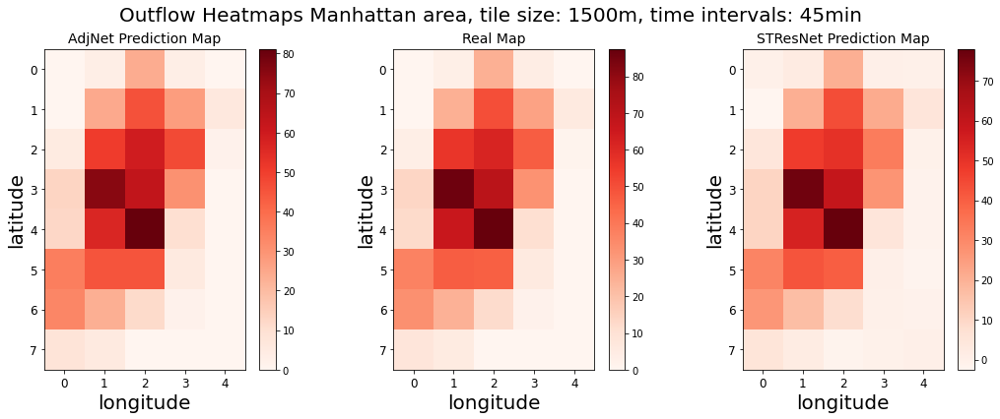

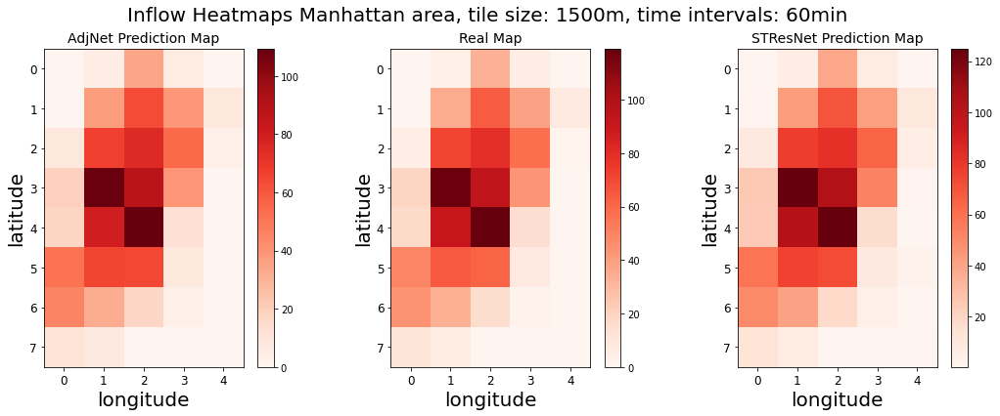

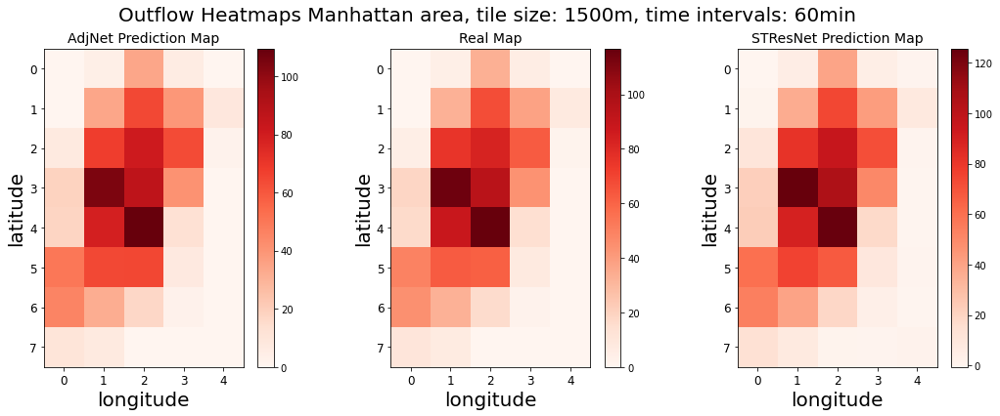

In [27]:
for tile_size in tile_sizes:
    for time_interval in time_intervals:
        for flow in [0,1]:
            show_heatmaps(AdjNet_real_map[str(tile_size)+time_interval], 
                          STResNet_pred[str(tile_size)+time_interval][11:], 
                          AdjNet_pred_map[str(tile_size)+time_interval], tile_size, time_interval, flow)

In [747]:
sizes = {
    "title" : 30,
    "ticks" : 28,
    "legend" : 26,
    "labels" : 30,
    "suptitle" : 32
}

In [515]:
def show_relative_improvement(real_map, STResNetMap, AdjNetMap, tile_size, time_interval, flow, start=0, end=85):
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24,8))
    flow_str = "Outflow" if flow == 1 else "Inflow"
    fig.suptitle(flow_str+" Relative improvement Heatmaps, tile size: "+str(tile_size)+"m, time intervals: "+time_interval, fontsize=sizes['suptitle'])

    for ax in (ax1, ax2, ax3):
        ax.set_xlabel('X', fontsize=sizes['labels'])
        ax.set_ylabel('Y', fontsize=sizes['labels'])
        ax.set_yticks(np.arange(real_map.shape[2]))
        ax.set_xticks(np.arange(real_map.shape[1]))
        ax.set_yticklabels(np.arange(real_map.shape[2]), fontsize=sizes['ticks'])
        ax.set_xticklabels(np.arange(real_map.shape[1]), fontsize=sizes['ticks'])
    
    # STResNet vs Real
    relative_improvement_stresnet = np.zeros([real_map.shape[1], real_map.shape[2]])
    ax1.set_title("STResNet vs Real", fontsize=sizes['title'])
    for i in range(end-start):
        p = i+start
        relative_improvement_stresnet += (STResNetMap[p,:,:,flow]-real_map[p,:,:,flow])/(1+real_map[p,:,:,flow])
    relative_improvement_stresnet /= (end-start)

    # AdjNet vs Real
    relative_improvement = np.zeros([real_map.shape[1], real_map.shape[2]])
    ax2.set_title("AdjNet vs Real", fontsize=sizes['title'])
    for i in range(end-start):
        p = i+start
        relative_improvement += (AdjNetMap[p,:,:,flow]-real_map[p,:,:,flow])/(1+real_map[p,:,:,flow])
    relative_improvement /= (end-start)
    
    
    c = ax1.imshow(relative_improvement_stresnet.T, cmap='seismic', interpolation='nearest', 
                   vmin=min([-relative_improvement_stresnet.max(), relative_improvement_stresnet.min(), -relative_improvement.max(), relative_improvement.min()]), 
                   vmax=max([abs(relative_improvement_stresnet.min()), relative_improvement_stresnet.max(), abs(relative_improvement.min()), relative_improvement.max()]))
    fig.colorbar(c, ax=ax1).ax.tick_params(labelsize=sizes['legend']) 
    
    c = ax2.imshow(relative_improvement.T, cmap='seismic', interpolation='nearest', 
                   vmin=min([-relative_improvement_stresnet.max(), relative_improvement_stresnet.min(), -relative_improvement.max(), relative_improvement.min()]), 
                   vmax=max([abs(relative_improvement_stresnet.min()), relative_improvement_stresnet.max(), abs(relative_improvement.min()), relative_improvement.max()]))
    fig.colorbar(c, ax=ax2).ax.tick_params(labelsize=sizes['legend']) 

    # AdjNet vs STResNet
    relative_improvement = np.zeros([real_map.shape[1], real_map.shape[2]])
    ax3.set_title("STResNet vs AdjNet", fontsize=sizes['title'])
    for i in range(end-start):
        p = i+start
        relative_improvement += (STResNetMap[p,:,:,flow]-AdjNetMap[p,:,:,flow])/(1+AdjNetMap[p,:,:,flow])
    relative_improvement /= (end-start)
    c = ax3.imshow(relative_improvement.T, cmap='seismic', interpolation='nearest', vmin=min([-relative_improvement.max(), relative_improvement.min()]), 
                   vmax=max([abs(relative_improvement.min()), relative_improvement.max()]))
    fig.colorbar(c, ax=ax3).ax.tick_params(labelsize=sizes['legend']) 
    
    plt.savefig("RelativeImprovement_"+flow_str+"_"+str(tile_size)+"m_"+time_interval+".png")
    plt.show()

### In alcune zone è sottostimato perché STResNet da un flusso negativo!

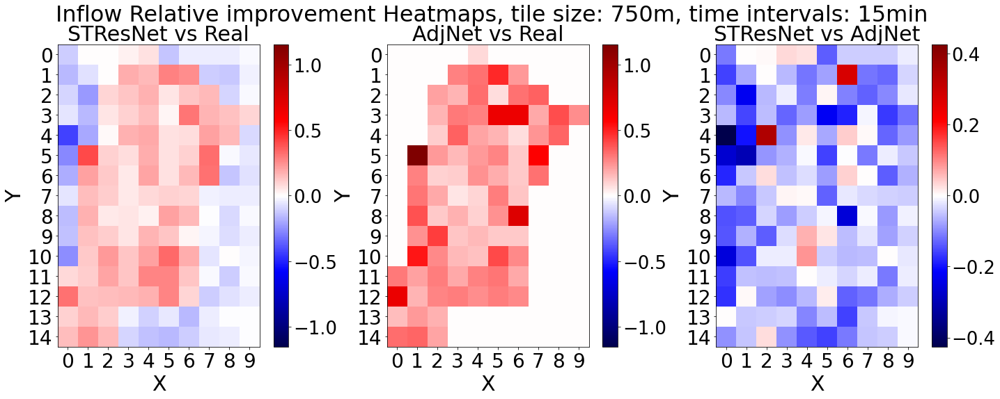

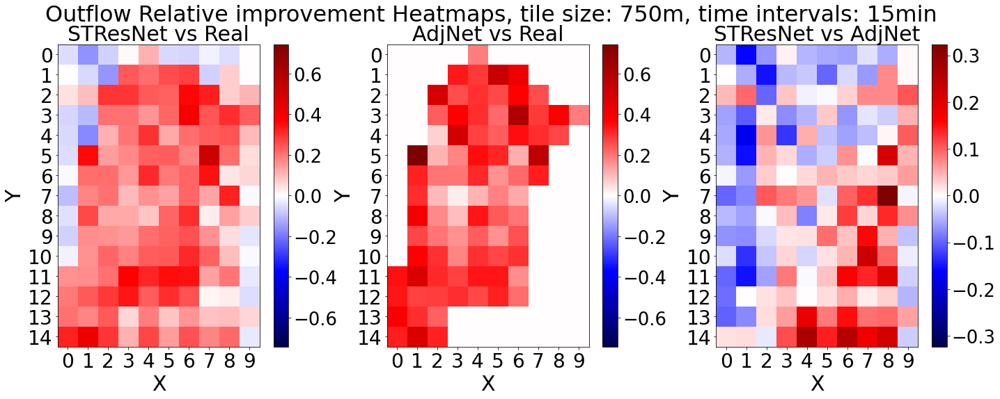

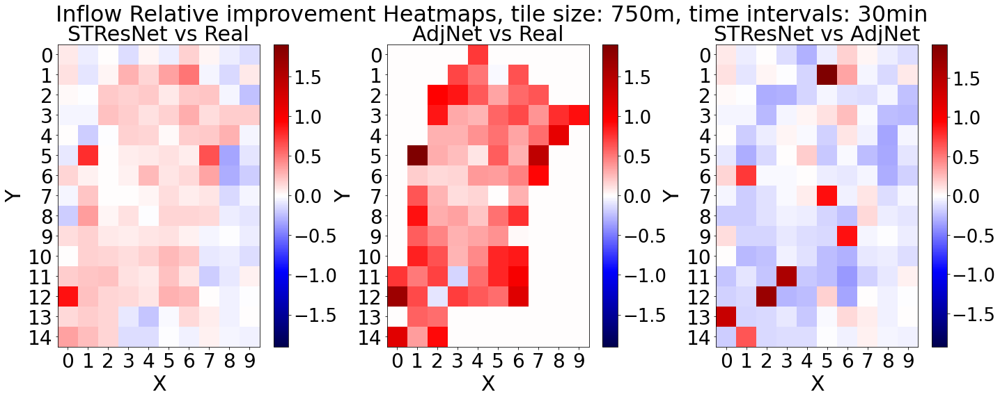

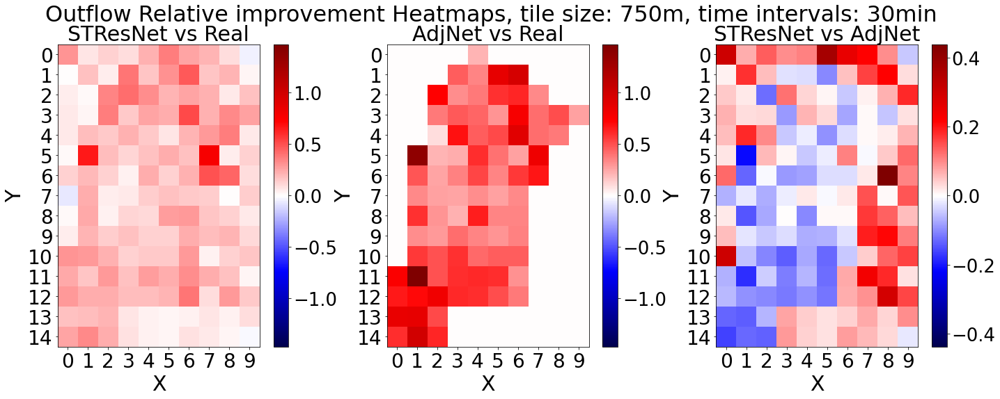

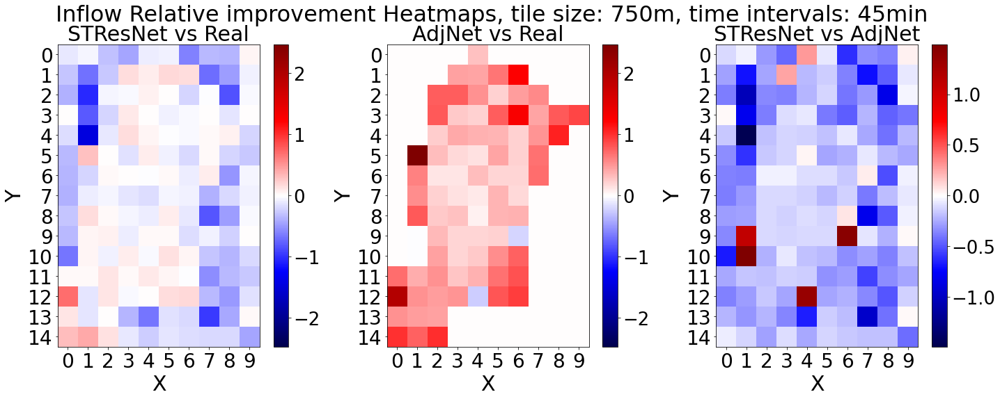

...

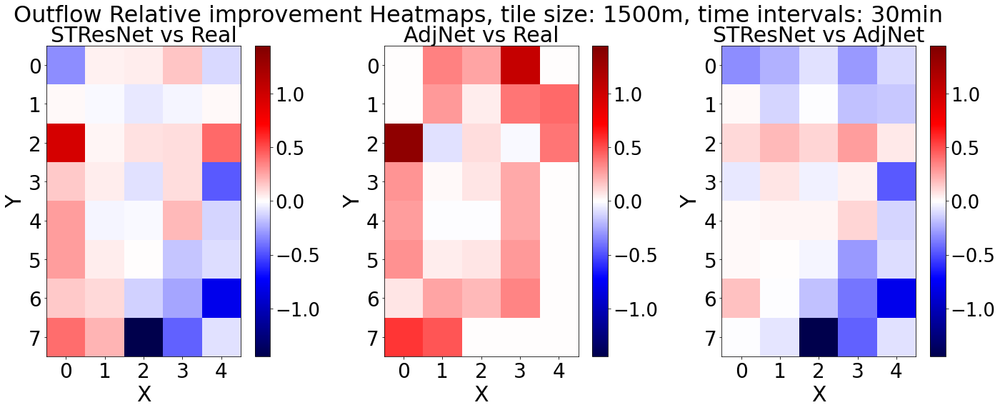

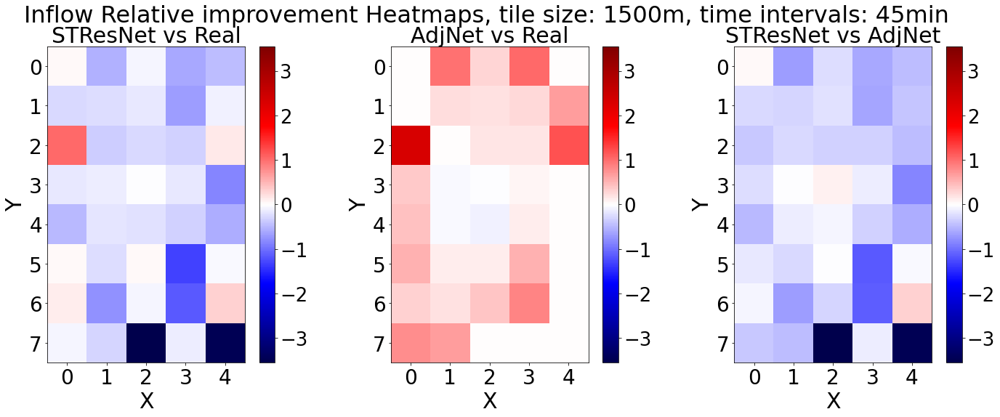

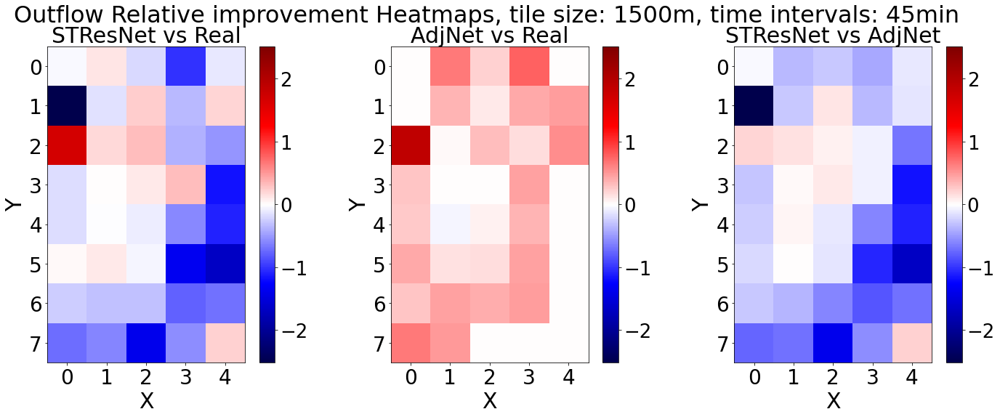

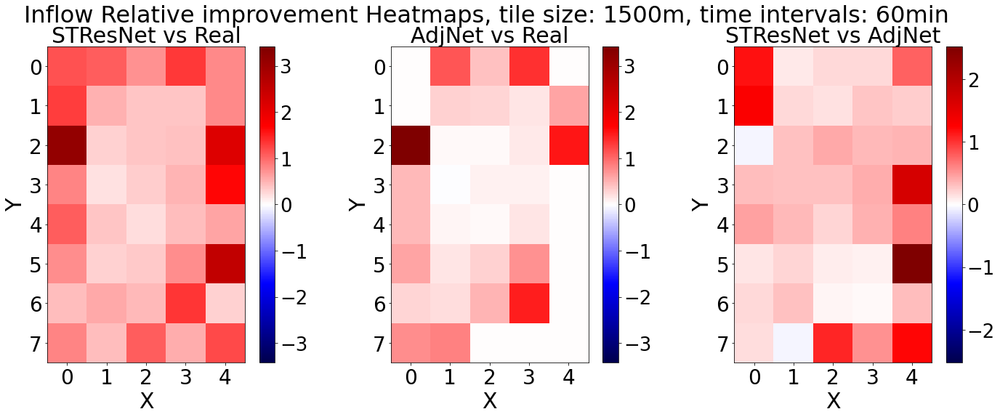

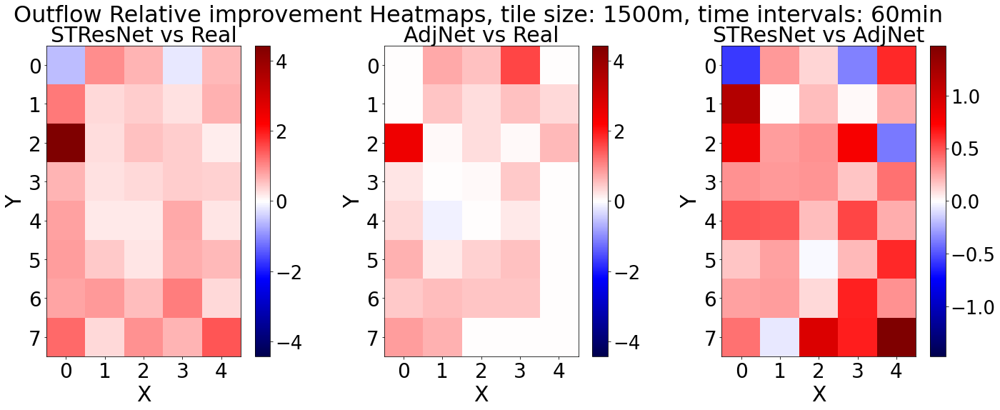

In [516]:
for tile_size in tile_sizes:
    for time_interval in time_intervals:
        for flow in [0,1]:
            show_relative_improvement(AdjNet_real_map[str(tile_size)+time_interval], 
                                    STResNet_pred[str(tile_size)+time_interval][11:], 
                                    AdjNet_pred_map[str(tile_size)+time_interval], tile_size, time_interval, flow, start=0, end=AdjNet_real_map[str(tile_size)+time_interval].shape[0])

In [485]:
# flow = 0 
# error_map = np.zeros([actual_map.shape[1], actual_map.shape[2]])
# for i in range(actual_map.shape[1]):
#     for j in range(actual_map.shape[2]):
#         error_map[i,j] = np.sqrt(mean_squared_error(actual_map[:,i,j,flow], predicted_map[:,i,j,flow]))

In [36]:
# fig = plt.figure(figsize=(18,6))
# heatmap = error_map.copy()
# plt.title("AdjNet Error Map", fontsize=14)
# plt.imshow(heatmap.T, cmap='Blues', interpolation='nearest')
# plt.colorbar()
# plt.show

In [37]:
# flow = 0 
# error_map = np.zeros([stresnet_tile1000_freq15min_real.shape[1], stresnet_tile1000_freq15min_real.shape[2]])
# for i in range(stresnet_tile1000_freq15min_real.shape[1]):
#     for j in range(stresnet_tile1000_freq15min_real.shape[2]):
#         error_map[i,j] = np.sqrt(mean_squared_error(stresnet_tile1000_freq15min_real[:,i,j,flow], stresnet_tile1000_freq15min_pred[:,i,j,flow]))

<function matplotlib.pyplot.show(close=None, block=None)>

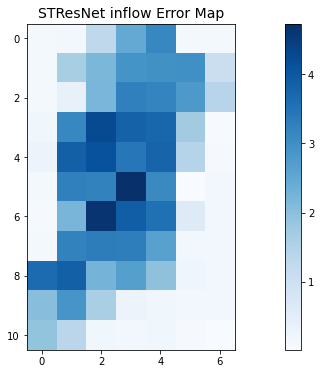

In [25]:
# fig = plt.figure(figsize=(18,6))
# heatmap = error_map.copy()
# plt.title("STResNet inflow Error Map", fontsize=14)
# plt.imshow(heatmap.T, cmap='Blues', interpolation='nearest')
# plt.colorbar()
# plt.show

In [533]:
def show_decile_RMSE(real_map, STResNetMap, AdjNetMap, tile_size, time_interval, flow, quantile = 10):

    # Removing zeros
    A_reshaped = real_map.reshape(real_map.shape[0], real_map.shape[1]*real_map.shape[2], 2)
    A_reshaped = A_reshaped[:,~(real_map.sum(axis=0).sum(axis=2)==0).flatten()]

    adjnet_reshaped = AdjNetMap.reshape(AdjNetMap.shape[0], AdjNetMap.shape[1]*AdjNetMap.shape[2], 2)
    adjnet_reshaped = adjnet_reshaped[:,~(real_map.sum(axis=0).sum(axis=2)==0).flatten()]
    stresnet_reshaped = STResNetMap.reshape(STResNetMap.shape[0], STResNetMap.shape[1]*STResNetMap.shape[2], 2)
    stresnet_reshaped = stresnet_reshaped[:,~(real_map.sum(axis=0).sum(axis=2)==0).flatten()]

    A_reshaped = A_reshaped[:,:,flow].flatten()
    adjnet_reshaped = adjnet_reshaped[:,:,flow].flatten()
    stresnet_reshaped = stresnet_reshaped[:,:,flow].flatten()

    # Permuting A_reshaped and applying the same permutation to the prediction
    p = A_reshaped.argsort()
    A_reshaped = A_reshaped[p]
    adjnet_reshaped = adjnet_reshaped[p]
    stresnet_reshaped = stresnet_reshaped[p]

    decili = [d for d in np.array_split(A_reshaped, quantile)]
    decili_adjnet_pred = [d for d in np.array_split(adjnet_reshaped, quantile)]
    decili_stresnet_pred = [d for d in np.array_split(stresnet_reshaped, quantile)]

    rmse_adjnet_decili = np.array([mean_squared_error(decili[i].reshape(-1,1), decili_adjnet_pred[i].reshape(-1,1), squared=False)
               for i in range(quantile)])
    rmse_stresnet_decili = np.array([mean_squared_error(decili[i].reshape(-1,1), decili_stresnet_pred[i].reshape(-1,1), squared=False)
               for i in range(quantile)])

    # Plot figure
    plt.figure(figsize=(16,9))
    flow_str = "Outflow" if flow == 1 else "Inflow"
    plt.title(flow_str+" decile RMSE, tile size: "+str(tile_size)+"m, time intervals: "+time_interval, fontsize=sizes['title'])
    plt.plot(list(range(quantile)), rmse_adjnet_decili, color='blue', label="AdjNet", marker="^", markersize=12, linewidth=4)
    plt.plot(list(range(quantile)), rmse_stresnet_decili, color='red', label="STResNet", marker="o", markersize=12, linewidth=4)
    plt.xlabel("Decile cell flow", fontsize=sizes['labels'])
    plt.ylabel("RMSE", fontsize=sizes['labels'])
    plt.xticks(list(range(10)), list(range(1, 11)), fontsize=sizes['ticks'])
    plt.yticks(fontsize=sizes['ticks'])
    
    plt.legend(fontsize=sizes['legend'])
    plt.grid()
    plt.savefig("DecileRMSE"+flow_str+"_"+str(tile_size)+"m_"+time_interval+".png")
    plt.show()

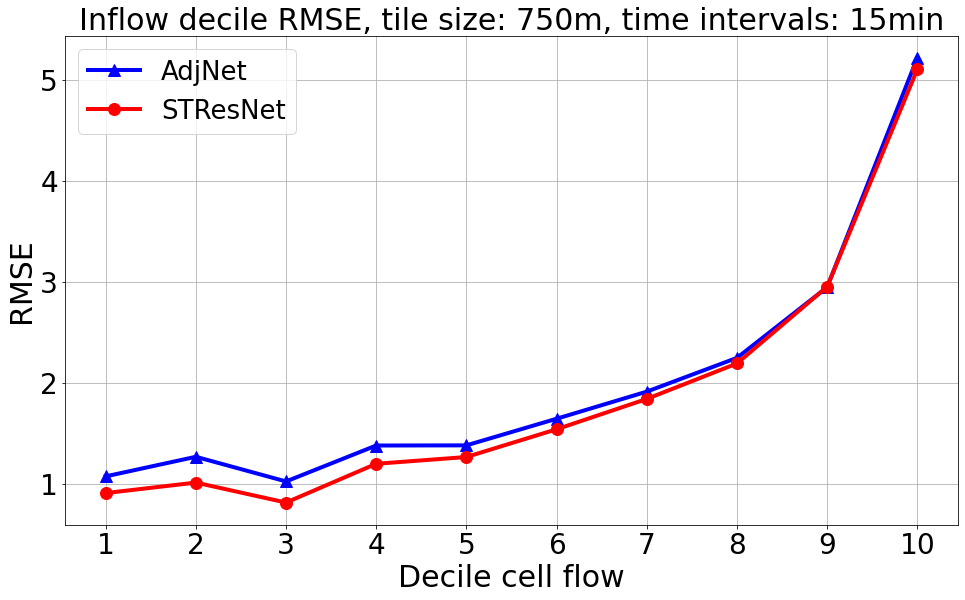

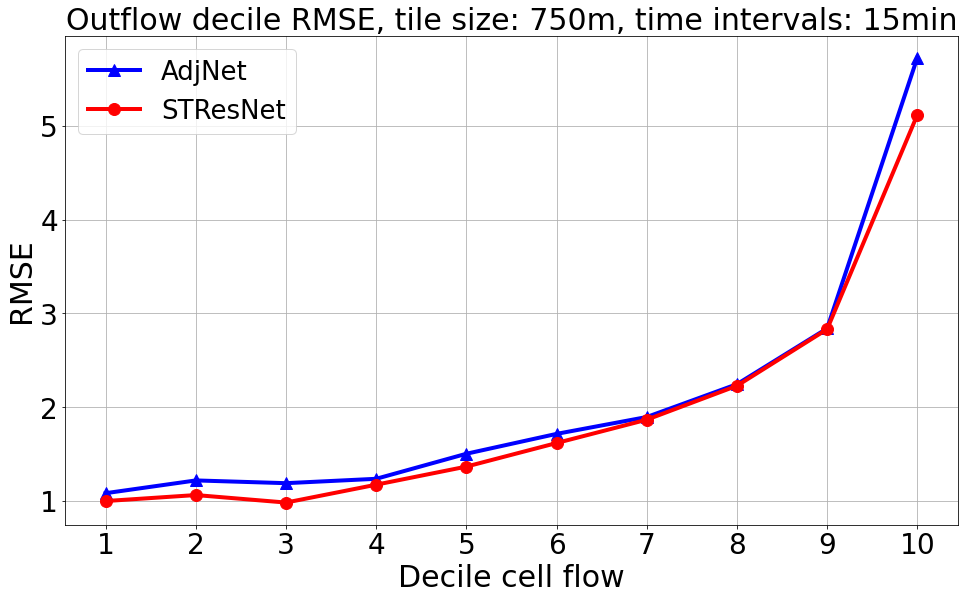

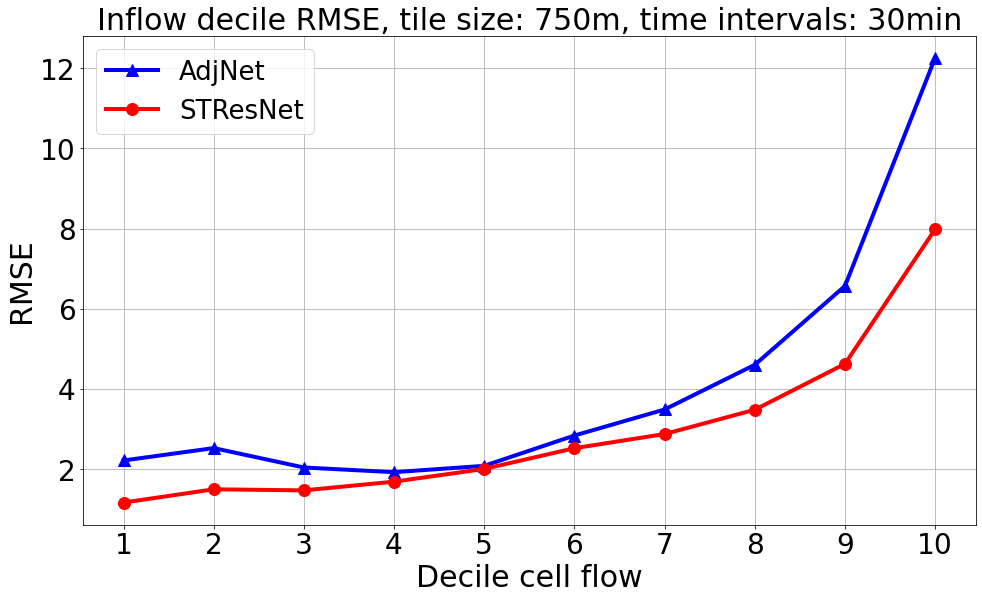

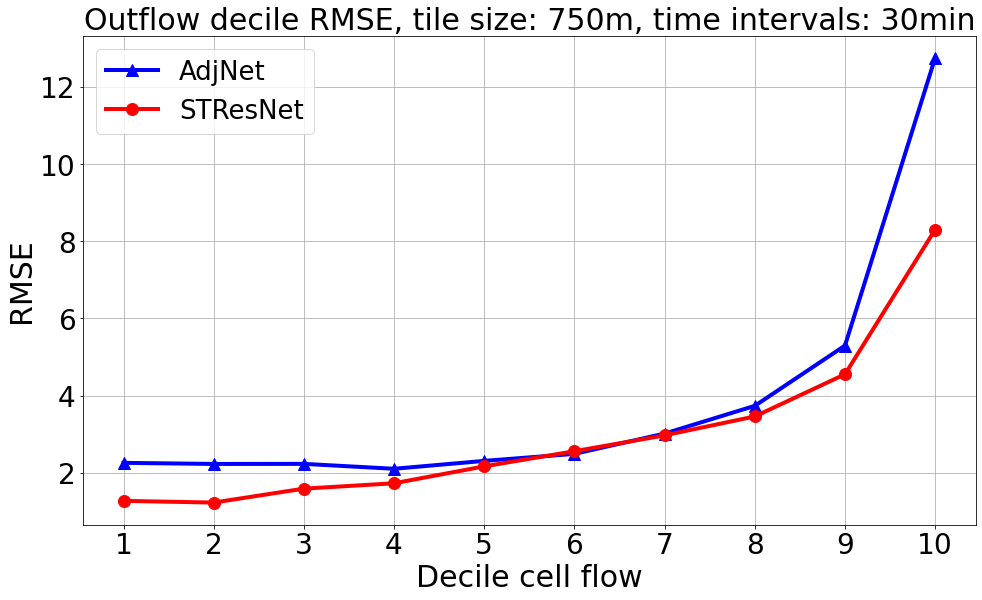

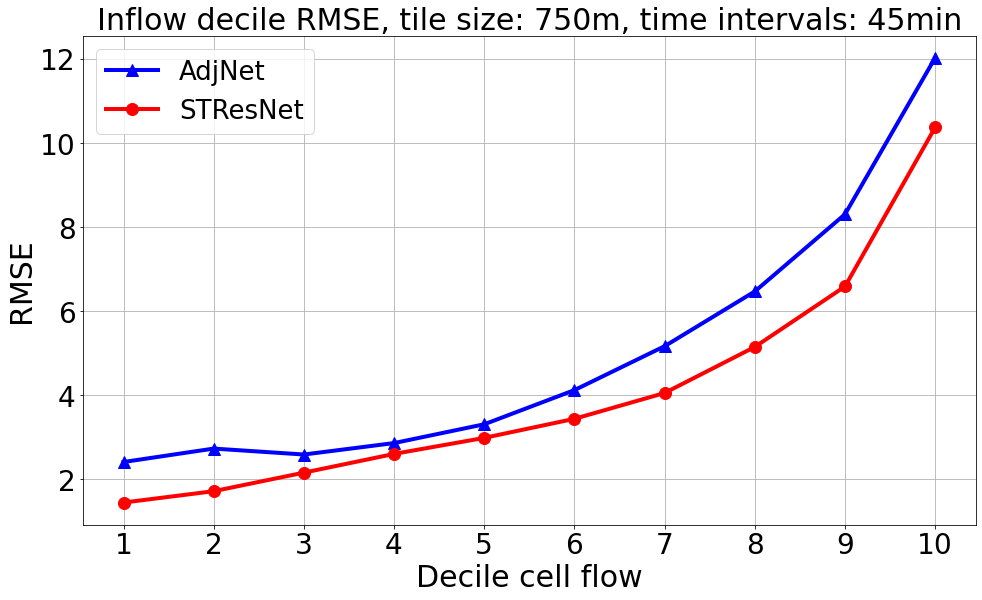

...

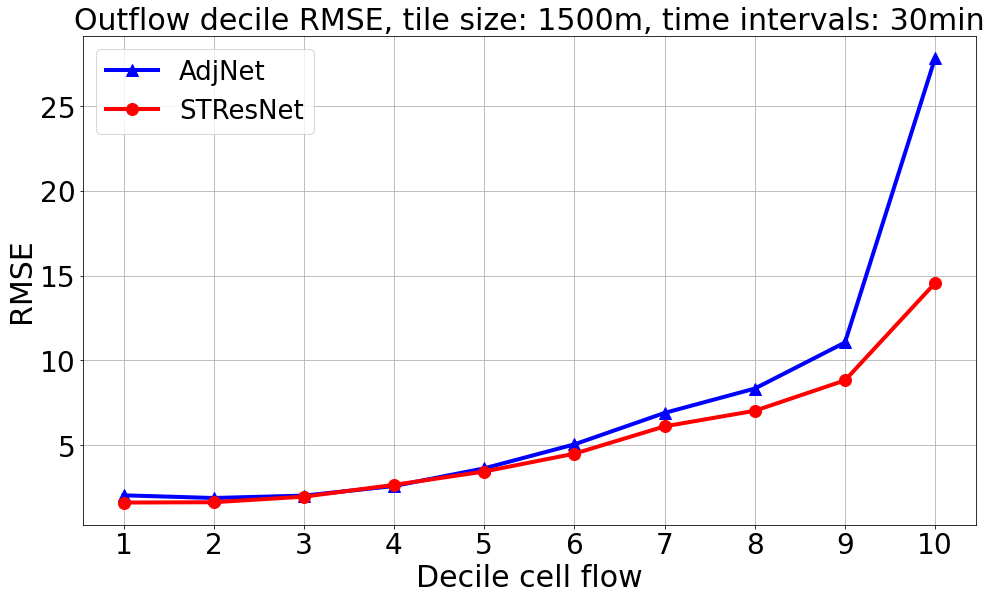

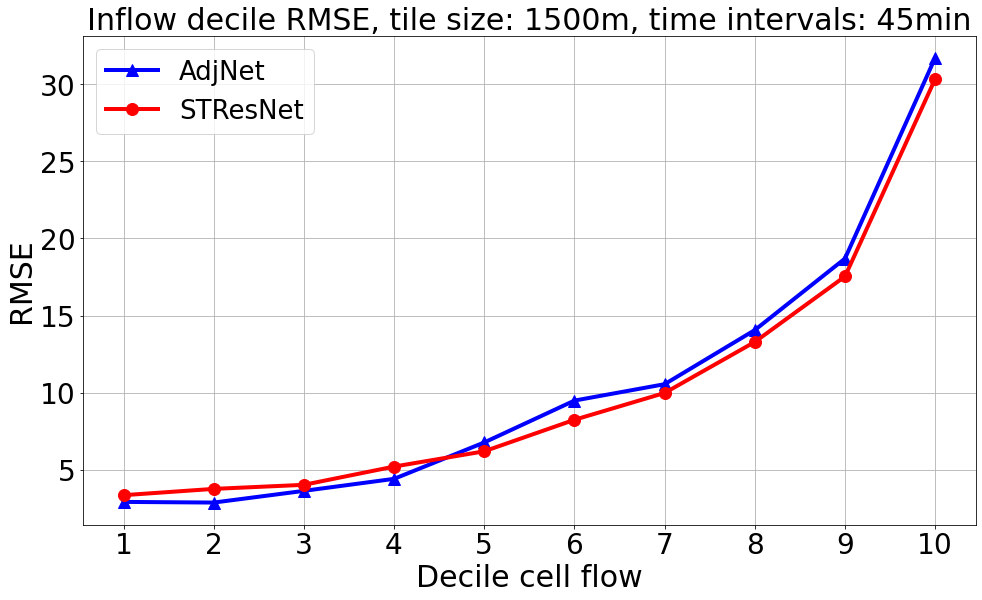

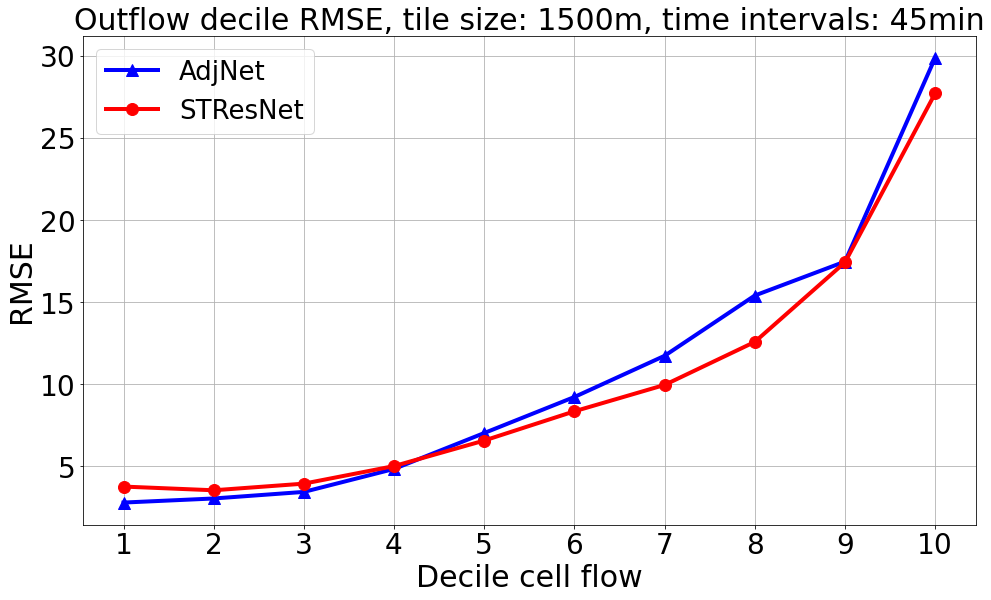

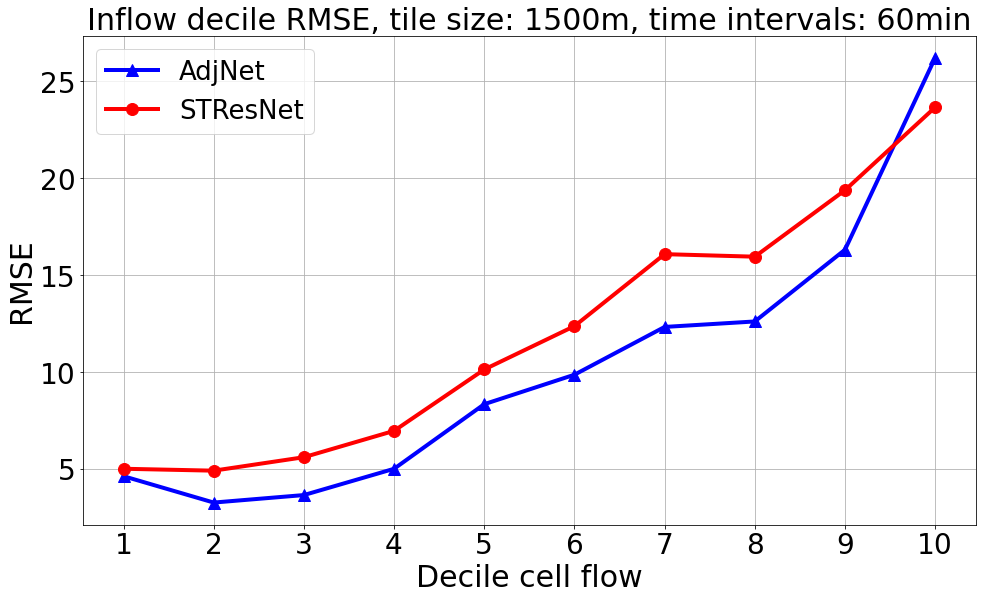

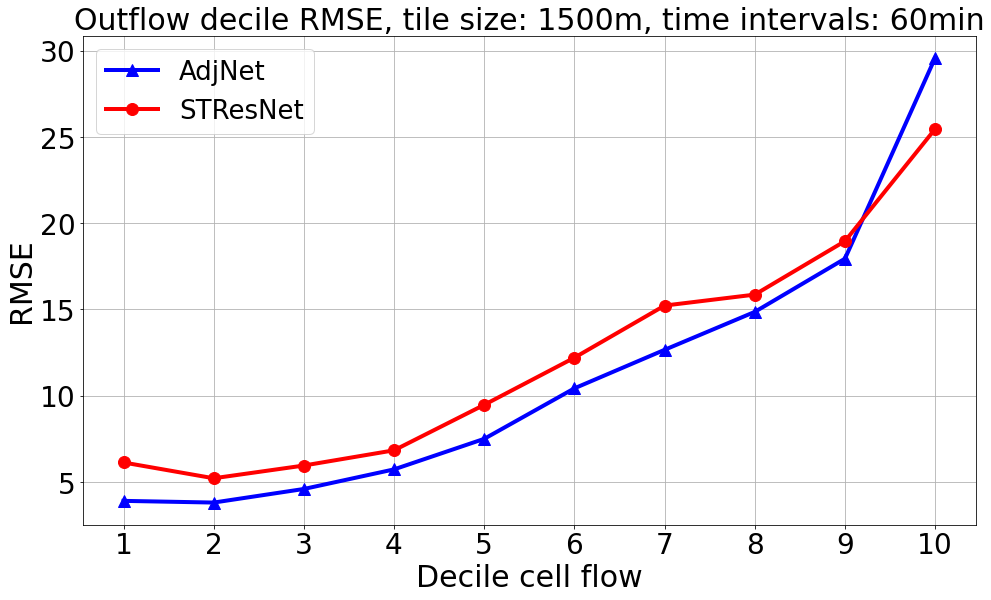

In [534]:
for tile_size in tile_sizes:
    for time_interval in time_intervals:
        for flow in [0,1]:
            show_decile_RMSE(STResNet_real[str(tile_size)+time_interval][11:], 
                          STResNet_pred[str(tile_size)+time_interval][11:], 
                          AdjNet_pred_map[str(tile_size)+time_interval], tile_size, time_interval, flow)

In [399]:
# def show_scatter_plot(real_map, STResNetMap, AdjNetMap, tile_size, time_interval, flow):
#     # Removing zeros
#     A_reshaped = real_map.reshape(real_map.shape[0], real_map.shape[1]*real_map.shape[2], 2)
#     A_reshaped = A_reshaped[:,~(real_map.sum(axis=0).sum(axis=2)==0).flatten()]

#     adjnet_reshaped = AdjNetMap.reshape(AdjNetMap.shape[0], AdjNetMap.shape[1]*AdjNetMap.shape[2], 2)
#     adjnet_reshaped = adjnet_reshaped[:,~(real_map.sum(axis=0).sum(axis=2)==0).flatten()]
#     stresnet_reshaped = STResNetMap.reshape(STResNetMap.shape[0], STResNetMap.shape[1]*STResNetMap.shape[2], 2)
#     stresnet_reshaped = stresnet_reshaped[:,~(real_map.sum(axis=0).sum(axis=2)==0).flatten()]

#     real_map = A_reshaped[:,:,flow].flatten()
#     AdjNetMap = adjnet_reshaped[:,:,flow].flatten()
#     STResNetMap = stresnet_reshaped[:,:,flow].flatten()
    
#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8))
#     flow_str = "Outflow" if flow == 1 else "Inflow"
#     # fig = plt.figure(figsize=(8,8))
#     for ax in (ax1, ax2):
#         ax.set_xlabel('Crowd Flow Real', fontsize=sizes['labels'])
#         ax.set_ylabel('Crowd Flow Predicted', fontsize=sizes['labels'])
#         ax.set_yticks(np.arange(0, real_map.max(), 20))
#         ax.set_xticks(np.arange(0, real_map.max(), 20))
#         ax.set_yticklabels(np.arange(0, real_map.max(), 20, dtype=int), fontsize=sizes['ticks'])
#         ax.set_xticklabels(np.arange(0, real_map.max(), 20, dtype=int), fontsize=sizes['ticks'], rotation=45)
#     # plt.grid()

#     fig.suptitle(flow_str+' Scatterplot without zeros Manhattan area, tile size: '+str(tile_size)+'m, time intervals: '+time_interval, fontsize=22)
#     ax1.set_title("AdjNet", fontsize=sizes['title'])
#     ax1.annotate("r="+"{:.2f}".format(np.corrcoef(real_map.flatten(), AdjNetMap.flatten())[0][1]), (0,real_map.max()-5), fontsize=16)
#     ax1.scatter(
#         real_map, 
#         AdjNetMap)
#     ax1.plot(np.arange(real_map.max()), color = "black")

#     ax2.set_title("STResNet", fontsize=20)
#     ax2.annotate("r="+"{:.2f}".format(np.corrcoef(real_map.flatten(), STResNetMap.flatten())[0][1]), (0,real_map.max()-5), fontsize=16)
#     ax2.scatter(
#         real_map, 
#         STResNetMap)
#     ax2.plot(np.arange(real_map.max()), color = "black")
#     # fig.savefig("scatter_plot_tile"+str(tile_size)+"time_interval"+sample_time+".png")
#     plt.savefig(flow_str+"scatterplot_no_zeros_TileSize"+str(tile_size)+"_TimeInterval"+time_interval+".png")
#     plt.show()

In [400]:
# for tile_size in tile_sizes:
#     for time_interval in time_intervals:
#         for flow in [0,1]:
#             show_scatter_plot(STResNet_real[str(tile_size)+time_interval][11:], 
#                           STResNet_pred[str(tile_size)+time_interval][11:], 
#                           AdjNet_pred_map[str(tile_size)+time_interval], tile_size, time_interval, flow)

In [451]:
sizes = {
    "title" : 26,
    "ticks" : 20,
    "legend" : 20,
    "labels" : 24,
    "suptitle" : 26
}

In [513]:
def show_scatter_plot_quantile(real_map, STResNetMap, AdjNetMap, tile_size, time_interval, flow, quantile = 10):
    # Removing zeros
    A_reshaped = real_map.reshape(real_map.shape[0], real_map.shape[1]*real_map.shape[2], 2)
    A_reshaped = A_reshaped[:,~(real_map.sum(axis=0).sum(axis=2)==0).flatten()]

    adjnet_reshaped = AdjNetMap.reshape(AdjNetMap.shape[0], AdjNetMap.shape[1]*AdjNetMap.shape[2], 2)
    adjnet_reshaped = adjnet_reshaped[:,~(real_map.sum(axis=0).sum(axis=2)==0).flatten()]
    stresnet_reshaped = STResNetMap.reshape(STResNetMap.shape[0], STResNetMap.shape[1]*STResNetMap.shape[2], 2)
    stresnet_reshaped = stresnet_reshaped[:,~(real_map.sum(axis=0).sum(axis=2)==0).flatten()]

    real_map = A_reshaped[:,:,flow].flatten()
    AdjNetMap = adjnet_reshaped[:,:,flow].flatten()
    STResNetMap = stresnet_reshaped[:,:,flow].flatten()
    
    # Error scatter plot decili
    p_flat = real_map.flatten()
    p = p_flat.argsort()
    stresnet_real_perm = p_flat[p]
    # P_reshaped = P_reshaped[p]

    decili_real = [d for d in np.array_split(stresnet_real_perm, quantile)]
    # decili_pred = [d for d in np.array_split(P_reshaped, quantile)]

    mean_std_real = np.array([(decili_real[i].mean(), decili_real[i].std()) for i in range(quantile)])

    # Permuting A_reshaped and applying the same permutation to the prediction
    p_flat = STResNetMap.flatten()
    stresnet_pred_perm = p_flat[p]
    # P_reshaped = P_reshaped[p]

    decili = [d for d in np.array_split(stresnet_pred_perm, quantile)]
    # decili_pred = [d for d in np.array_split(P_reshaped, quantile)]

    mean_std_stresnet = np.array([(decili[i].mean(), decili[i].std()) for i in range(quantile)])


    ### AdjNet
    p_flat = AdjNetMap.flatten()
    adjnet_pred_perm = p_flat[p]
    # P_reshaped = P_reshaped[p]

    decili_adjnet = [d for d in np.array_split(adjnet_pred_perm, quantile)]
    # decili_pred = [d for d in np.array_split(P_reshaped, quantile)]

    mean_std_adjnet = np.array([(decili_adjnet[i].mean(), decili_adjnet[i].std()) for i in range(quantile)])

    # Plot figure
    plt.figure(figsize=(16,9))
    flow_str = "Outflow" if flow == 1 else "Inflow"
    plt.title('Mean and std '+flow_str+' per decile, tile size: '+str(tile_size)+'m, time intervals: '+time_interval, fontsize=sizes['title'])
    plt.errorbar(list(range(quantile)), mean_std_stresnet[:,0],mean_std_stresnet[:,1],  color='blue', label="STResNet", linewidth=4)
    plt.errorbar(np.sum([list(range(quantile)), [0.05]*quantile], axis=0), mean_std_adjnet[:,0], mean_std_adjnet[:,1] , color='red', label="AdjNet", linewidth=4)
    plt.errorbar(np.sum([list(range(quantile)), [-0.05]*quantile], axis=0), mean_std_real[:,0], mean_std_real[:,1] , color='black', label="Real", linestyle='--', linewidth=4)
    plt.xlabel("Decile", fontsize=sizes['labels'])
    plt.ylabel("Mean and std "+flow_str, fontsize=sizes['labels'])
    plt.xticks(list(range(10)), list(range(1, 11)), fontsize=sizes['ticks'])
    plt.yticks(fontsize=sizes['ticks'])
    plt.legend(fontsize=sizes['legend'], loc="upper left")
    plt.grid()
    plt.savefig("Decile_MeanSTD_"+flow_str+"_"+str(tile_size)+"m_"+time_interval+".png")
    plt.show()

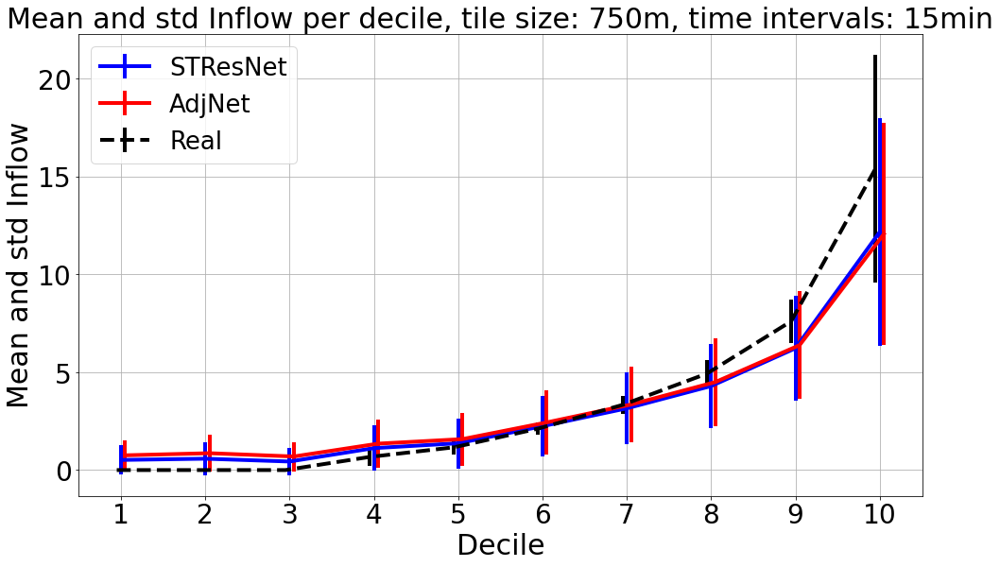

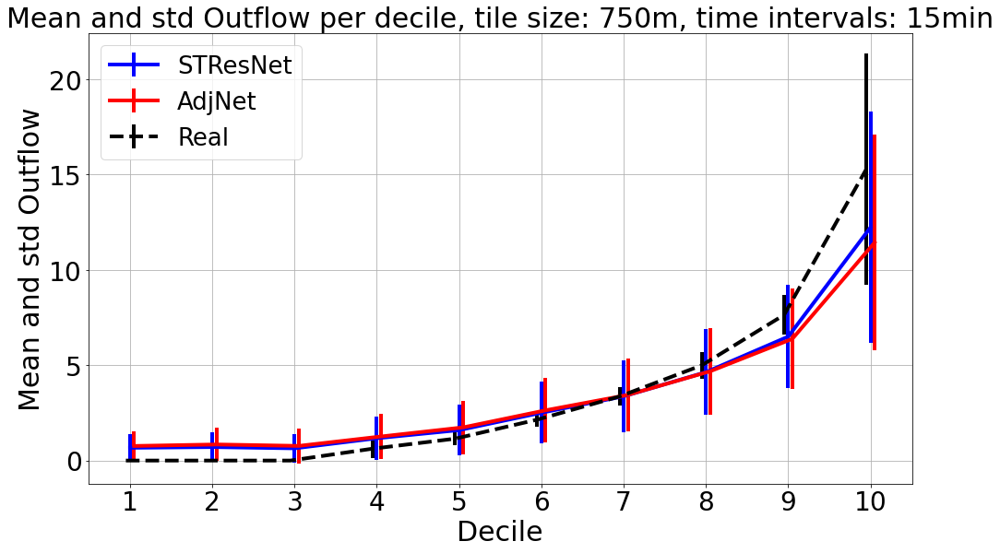

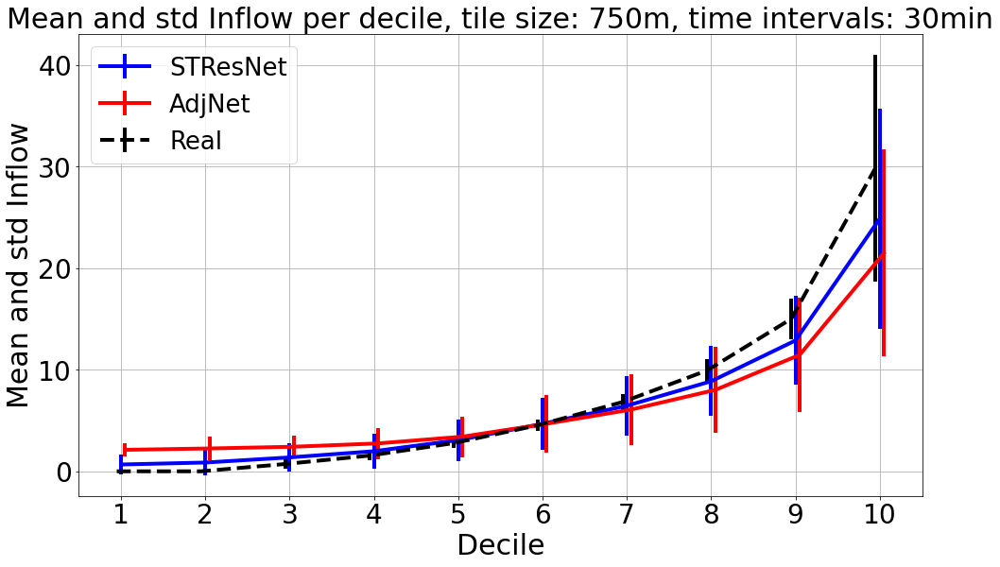

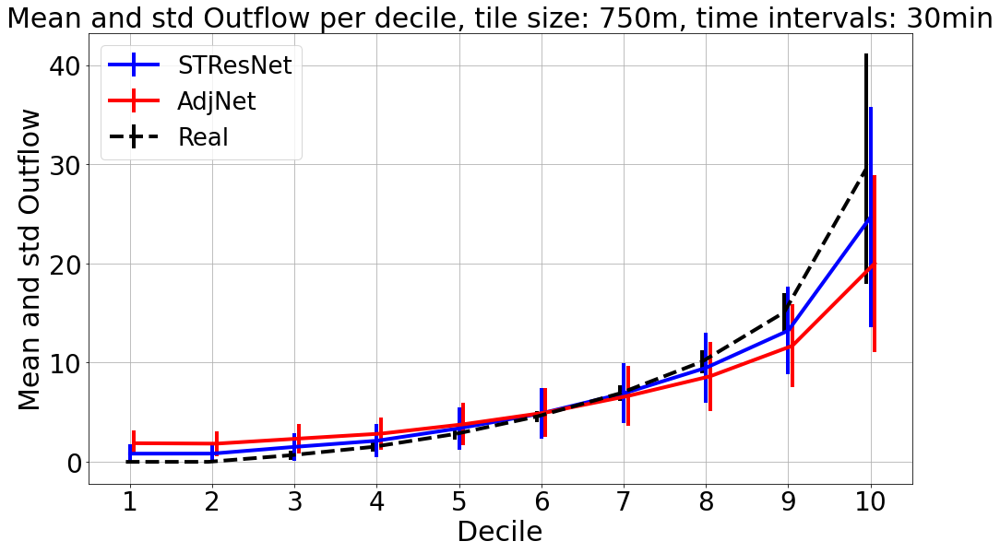

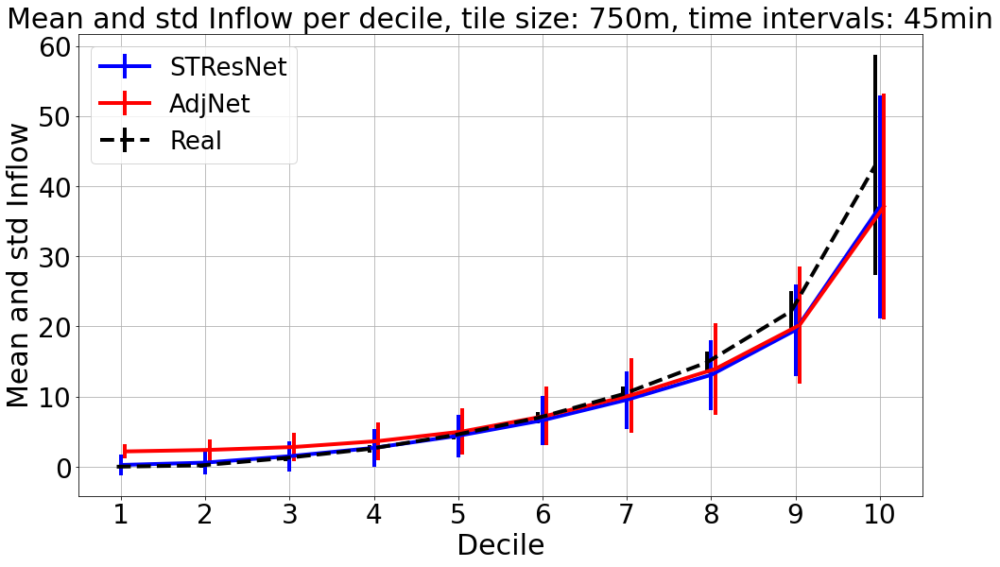

...

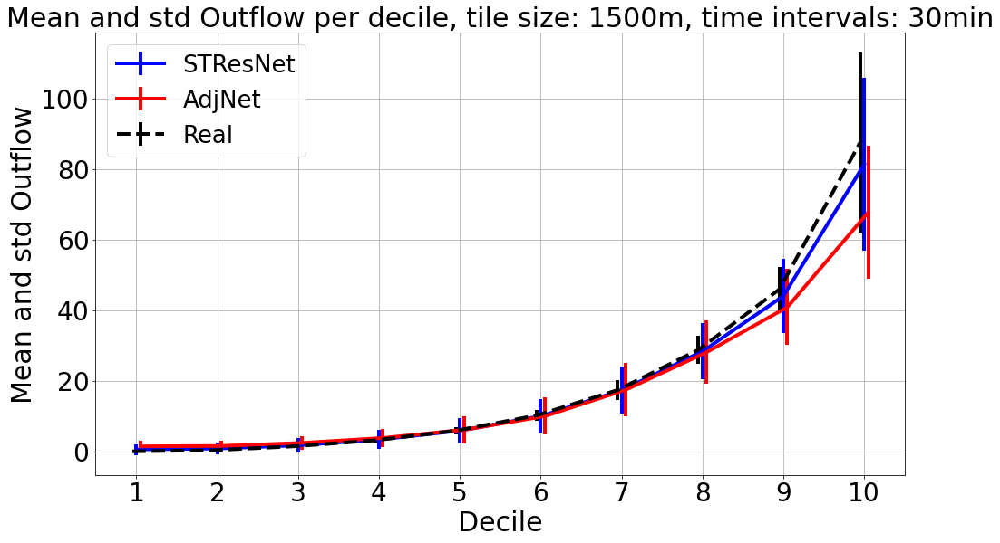

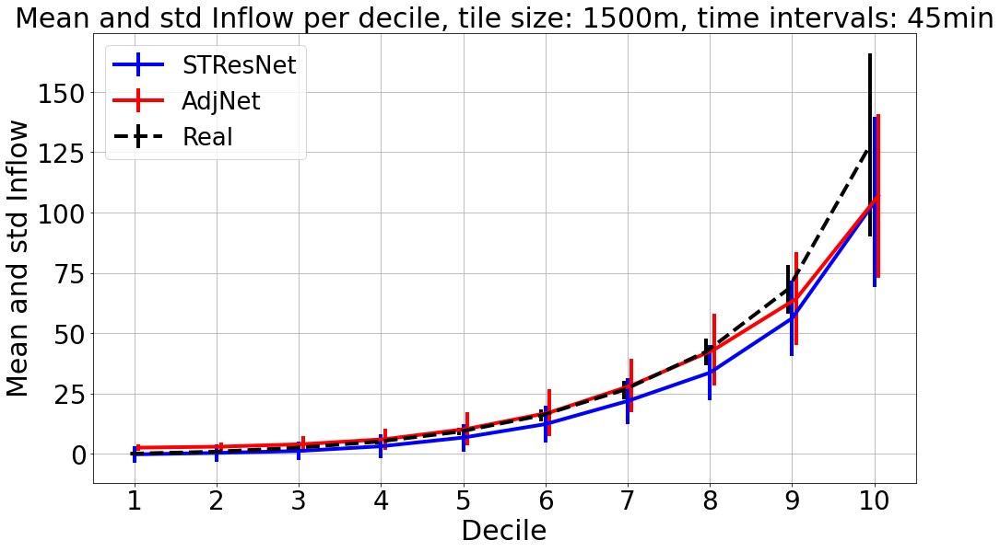

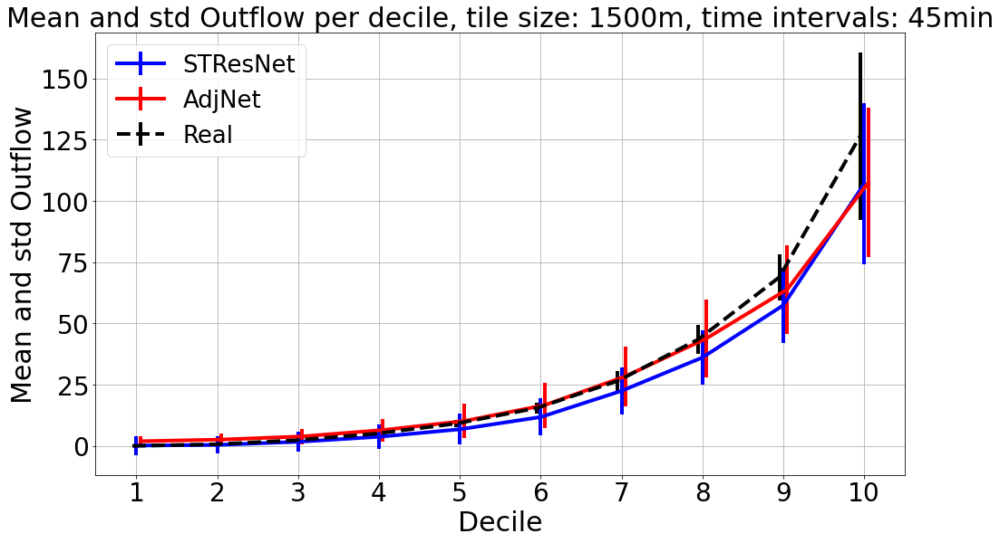

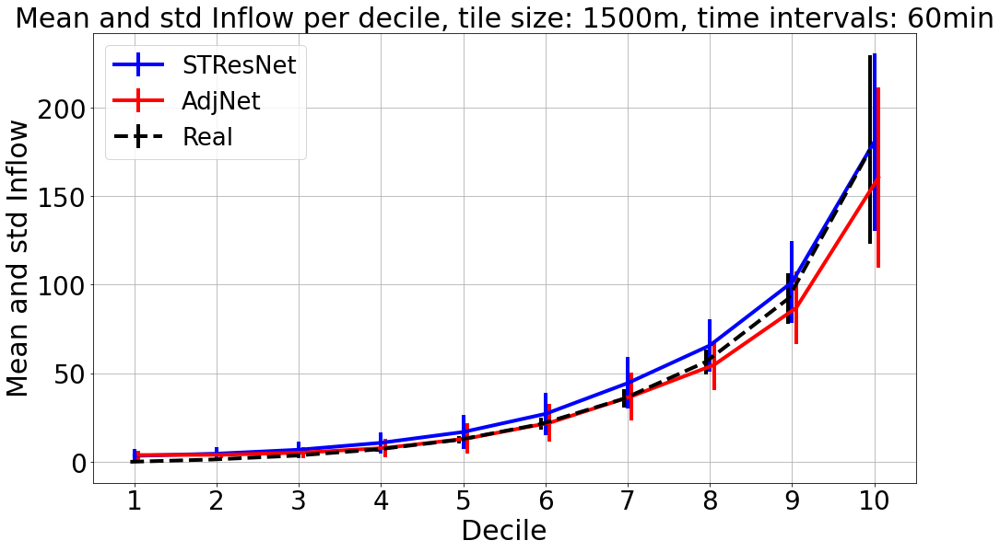

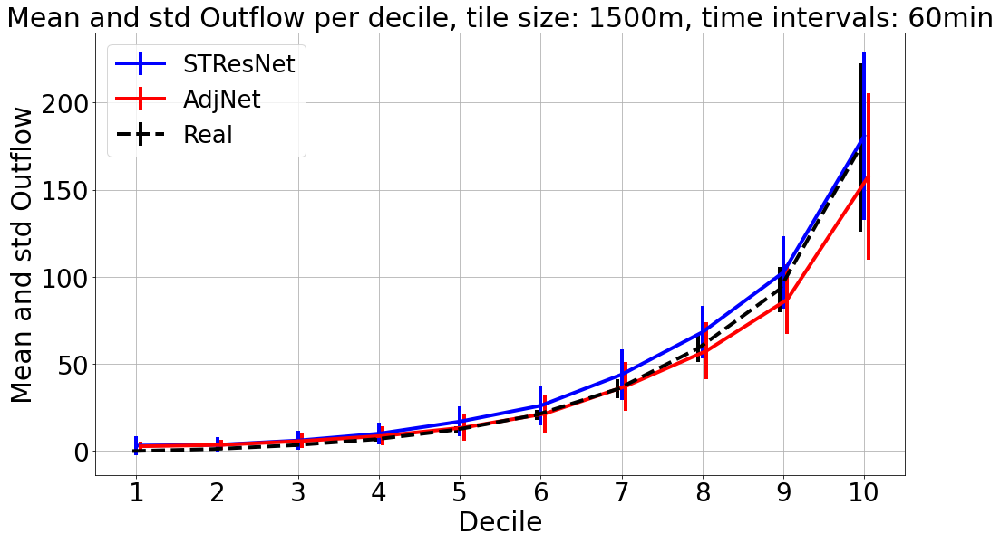

In [514]:
for tile_size in tile_sizes:
    for time_interval in time_intervals:
        for flow in [0,1]:
            show_scatter_plot_quantile(STResNet_real[str(tile_size)+time_interval][11:], 
                          STResNet_pred[str(tile_size)+time_interval][11:], 
                          AdjNet_pred_map[str(tile_size)+time_interval], tile_size, time_interval, flow)

In [525]:
def show_scatter_plot_with_zeros(real_map, STResNetMap, AdjNetMap, tile_size, time_interval, flow):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    flow_str = "Outflow" if flow == 1 else "Inflow"
    # fig = plt.figure(figsize=(8,8))
    for ax in (ax1, ax2):
        ax.set_xlabel('Crowd Flow Real', fontsize=sizes['labels'])
        ax.set_ylabel('Crowd Flow Predicted', fontsize=sizes['labels'])
        ax.set_yticks(np.arange(0, real_map.max(), 30))
        ax.set_xticks(np.arange(0, real_map.max(), 30))
        ax.set_yticklabels(np.arange(0, real_map.max(), 30, dtype=int), fontsize=sizes['ticks'])
        ax.set_xticklabels(np.arange(0, real_map.max(), 30, dtype=int), fontsize=sizes['ticks'], rotation=45)
    # plt.grid()

    fig.suptitle(flow_str+' Scatterplot, tile size: '+str(tile_size)+'m, time intervals: '+time_interval, fontsize=sizes['suptitle'])
    ax1.set_title("AdjNet", fontsize=sizes['title'])
    ax1.annotate("r="+"{:.2f}".format(np.corrcoef(real_map.flatten(), AdjNetMap.flatten())[0][1]), (0,real_map.max()-5), fontsize=sizes['legend'])
    ax1.scatter(
        real_map[:,:,:,flow], 
        AdjNetMap[:,:,:,flow])
    ax1.plot(np.arange(real_map.max()), color = "black")

    ax2.set_title("STResNet", fontsize=24)
    ax2.annotate("r="+"{:.2f}".format(np.corrcoef(real_map.flatten(), STResNetMap.flatten())[0][1]), (0,real_map.max()-5), fontsize=sizes['legend'])
    ax2.scatter(
        real_map[:,:,:,flow], 
        STResNetMap[:,:,:,flow])
    ax2.plot(np.arange(real_map.max()), color = "black")
    plt.savefig("Scatterplot_"+flow_str+"_"+str(tile_size)+"m_"+time_interval+".png")
    plt.show()

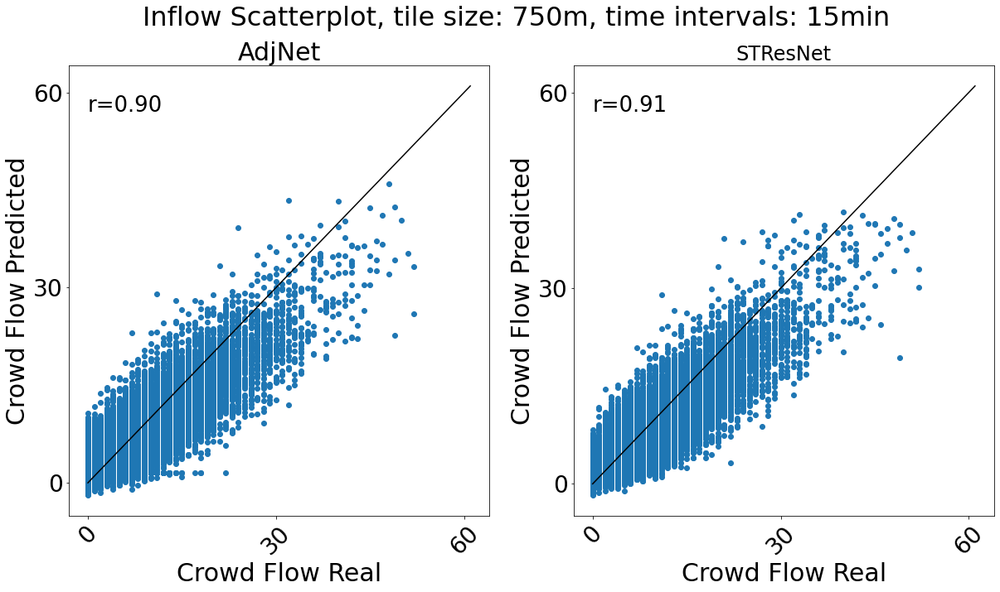

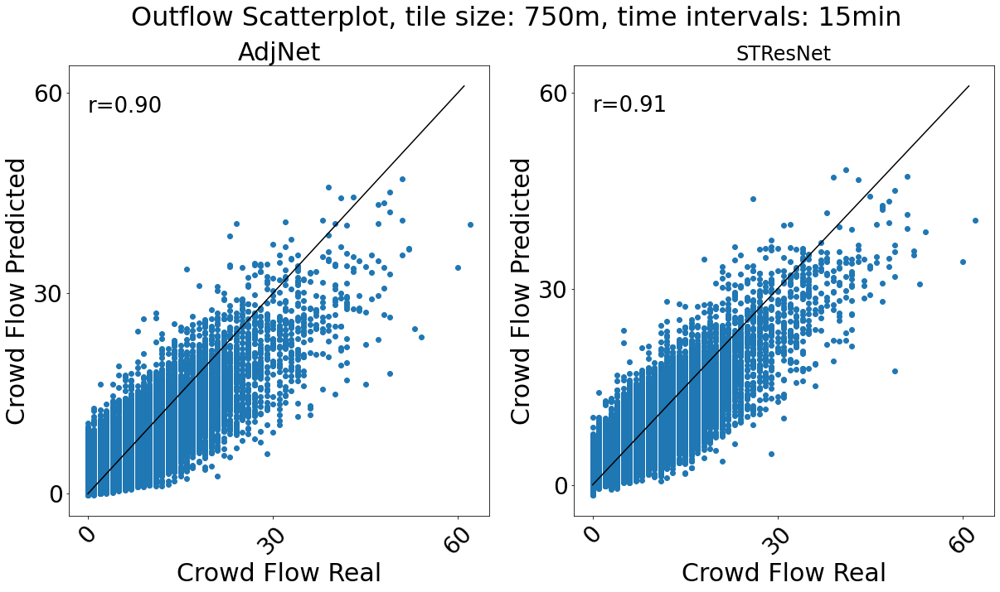

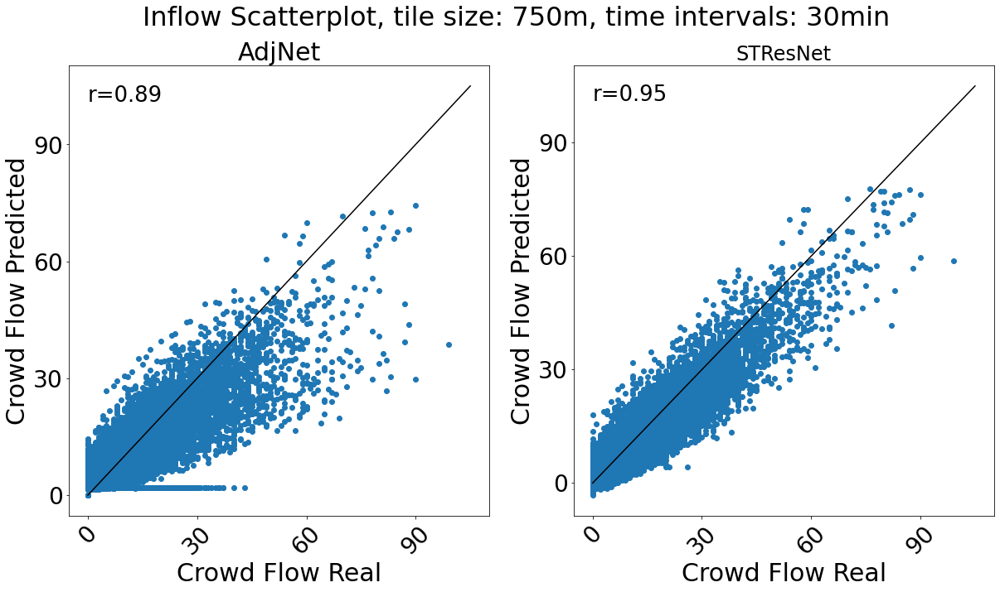

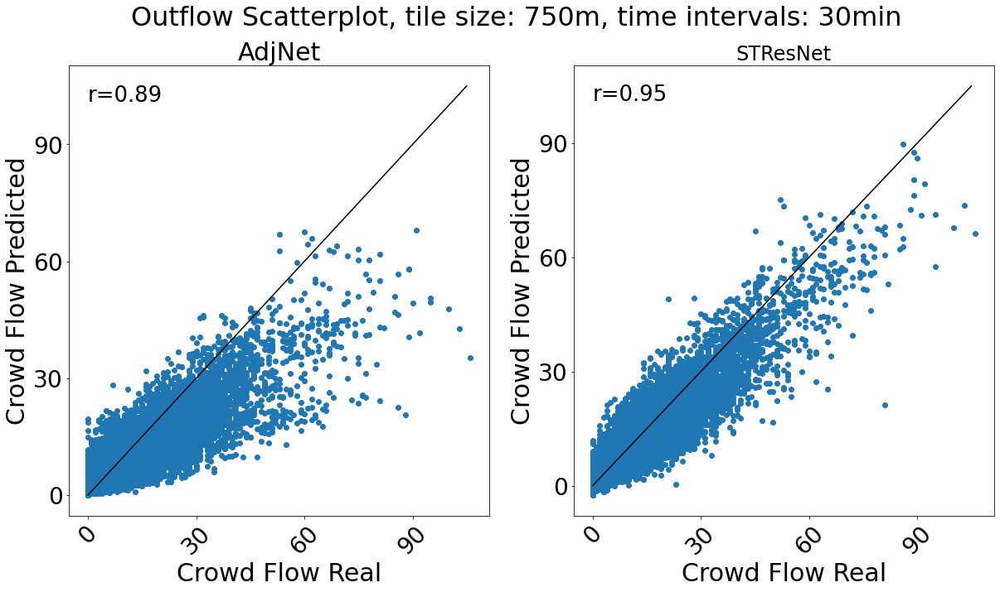

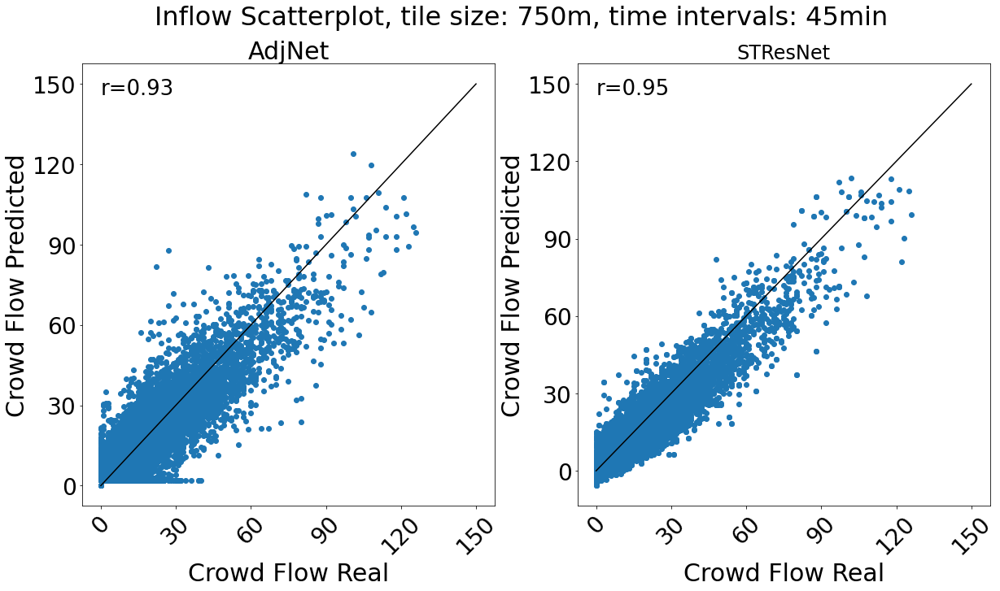

...

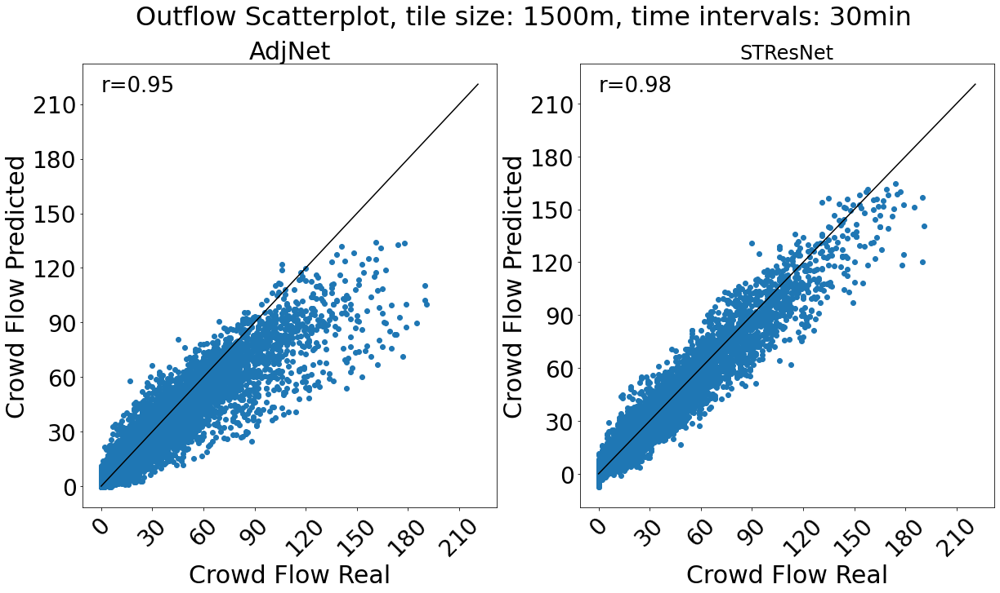

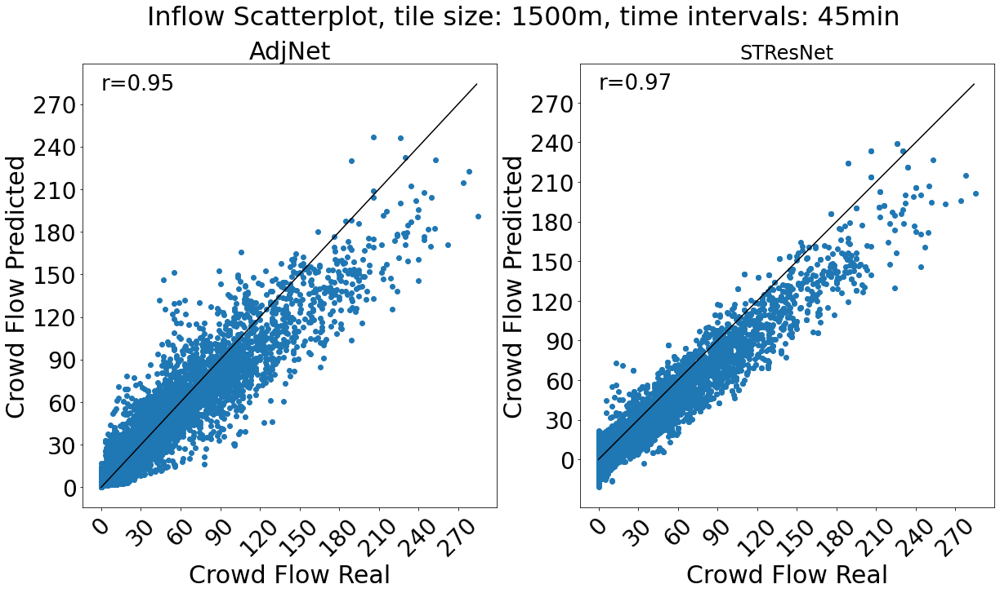

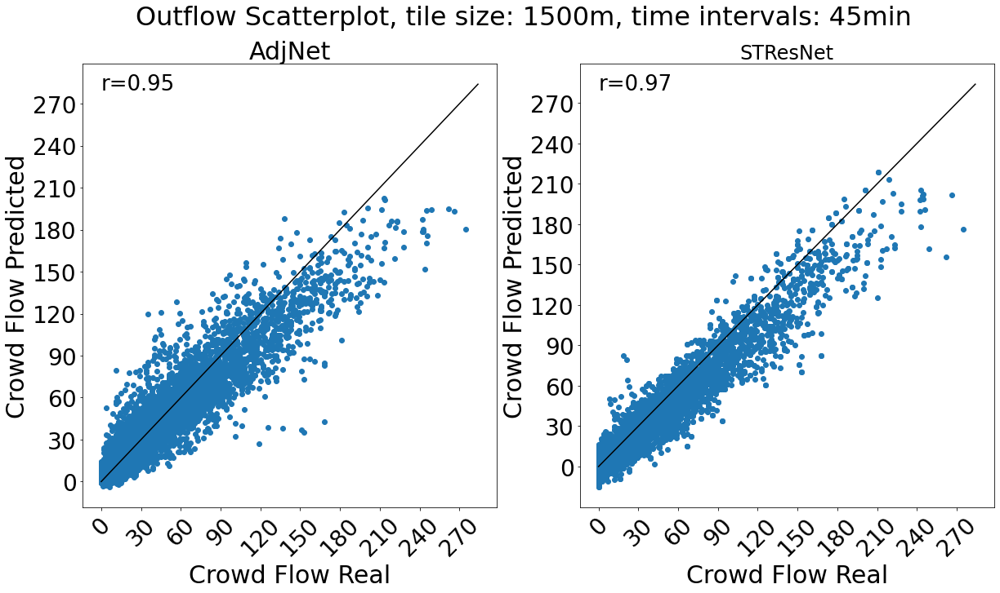

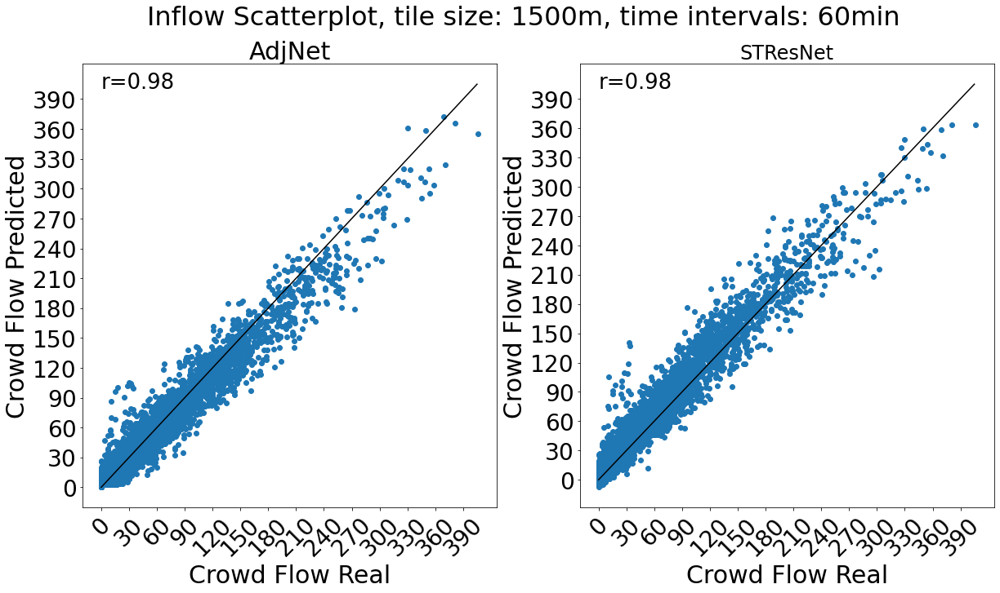

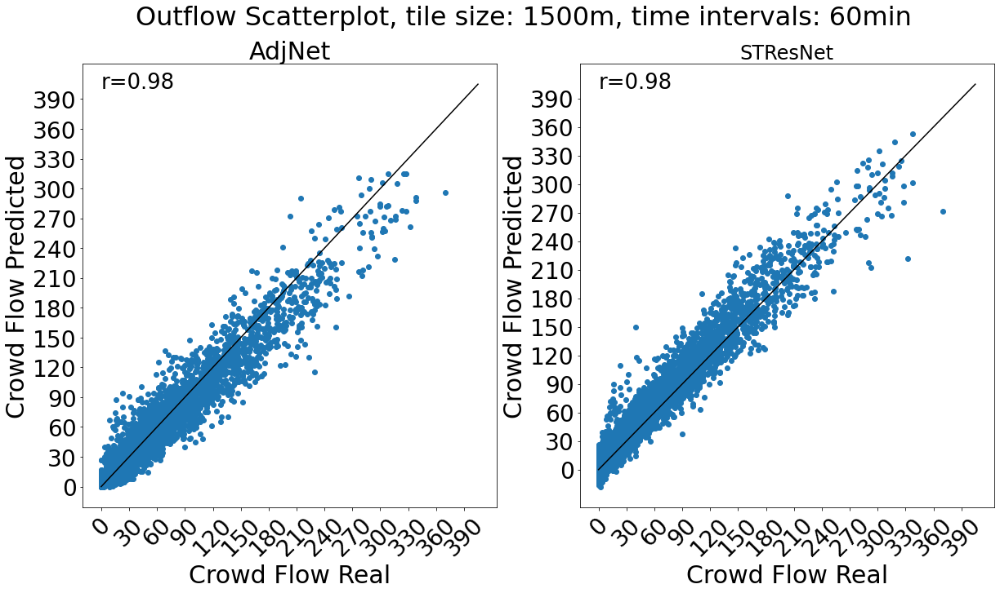

In [526]:
for tile_size in tile_sizes:
    for time_interval in time_intervals:
        for flow in [0,1]:
            show_scatter_plot_with_zeros(STResNet_real[str(tile_size)+time_interval][11:], 
                          STResNet_pred[str(tile_size)+time_interval][11:], 
                          AdjNet_pred_map[str(tile_size)+time_interval], tile_size, time_interval, flow)

In [343]:
# def show_scatter_plot_quantile_with_zeros(real_map, STResNetMap, AdjNetMap, tile_size, time_interval, flow, quantile = 10):
#     real_map = real_map[:,:,:,flow].flatten()
#     AdjNetMap = AdjNetMap[:,:,:,flow].flatten()
#     STResNetMap = STResNetMap[:,:,:,flow].flatten()
    
#     # Error scatter plot decili
#     p_flat = real_map.flatten()
#     p = p_flat.argsort()
#     stresnet_real_perm = p_flat[p]
#     # P_reshaped = P_reshaped[p]

#     decili_real = [d for d in np.array_split(stresnet_real_perm, quantile)]
#     # decili_pred = [d for d in np.array_split(P_reshaped, quantile)]

#     mean_std_real = np.array([(decili_real[i].mean(), decili_real[i].std()) for i in range(quantile)])

#     # Permuting A_reshaped and applying the same permutation to the prediction
#     p_flat = STResNetMap.flatten()
#     stresnet_pred_perm = p_flat[p]
#     # P_reshaped = P_reshaped[p]

#     decili = [d for d in np.array_split(stresnet_pred_perm, quantile)]
#     # decili_pred = [d for d in np.array_split(P_reshaped, quantile)]

#     mean_std_stresnet = np.array([(decili[i].mean(), decili[i].std()) for i in range(quantile)])


#     ### AdjNet
#     p_flat = AdjNetMap.flatten()
#     adjnet_pred_perm = p_flat[p]
#     # P_reshaped = P_reshaped[p]

#     decili_adjnet = [d for d in np.array_split(adjnet_pred_perm, quantile)]
#     # decili_pred = [d for d in np.array_split(P_reshaped, quantile)]

#     mean_std_adjnet = np.array([(decili_adjnet[i].mean(), decili_adjnet[i].std()) for i in range(quantile)])

#     # Plot figure
#     plt.figure(figsize=(16,9))
#     flow_str = "Outflow" if flow == 1 else "Inflow"
#     plt.title('Mean and std '+flow_str+' per decile with 0s, tile size: '+str(tile_size)+'m, time intervals: '+time_interval, fontsize=24)
#     plt.errorbar(list(range(quantile)), mean_std_stresnet[:,0],mean_std_stresnet[:,1],  color='blue', label="STResNet", linewidth=4)
#     plt.errorbar(np.sum([list(range(quantile)), [0.05]*quantile], axis=0), mean_std_adjnet[:,0], mean_std_adjnet[:,1] , color='red', label="AdjNet", linewidth=4)
#     plt.errorbar(np.sum([list(range(quantile)), [-0.05]*quantile], axis=0), mean_std_real[:,0], mean_std_real[:,1] , color='black', label="Real", linestyle='--', linewidth=4)
#     plt.xlabel("Decile", fontsize=24)
#     plt.ylabel("Mean and std "+flow_str, fontsize=24)
#     plt.xticks(list(range(10)), list(range(1, 11)), fontsize=20)
#     plt.yticks(fontsize=20)
#     plt.legend(fontsize=18, loc="upper left")
#     plt.grid()
#     plt.savefig(flow_str+"scatterplot_withzeros_TileSize"+str(tile_size)+"_TimeInterval"+time_interval+".png")
#     plt.show()

In [404]:
# for tile_size in tile_sizes:
#     for time_interval in time_intervals:
#         for flow in [0,1]:
#             show_scatter_plot_quantile_with_zeros(STResNet_real[str(tile_size)+time_interval][11:], 
#                           STResNet_pred[str(tile_size)+time_interval][11:], 
#                           AdjNet_pred_map[str(tile_size)+time_interval], tile_size, time_interval, flow)

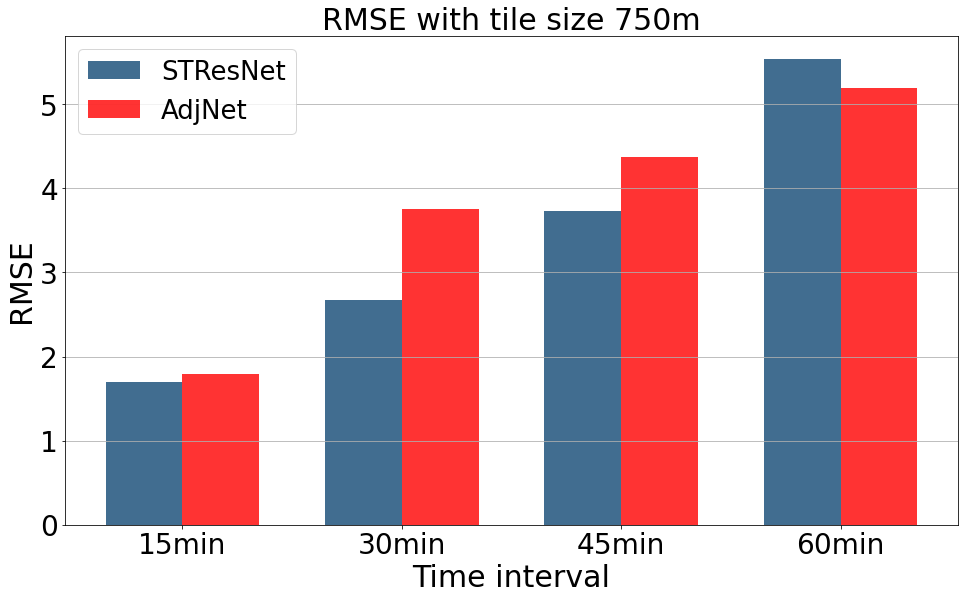

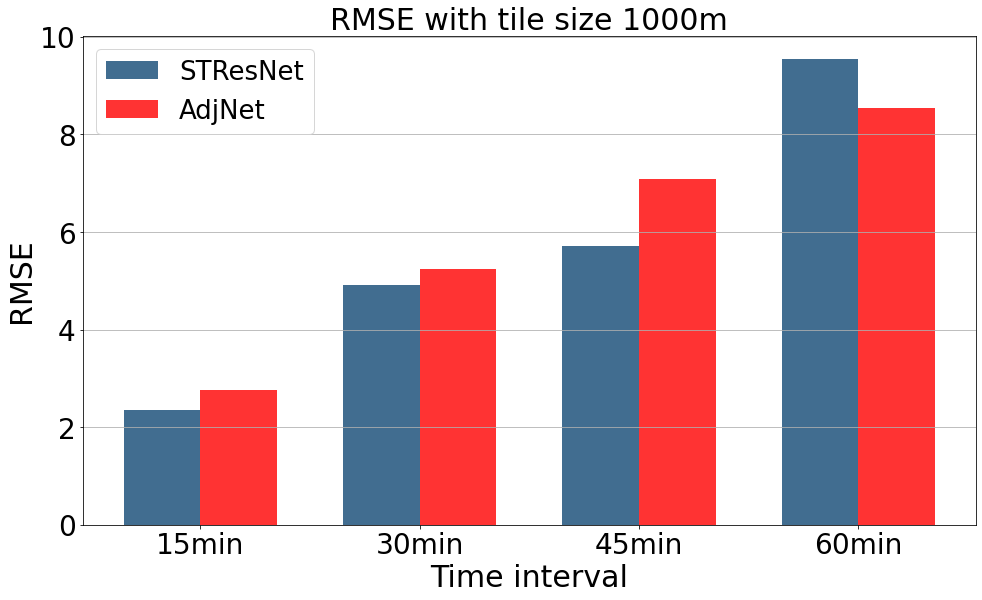

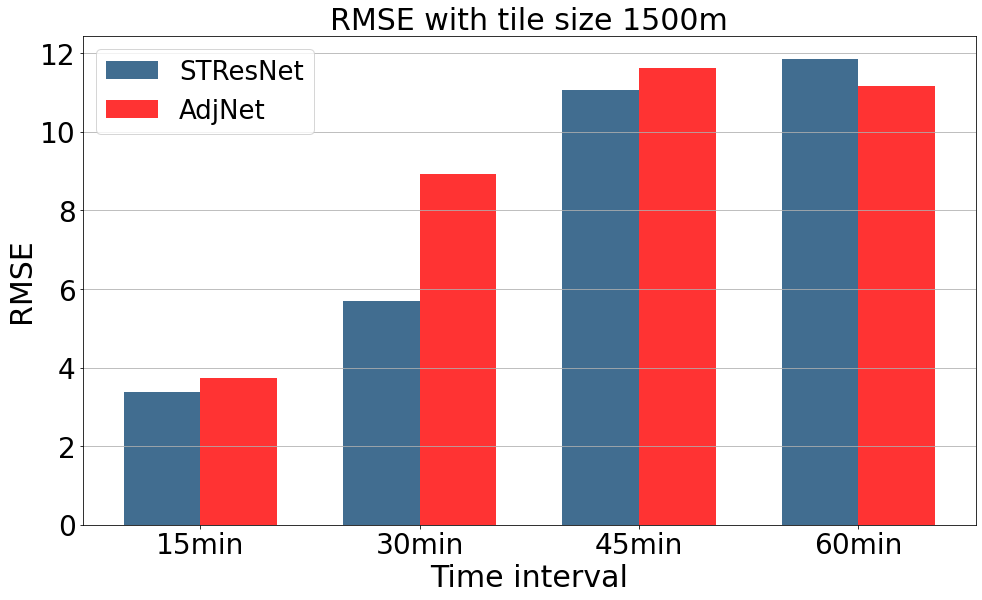

In [750]:
labels = ['15min', '30min', '45min', '60min']

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

for tile_size in tile_sizes:
    plt.figure(figsize=(16,9))
    plt.xlabel("Time interval", fontsize=sizes['labels'])
    plt.ylabel("RMSE", fontsize=sizes['labels'])
    plt.xticks(x, labels, fontsize=sizes['ticks'])
    plt.yticks(fontsize=sizes['ticks'])
    plt.title('RMSE with tile size '+str(tile_size)+'m', fontsize=sizes['title'])
    stresnet_error = []
    adjnet_error = []
    for time_interval in time_intervals:
        stresnet_error.append(mean_squared_error(STResNet_real[str(tile_size)+time_interval][11:].flatten(), STResNet_pred[str(tile_size)+time_interval][11:].flatten(), squared=False))
        adjnet_error.append(mean_squared_error(STResNet_real[str(tile_size)+time_interval][11:].flatten(), AdjNet_pred_map[str(tile_size)+time_interval].flatten(), squared=False))
    rects1 = plt.bar(x - width/2, stresnet_error, width, label='STResNet', color='#124874', alpha=0.8)
    rects2 = plt.bar(x + width/2, adjnet_error, width, label='AdjNet', color='red', alpha=0.8)
    plt.legend(fontsize=sizes['legend'], loc="upper left")
    plt.grid(axis="y")
    plt.savefig("ErrorBar_fixedTileSize"+str(tile_size)+".png")
    plt.show()

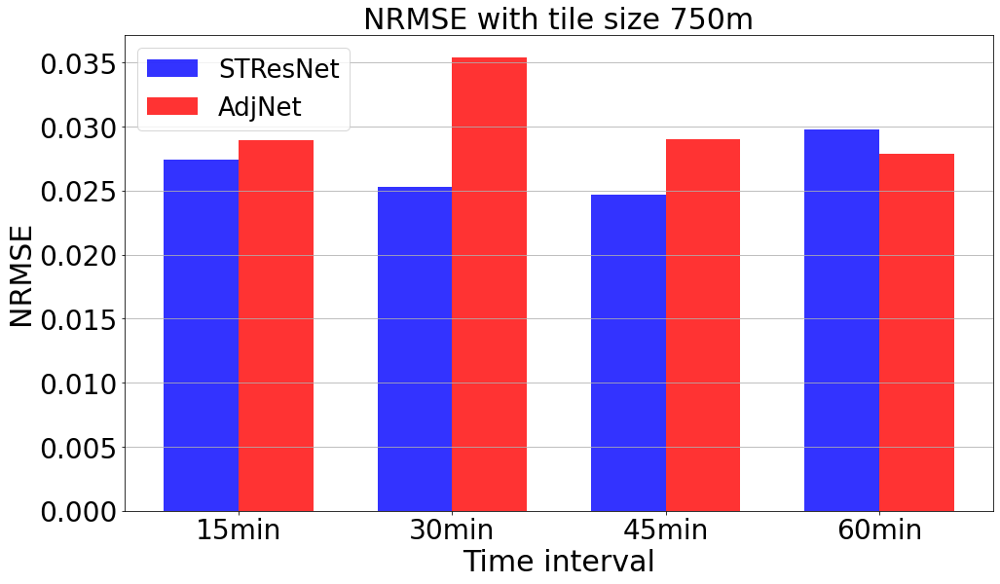

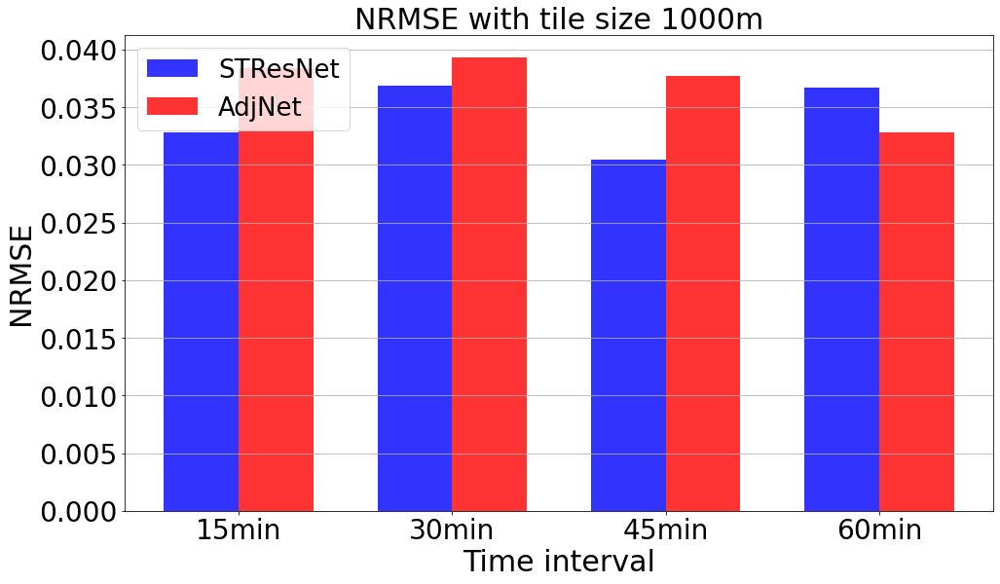

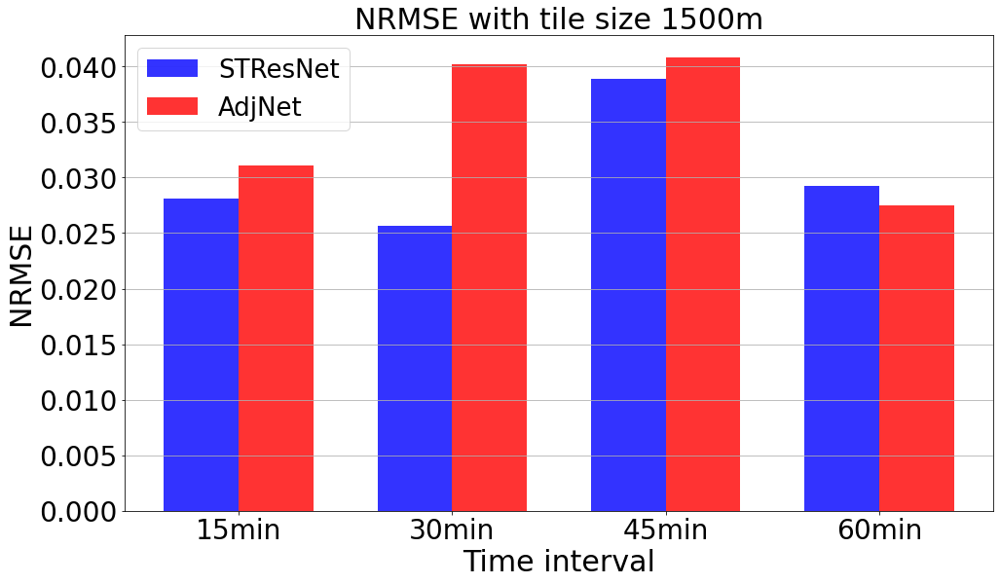

In [529]:
labels = ['15min', '30min', '45min', '60min']

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

for tile_size in tile_sizes:
    plt.figure(figsize=(16,9))
    plt.xlabel("Time interval", fontsize=sizes['labels'])
    plt.ylabel("NRMSE", fontsize=sizes['labels'])
    plt.xticks(x, labels, fontsize=sizes['ticks'])
    plt.yticks(fontsize=sizes['ticks'])
    plt.title('NRMSE with tile size '+str(tile_size)+'m', fontsize=sizes['title'])
    stresnet_error = []
    adjnet_error = []
    for time_interval in time_intervals:
        stresnet_error.append(mean_squared_error(STResNet_real[str(tile_size)+time_interval][11:].flatten(), STResNet_pred[str(tile_size)+time_interval][11:].flatten(), squared=False)/STResNet_real[str(tile_size)+time_interval][11:].max())
        adjnet_error.append(mean_squared_error(STResNet_real[str(tile_size)+time_interval][11:].flatten(), AdjNet_pred_map[str(tile_size)+time_interval].flatten(), squared=False)/STResNet_real[str(tile_size)+time_interval][11:].max())
    rects1 = plt.bar(x - width/2, stresnet_error, width, label='STResNet', color='blue', alpha=0.8)
    rects2 = plt.bar(x + width/2, adjnet_error, width, label='AdjNet', color='red', alpha=0.8)
    plt.legend(fontsize=sizes['legend'], loc="upper left")
    plt.grid(axis="y")
    plt.savefig("NormalisedErrorBar_fixedTileSize"+str(tile_size)+".png")
    plt.show()

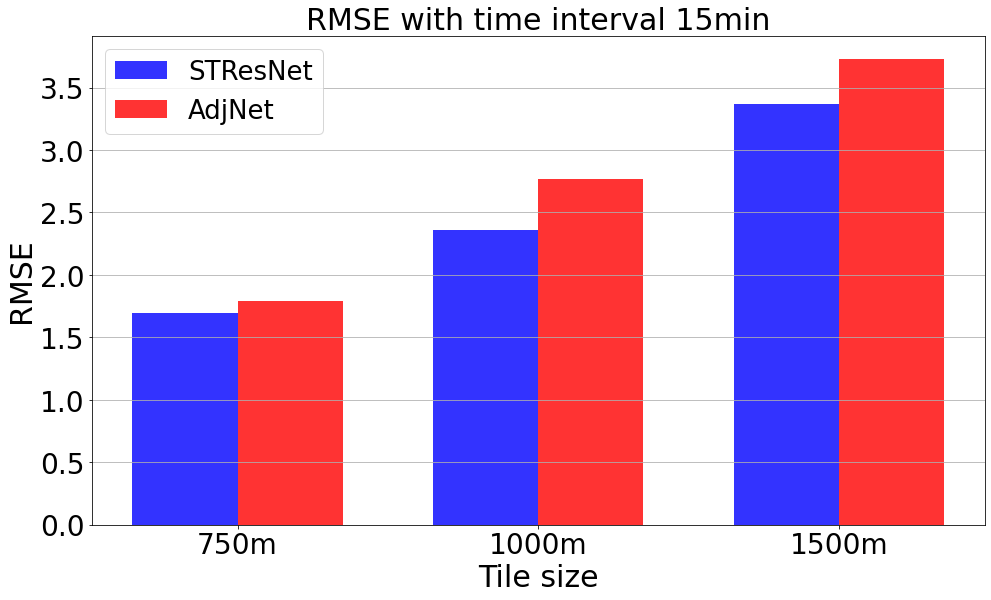

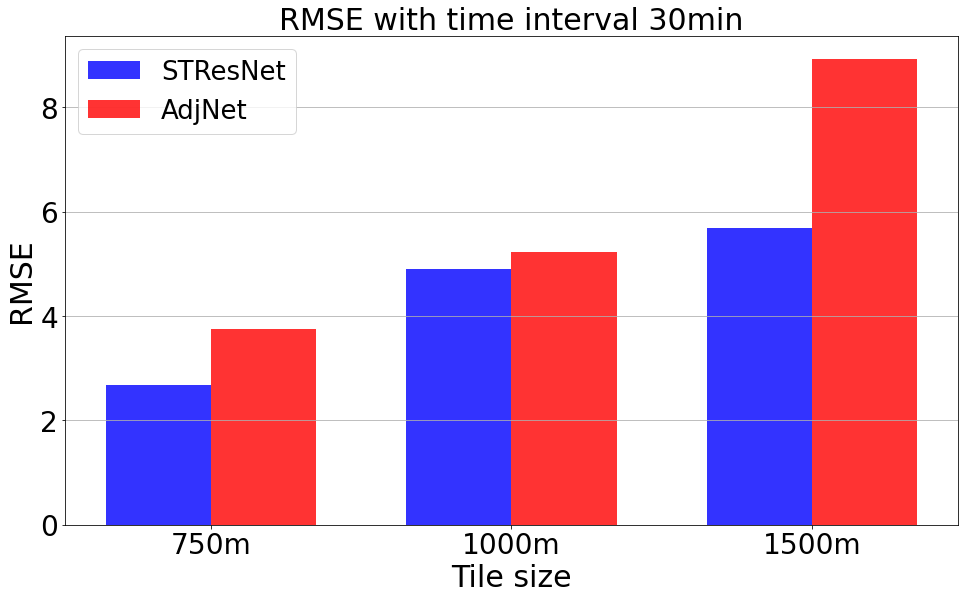

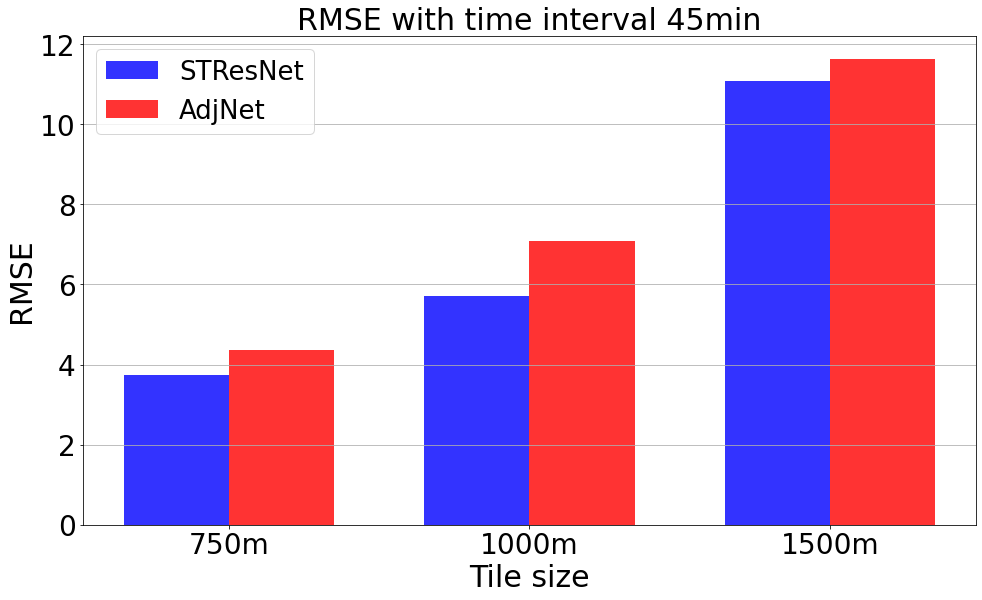

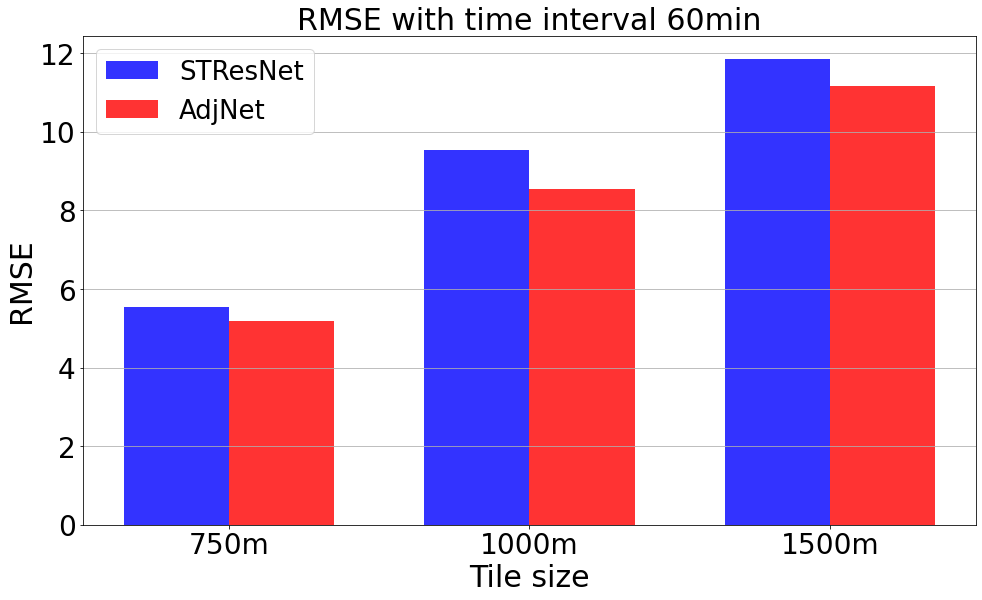

In [530]:
# labels = ['15min', '30min', '60min']
labels = ['750m', '1000m', '1500m']

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

for time_interval in time_intervals:
    plt.figure(figsize=(16,9))
    plt.xlabel("Tile size", fontsize=sizes['labels'])
    plt.ylabel("RMSE", fontsize=sizes['labels'])
    plt.xticks(x, labels, fontsize=sizes['ticks'])
    plt.yticks(fontsize=sizes['ticks'])
    plt.title('RMSE with time interval '+str(time_interval), fontsize=sizes['title'])
    stresnet_error = []
    adjnet_error = []
    for tile_size in tile_sizes:
        stresnet_error.append(mean_squared_error(STResNet_real[str(tile_size)+time_interval][11:].flatten(), STResNet_pred[str(tile_size)+time_interval][11:].flatten(), squared=False))
        adjnet_error.append(mean_squared_error(STResNet_real[str(tile_size)+time_interval][11:].flatten(), AdjNet_pred_map[str(tile_size)+time_interval].flatten(), squared=False))
    rects1 = plt.bar(x - width/2, stresnet_error, width, label='STResNet', color='blue', alpha=0.8)
    rects2 = plt.bar(x + width/2, adjnet_error, width, label='AdjNet', color='red', alpha=0.8)
    plt.legend(fontsize=sizes['legend'], loc="upper left")
    plt.grid(axis="y")
    plt.savefig("ErrorBar_fixedTimeInterval"+time_interval+".png")
    plt.show()

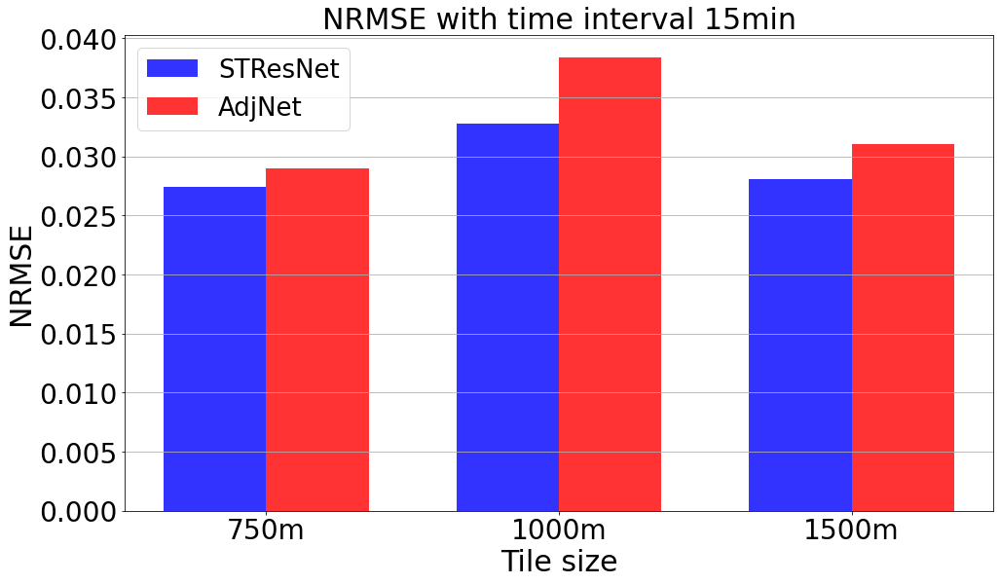

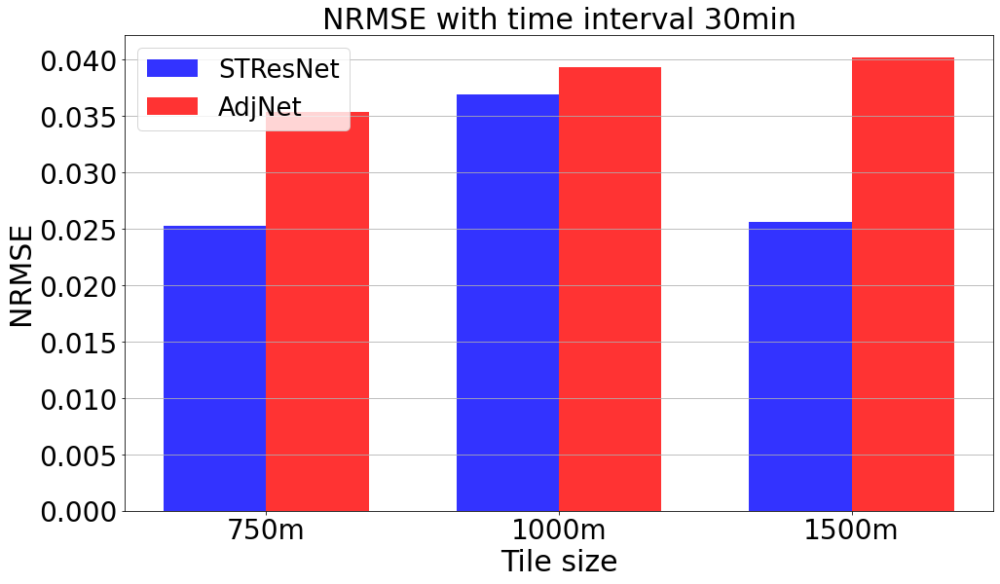

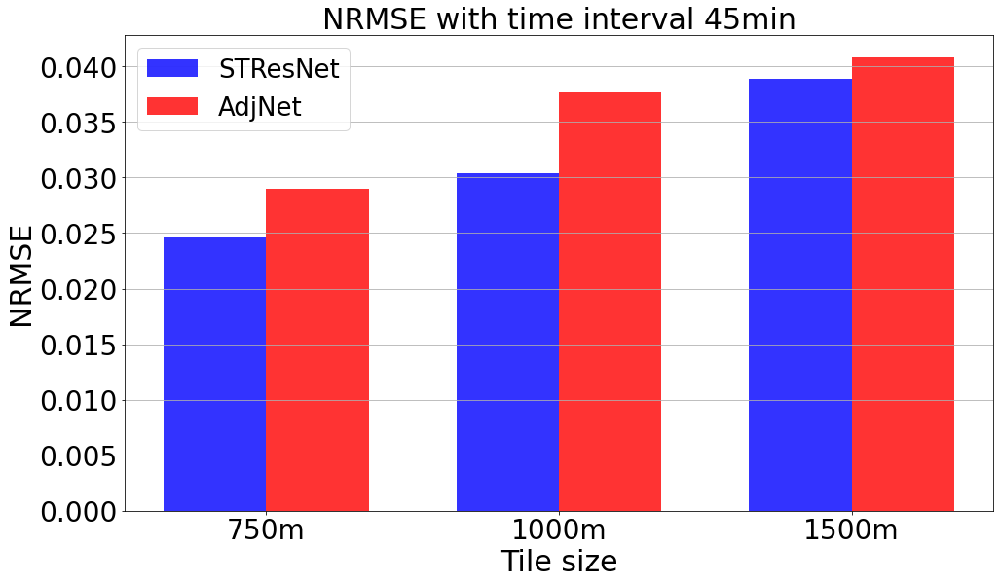

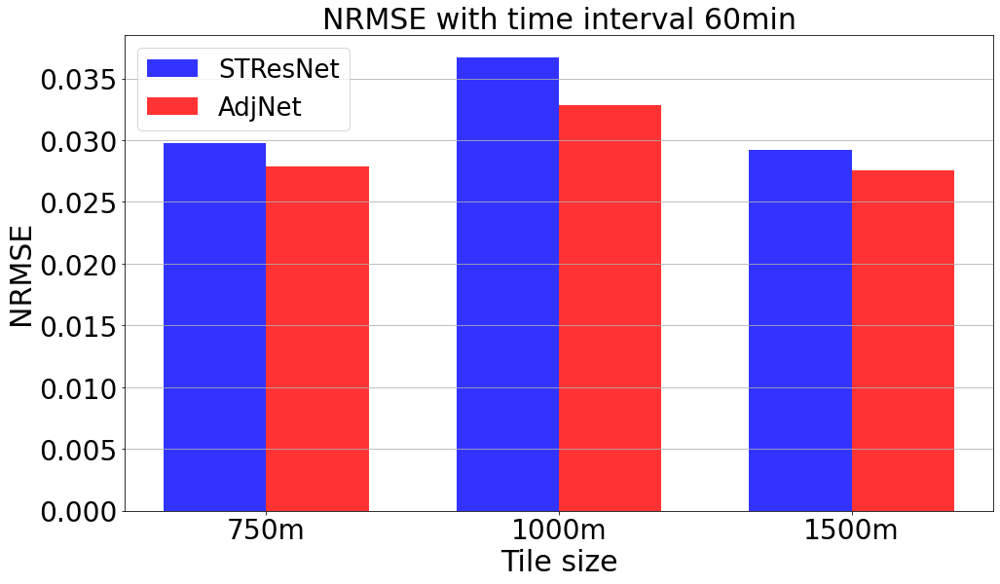

In [532]:
# labels = ['15min', '30min', '60min']
labels = ['750m', '1000m', '1500m']

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

for time_interval in time_intervals:
    plt.figure(figsize=(16,9))
    plt.xlabel("Tile size", fontsize=sizes['labels'])
    plt.ylabel("NRMSE", fontsize=sizes['labels'])
    plt.xticks(x, labels, fontsize=sizes['ticks'])
    plt.yticks(fontsize=sizes['ticks'])
    plt.title('NRMSE with time interval '+str(time_interval), fontsize=sizes['title'])
    stresnet_error = []
    adjnet_error = []
    for tile_size in tile_sizes:
        stresnet_error.append(mean_squared_error(STResNet_real[str(tile_size)+time_interval][11:].flatten(), STResNet_pred[str(tile_size)+time_interval][11:].flatten(), squared=False)/STResNet_real[str(tile_size)+time_interval][11:].max())
        adjnet_error.append(mean_squared_error(STResNet_real[str(tile_size)+time_interval][11:].flatten(), AdjNet_pred_map[str(tile_size)+time_interval].flatten(), squared=False)/STResNet_real[str(tile_size)+time_interval][11:].max())
    rects1 = plt.bar(x - width/2, stresnet_error, width, label='STResNet', color="blue", alpha=0.8)
    rects2 = plt.bar(x + width/2, adjnet_error, width, label='AdjNet', color="red", alpha=0.8)
    plt.legend(fontsize=sizes['legend'], loc="upper left")
    plt.grid(axis="y")
    plt.savefig("NormalisedErrorBar_fixedTimeInterval"+time_interval+".png")
    plt.show()

In [47]:
# computing CPC
def cpc(real_flow, pred_flow):
    num = []
    for j in range(real_flow.shape[0]):
        num.append(np.array([min(pred_flow[j].flatten()[i], real_flow[j].flatten()[i]) for i in range(len(real_flow[j].flatten()))]))
    cpc = [2*(num[j].sum())/(pred_flow[j].sum()+real_flow[j].sum()) for j in range(real_flow.shape[0])]
    return np.array(cpc).mean(), np.array(cpc).std()

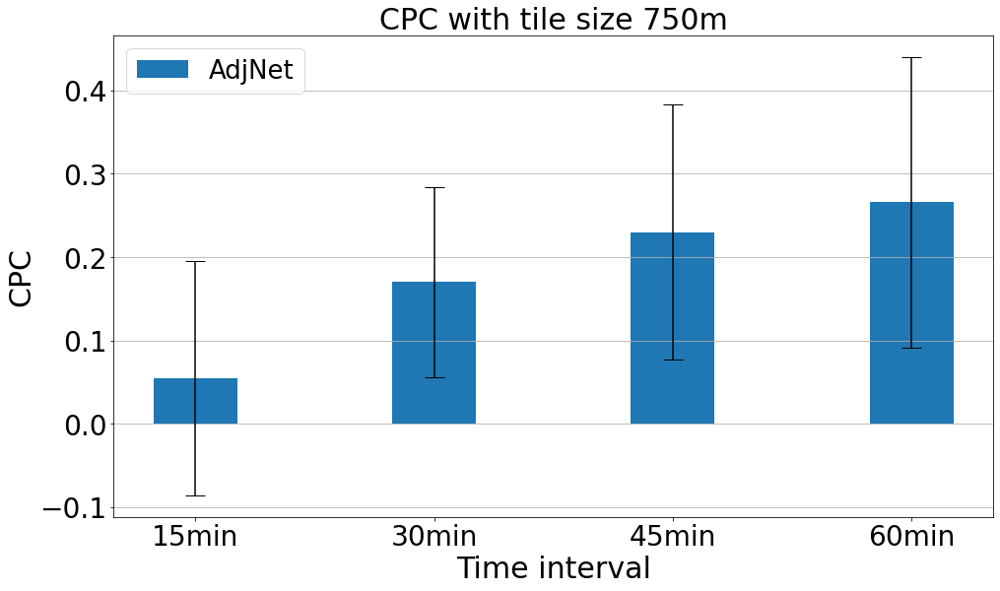

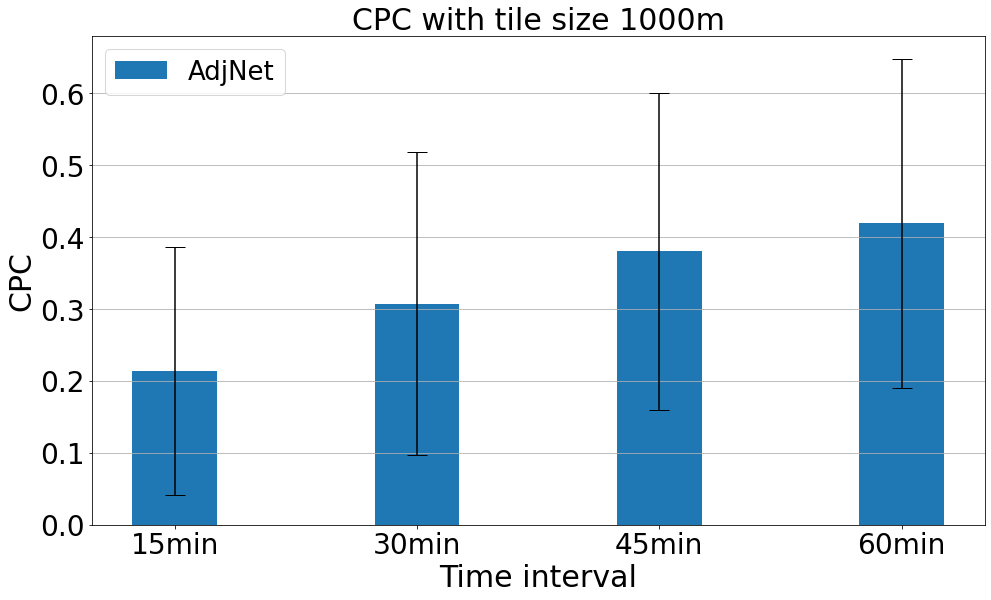

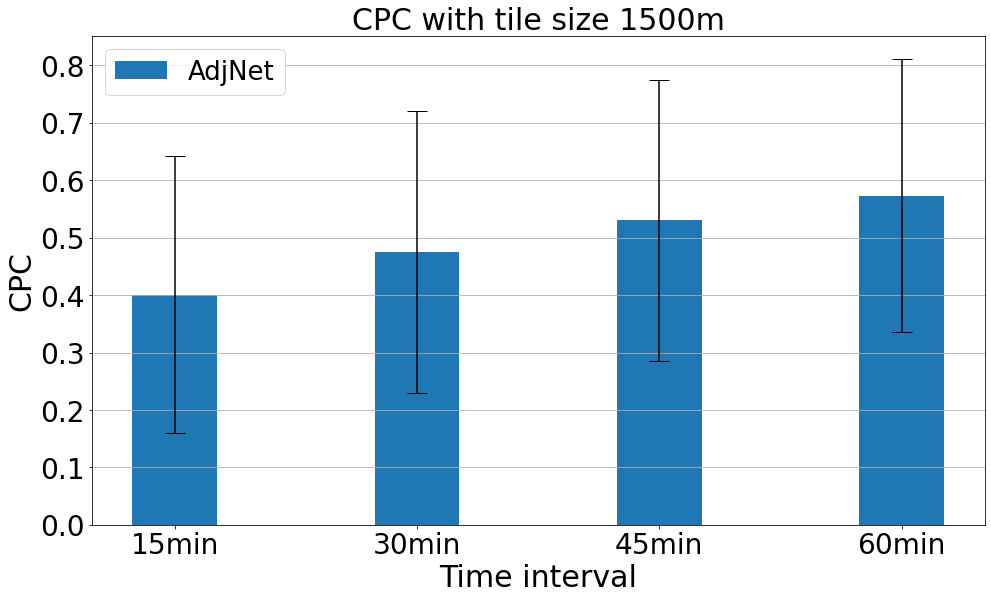

In [535]:
# labels = ['15min', '30min', '60min']
labels = ['15min', '30min', '45min', '60min']

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

for tile_size in tile_sizes:
    plt.figure(figsize=(16,9))
    plt.xlabel("Time interval", fontsize=sizes['labels'])
    plt.ylabel("CPC", fontsize=sizes['labels'])
    plt.xticks(x, labels, fontsize=sizes['ticks'])
    plt.yticks(fontsize=sizes['ticks'])
    plt.title('CPC with tile size '+str(tile_size)+'m', fontsize=sizes['title'])
    adjnet_error, adjnet_std = [], []
    for time_interval in time_intervals:
        cpc_mean, cpc_std = cpc(AdjNet_real[str(tile_size)+time_interval][:,:,0], AdjNet_pred[str(tile_size)+time_interval][:,:,0])
        adjnet_error.append(cpc_mean)
        adjnet_std.append(cpc_std)
    rects2 = plt.bar(x, adjnet_error, yerr=adjnet_std, width=width, label='AdjNet', capsize=10)
    plt.legend(fontsize=sizes['legend'], loc="upper left")
    plt.grid(axis="y")
    plt.savefig("CPC_fixedTileSize"+str(tile_size)+".png")
    plt.show()

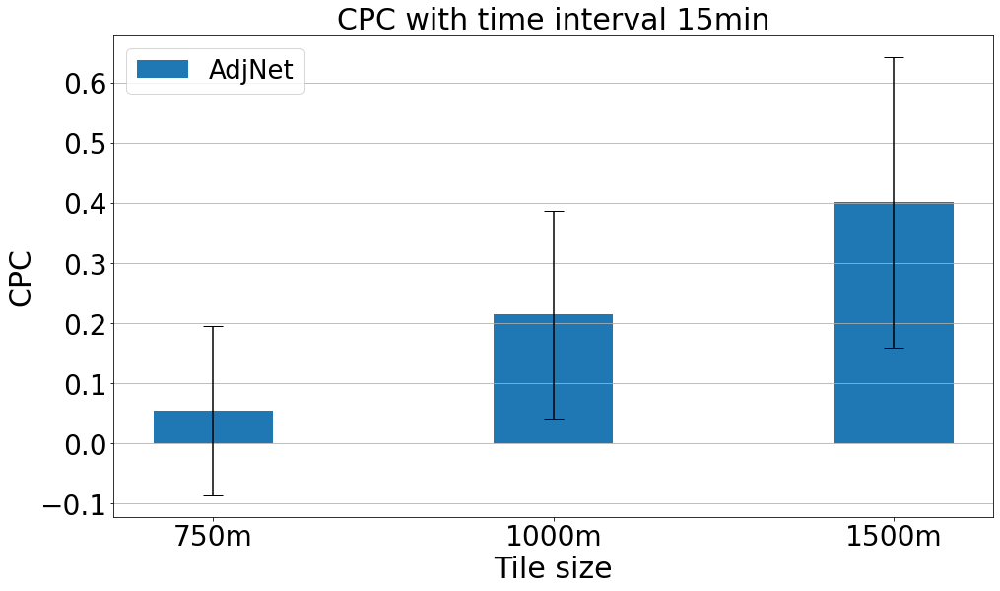

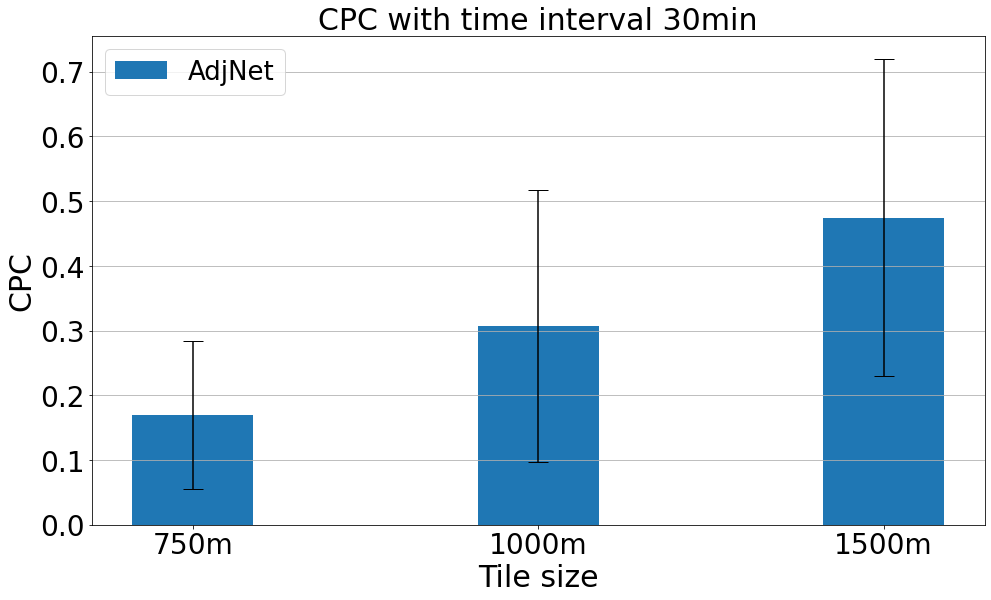

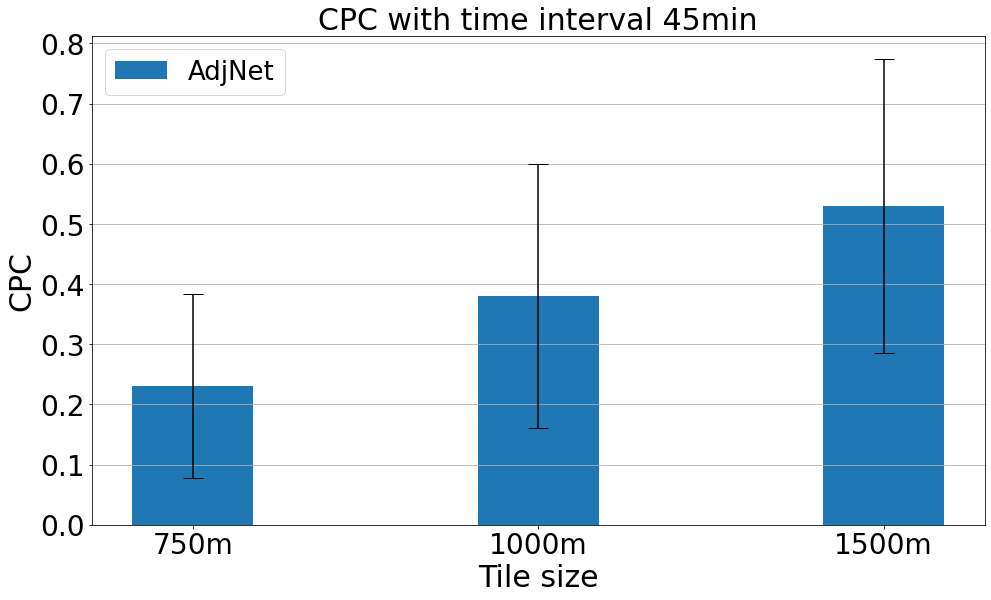

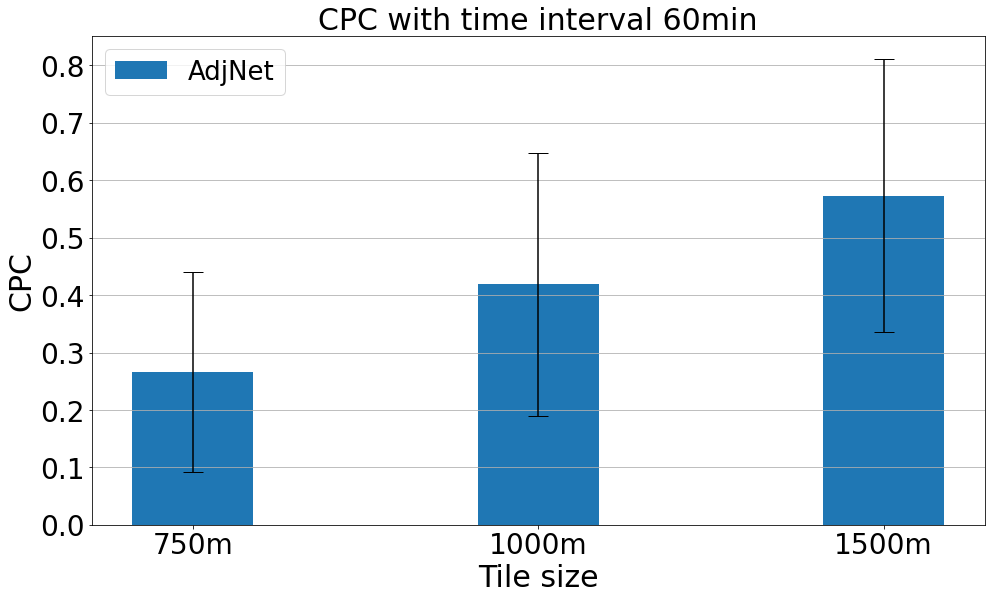

In [536]:
# labels = ['15min', '30min', '60min']
labels = ['750m', '1000m', '1500m']

x = np.arange(len(labels))  # the label locations
width = 0.35  # the width of the bars

for time_interval in time_intervals:
    plt.figure(figsize=(16,9))
    plt.xlabel("Tile size", fontsize=sizes['labels'])
    plt.ylabel("CPC", fontsize=sizes['labels'])
    plt.xticks(x, labels, fontsize=sizes['ticks'])
    plt.yticks(fontsize=sizes['ticks'])
    plt.title('CPC with time interval '+str(time_interval), fontsize=sizes['title'])
    adjnet_error, adjnet_std = [], []
    for tile_size in tile_sizes:
        cpc_mean, cpc_std = cpc(AdjNet_real[str(tile_size)+time_interval][:,:,0], AdjNet_pred[str(tile_size)+time_interval][:,:,0])
        adjnet_error.append(cpc_mean)
        adjnet_std.append(cpc_std)
    rects2 = plt.bar(x, adjnet_error, yerr=adjnet_std, width=width, label='AdjNet', capsize=10)
    plt.legend(fontsize=sizes['legend'], loc="upper left")
    plt.grid(axis="y")
    plt.savefig("CPC_fixedTimeInterval"+time_interval+".png")
    plt.show()

In [547]:
sizes

{'title': 30, 'ticks': 28, 'legend': 26, 'labels': 30, 'suptitle': 32}

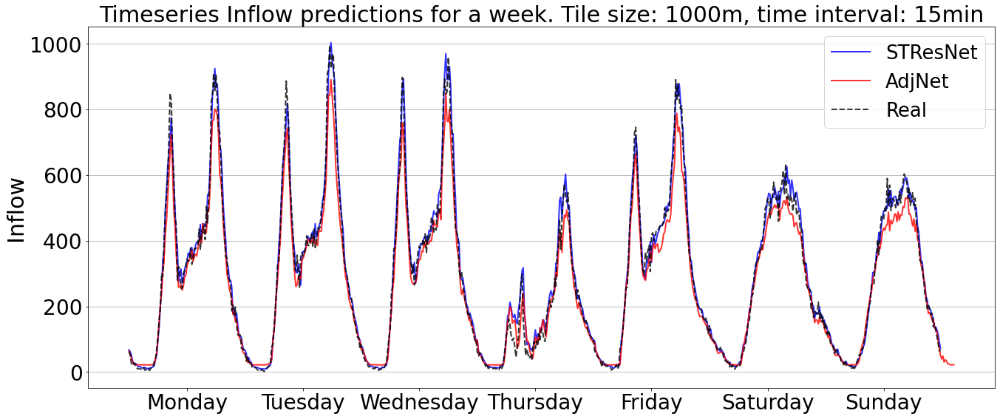

In [551]:
time_interval = "15min"
tile_size = 1000
# day = 1 # 12th of May 2014
# time_intervals = 24
start_date = 24*4 #day*time_intervals
end_date = start_date + 7*24*4
flow = 0

plt.figure(figsize=(22,9))
flow_str = "Outflow" if flow == 1 else "Inflow"
plt.title('Timeseries '+flow_str+' predictions for a week. Tile size: '+str(tile_size)+"m, time interval: "+str(time_interval), fontsize=sizes['title'])
plt.plot(STResNet_pred[str(tile_size)+time_interval][start_date:end_date, :,:,flow].sum(axis=1).sum(axis=1), label="STResNet", color="blue", alpha=0.8, linewidth=2)
plt.plot(AdjNet_pred_map[str(tile_size)+time_interval][start_date-11:8*24*4, :,:,flow].sum(axis=1).sum(axis=1), label="AdjNet", color="red", alpha=0.8, linewidth=2)
plt.plot(STResNet_real[str(tile_size)+time_interval][start_date:end_date, :,:,flow].sum(axis=1).sum(axis=1), label="Real", color="black", linestyle='--', alpha=0.8, linewidth=2)
# plt.xlabel("Weekday", fontsize=22)
plt.ylabel(flow_str, fontsize=sizes['labels'])
plt.xticks(fontsize=sizes['ticks'])
plt.yticks(fontsize=sizes['ticks'])
plt.locator_params(axis='x', nbins=7)
plt.xticks([12*4+i*24*4 for i in range(0,7)], ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"])
plt.legend(fontsize=sizes['legend'])
plt.grid(axis="y")
plt.show()

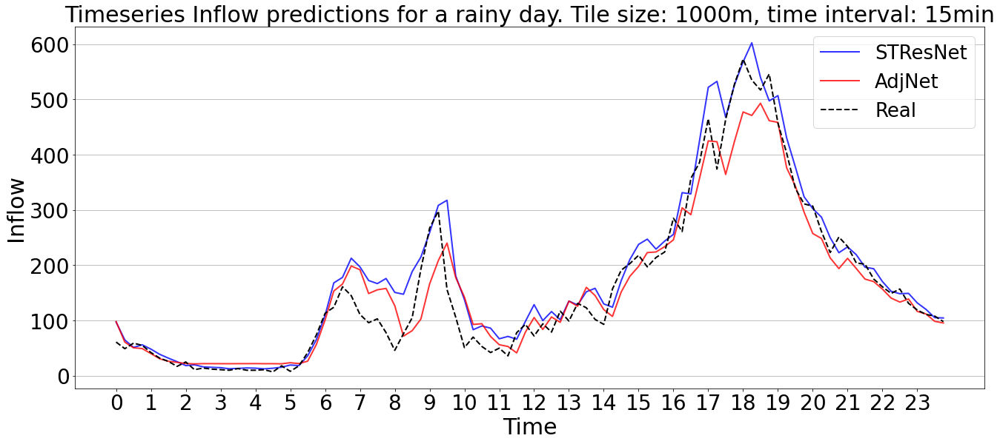

In [552]:
time_interval = "15min"
tile_size = 1000
# day = 1 # 12th of May 2014
# time_intervals = 24
start_date = 4*24*4 #day*time_intervals
end_date = start_date + 24*4
flow = 0

plt.figure(figsize=(22,9))
flow_str = "Outflow" if flow == 1 else "Inflow"
plt.title('Timeseries '+flow_str+' predictions for a rainy day. Tile size: '+str(tile_size)+"m, time interval: "+str(time_interval), fontsize=sizes['title'])
plt.plot(STResNet_pred[str(tile_size)+time_interval][start_date:end_date, :,:,flow].sum(axis=1).sum(axis=1), label="STResNet", color="blue", alpha=0.8, linewidth=2)
plt.plot(AdjNet_pred_map[str(tile_size)+time_interval][start_date-11:end_date-11, :,:,flow].sum(axis=1).sum(axis=1), label="AdjNet", color="red", alpha=0.8, linewidth=2)
plt.plot(STResNet_real[str(tile_size)+time_interval][start_date:end_date, :,:,flow].sum(axis=1).sum(axis=1), label="Real", color="black", linestyle='--', linewidth=2)
plt.xlabel("Time", fontsize=sizes['labels'])
plt.ylabel("Inflow", fontsize=sizes['labels'])
plt.xticks(fontsize=sizes['ticks'])
plt.yticks(fontsize=sizes['ticks'])
plt.locator_params(axis='x', nbins=24)
plt.xticks([i*4 for i in range(0,24)], list(range(24)))#["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"])
plt.legend(fontsize=sizes['legend'])
plt.grid(axis="y")
plt.show()

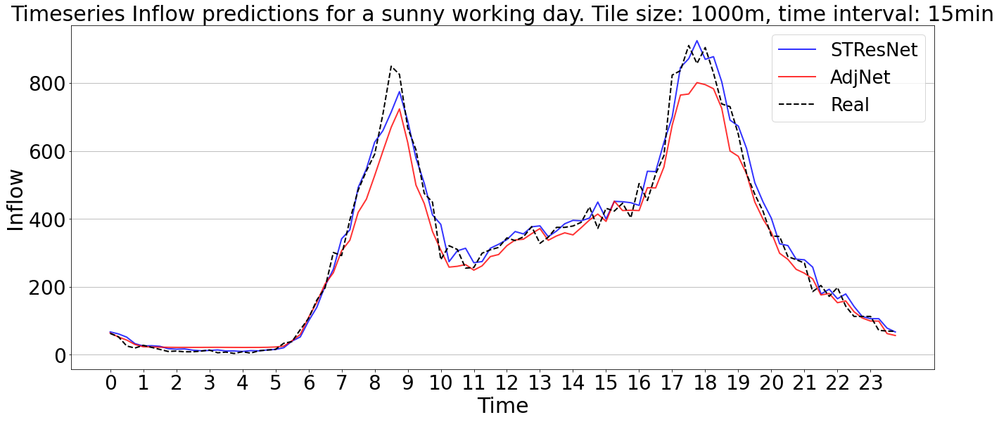

In [553]:
time_interval = "15min"
tile_size = 1000
# day = 1 # 12th of May 2014
# time_intervals = 24
start_date = 24*4 #day*time_intervals
end_date = start_date + 24*4
flow = 0

plt.figure(figsize=(22,9))
flow_str = "Outflow" if flow == 1 else "Inflow"
plt.title('Timeseries '+flow_str+' predictions for a sunny working day. Tile size: '+str(tile_size)+"m, time interval: "+str(time_interval), fontsize=sizes['title'])
plt.plot(STResNet_pred[str(tile_size)+time_interval][start_date:end_date, :,:,flow].sum(axis=1).sum(axis=1), label="STResNet", color="blue", alpha=0.8, linewidth=2)
plt.plot(AdjNet_pred_map[str(tile_size)+time_interval][start_date-11:end_date-11, :,:,flow].sum(axis=1).sum(axis=1), label="AdjNet", color="red", alpha=0.8, linewidth=2)
plt.plot(STResNet_real[str(tile_size)+time_interval][start_date:end_date, :,:,flow].sum(axis=1).sum(axis=1), label="Real", color="black", linestyle='--', linewidth=2)
plt.xlabel("Time", fontsize=sizes['labels'])
plt.ylabel("Inflow", fontsize=sizes['labels'])
plt.xticks(fontsize=sizes['ticks'])
plt.yticks(fontsize=sizes['ticks'])
plt.locator_params(axis='x', nbins=24)
plt.xticks([i*4 for i in range(0,24)], list(range(24)))#["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"])
plt.legend(fontsize=sizes['legend'])
plt.grid(axis="y")
plt.show()

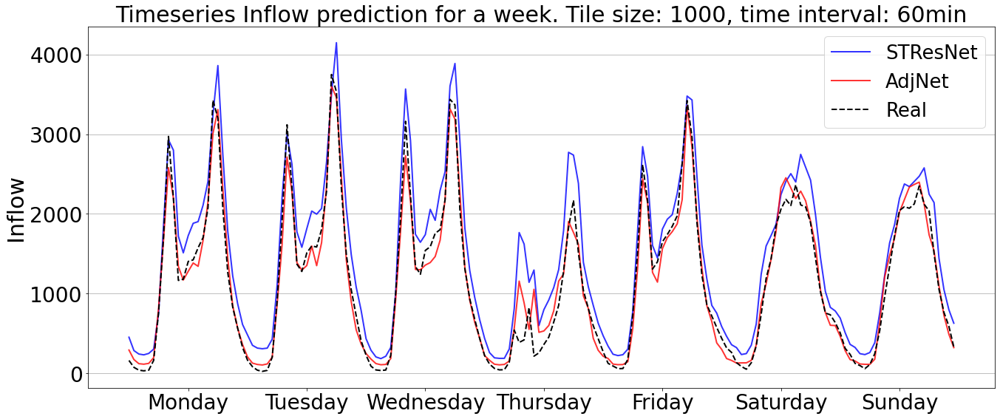

In [568]:
time_interval = "60min"
tile_size = 1000
# day = 1 # 12th of May 2014
# time_intervals = 24
start_date = 24 #day*time_intervals
end_date = start_date + 7*24
flow = 0

plt.figure(figsize=(22,9))
flow_str = "Outflow" if flow == 1 else "Inflow"
plt.title('Timeseries '+flow_str+' prediction for a week. Tile size: '+str(tile_size)+", time interval: "+str(time_interval), fontsize=sizes['title'])
plt.plot(STResNet_pred[str(tile_size)+time_interval][start_date:end_date, :,:,flow].sum(axis=1).sum(axis=1), label="STResNet", color="blue", alpha=0.8, linewidth=2)
plt.plot(AdjNet_pred_map[str(tile_size)+time_interval][13:13+7*24, :,:,flow].sum(axis=1).sum(axis=1), label="AdjNet", color="red", alpha=0.8, linewidth=2)
plt.plot(STResNet_real[str(tile_size)+time_interval][start_date:end_date, :,:,flow].sum(axis=1).sum(axis=1), label="Real", color="black", linestyle='--', linewidth=2)
# plt.xlabel("Weekday", fontsize=22)
plt.ylabel(flow_str, fontsize=sizes['labels'])
plt.xticks(fontsize=sizes['ticks'])
plt.yticks(fontsize=sizes['ticks'])
plt.locator_params(axis='x', nbins=7)
plt.xticks([12+i*24 for i in range(0,7)], ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"])
plt.legend(fontsize=sizes['legend'])
plt.grid(axis="y")
plt.show()

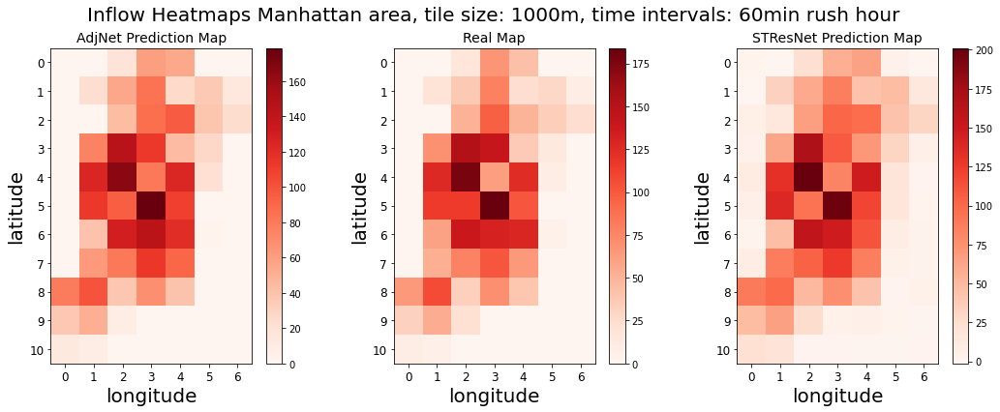

In [54]:
# Rush hour in the evening, at 18
show_heatmaps(STResNet_real[str(tile_size)+time_interval][24+18:24+19], 
                  STResNet_pred[str(tile_size)+time_interval][24+18:24+19], 
                  AdjNet_pred_map[str(tile_size)+time_interval][31:32], tile_size, time_interval+" rush hour", 0)

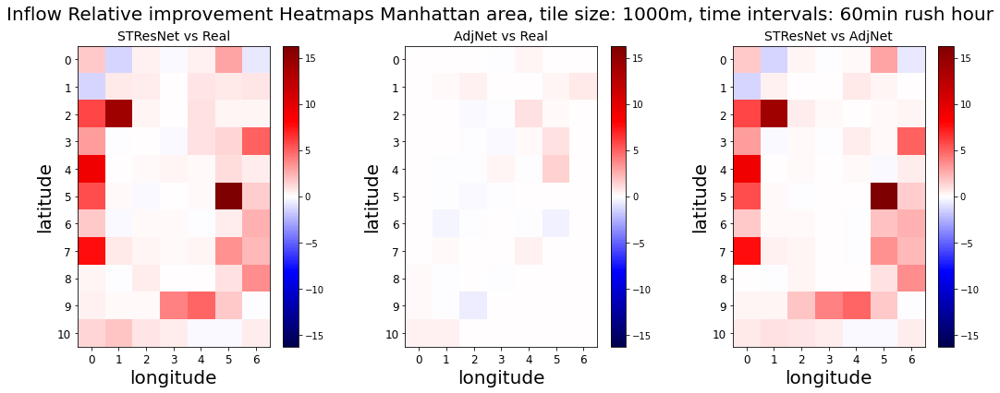

In [55]:
show_relative_improvement(STResNet_real[str(tile_size)+time_interval][11:], 
                  STResNet_pred[str(tile_size)+time_interval][11:], 
                  AdjNet_pred_map[str(tile_size)+time_interval], tile_size, time_interval+" rush hour", 0, start=31, end=32)

In [124]:
AdjNet_real[str(tile_size)+time_interval][:,:,0].sum(axis=0).shape

(141, 141)

In [125]:
adj_nodes = []
for row in AdjNet_real[str(tile_size)+time_interval][:,:,0].sum(axis=0):
    adj_nodes.append(sum(row>0))

In [126]:
# for AdjNet_real[str(tile_size)+time_interval][:,:,0]
# p_loc = 

In [127]:
real_outflow = AdjNet_real[str(tile_size)+time_interval][:,:,0].sum(axis=2)
adj_outflow = AdjNet_pred[str(tile_size)+time_interval][:,:,0].sum(axis=2)

In [128]:
# AdjNet vs Real
relative_improvement = np.zeros(real_outflow.shape[1])
for i in range(real_outflow.shape[0]):
    relative_improvement += (adj_outflow[i]-real_outflow[i])/(1+real_outflow[i])
relative_improvement /= real_outflow.shape[0]

In [129]:
# def comp_relative_improvement(adjnet_real, adjnet_pred):
#     real_outflow = adjnet_real.sum(axis=2)
#     adj_outflow = adjnet_pred.sum(axis=2)
#     relative_improvement = np.zeros(real_outflow.shape[1])
#     for i in range(real_outflow.shape[0]):
#         relative_improvement += (adj_outflow[i]-real_outflow[i])/(1+real_outflow[i])
#     relative_improvement /= real_outflow.shape[0]
#     return relative_improvement

def comp_relative_improvement(adjnet_real, adjnet_pred):
    real_outflow = adjnet_real.sum(axis=2)
    adj_outflow = adjnet_pred.sum(axis=2)
    relative_improvement = np.zeros(real_outflow.shape[1])
    for i in range(real_outflow.shape[0]):
        for j, f in enumerate(real_outflow[i]):
            if f == 0:
                relative_improvement[j] += (adj_outflow[i][j]-real_outflow[i][j])/(1)
            else:
                relative_improvement[j] += (adj_outflow[i][j]-real_outflow[i][j])/(real_outflow[i][j])
    relative_improvement /= real_outflow.shape[0]
    return relative_improvement

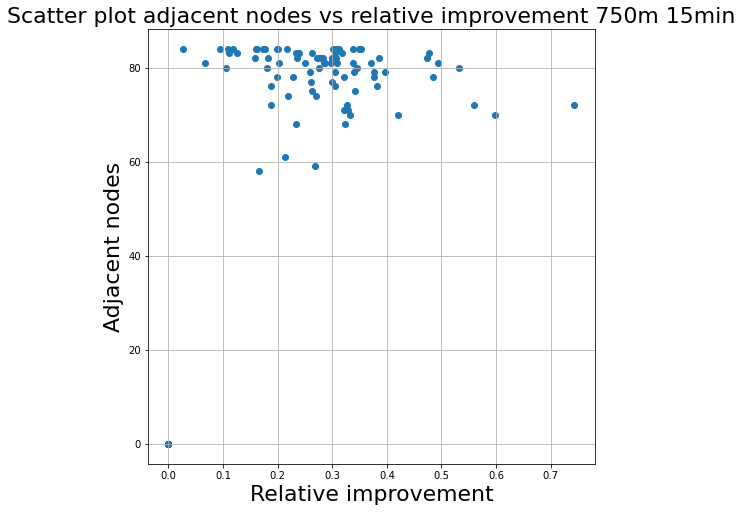

In [130]:
plt.figure(figsize=(8,8))
plt.title("Scatter plot adjacent nodes vs relative improvement "+str(tile_size)+"m "+time_interval, fontsize=22)
plt.ylabel("Adjacent nodes", fontsize=22)
plt.xlabel("Relative improvement", fontsize=22)
plt.scatter(relative_improvement, adj_nodes)
plt.grid()
plt.show()

In [131]:
import math

In [132]:
def entropy_node(adj_net_real):
    entropies = []
#     for node in AdjNet_real[str(tile_size)+time_interval][:,:,0].sum(axis=0):
    for node in adj_net_real.sum(axis=0):
        entropy = []
        for adj_node in node:
            if adj_node > 0:
                pr = adj_node / node.sum()
                log_pr = math.log(pr, 2)
                entropy.append(pr*log_pr)
        if sum(entropy) != 0:
            entropies.append(-sum(entropy)/math.log(sum(node>0), 2))
        else:
            entropies.append(0)
    return entropies

In [133]:
from scipy.stats import spearmanr

In [134]:
relative_improvement = np.array(relative_improvement)
entropies = np.array(entropies)

NameError: name 'entropies' is not defined

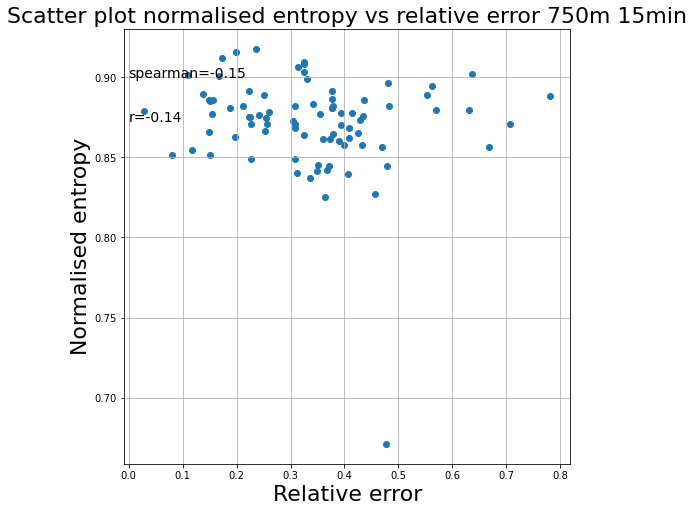

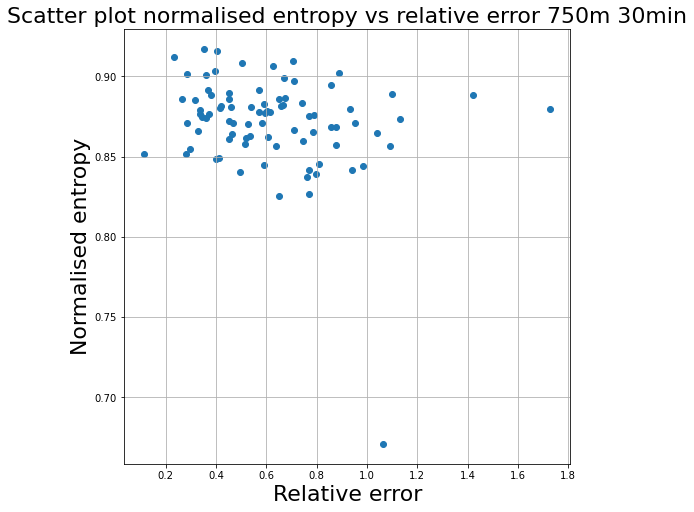

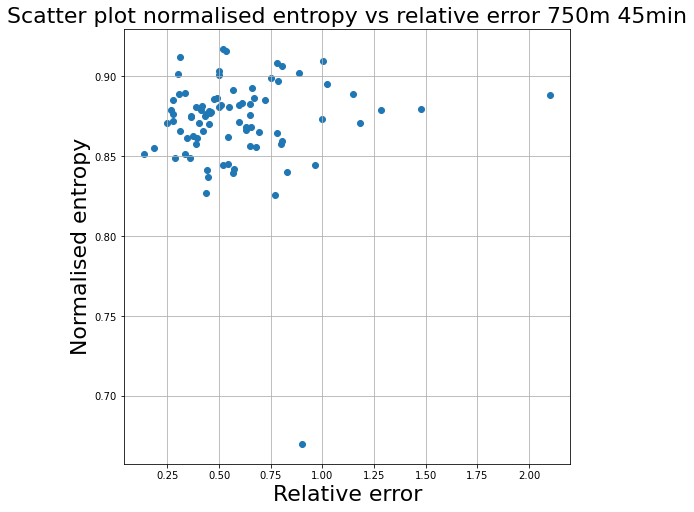

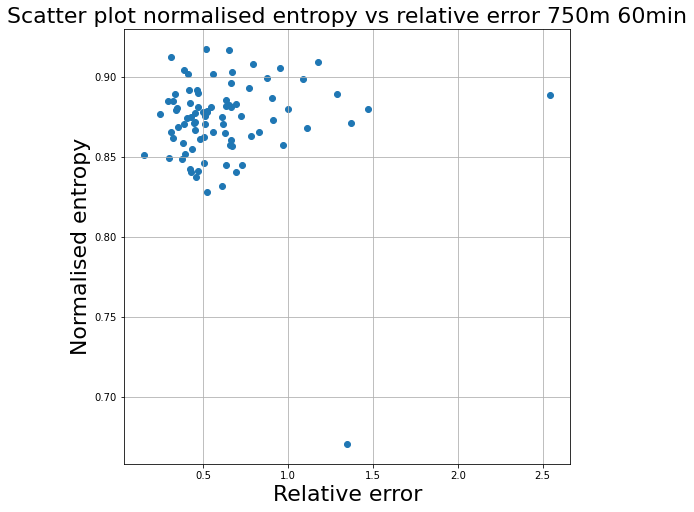

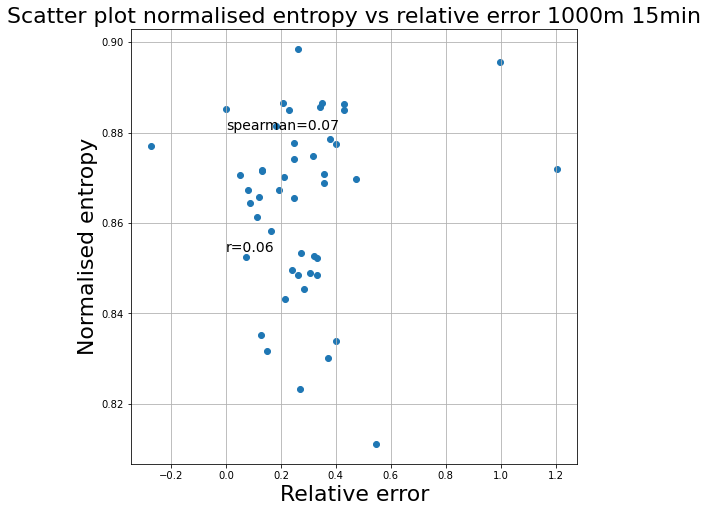

...

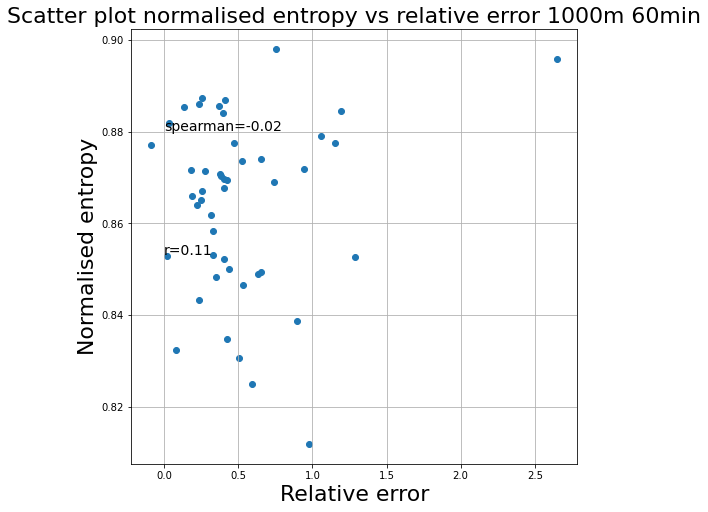

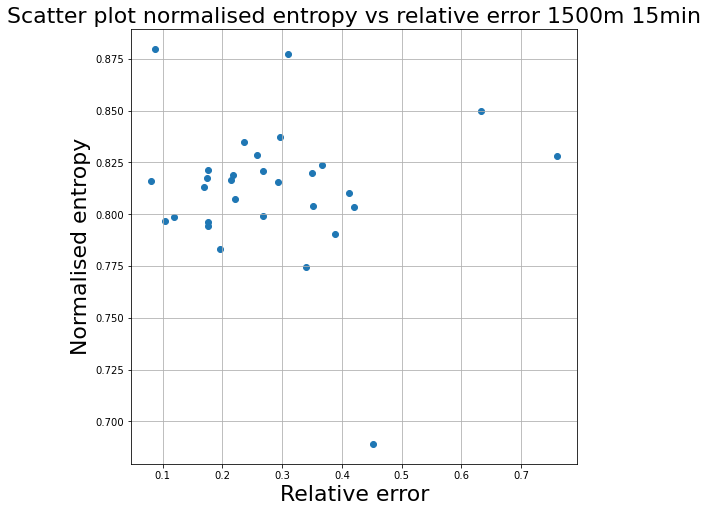

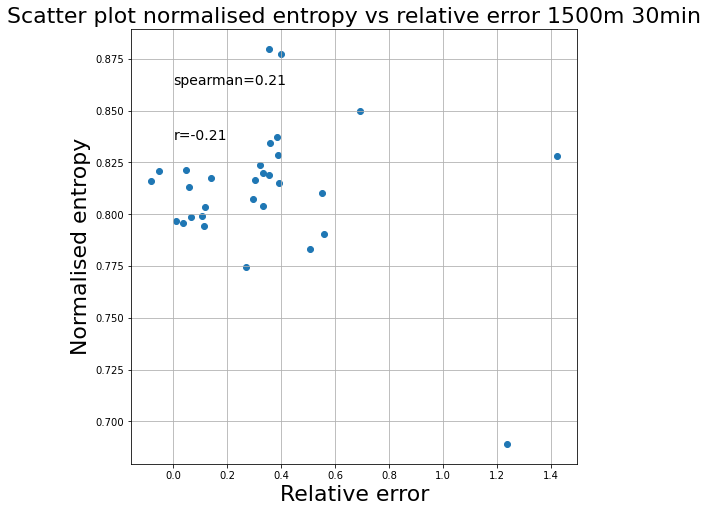

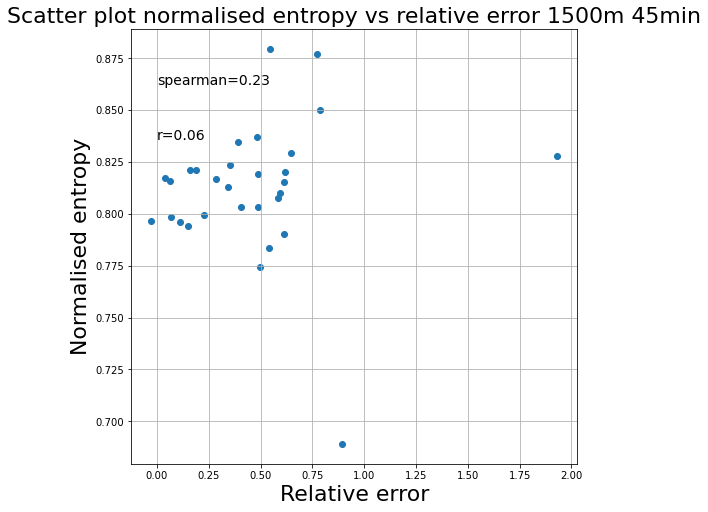

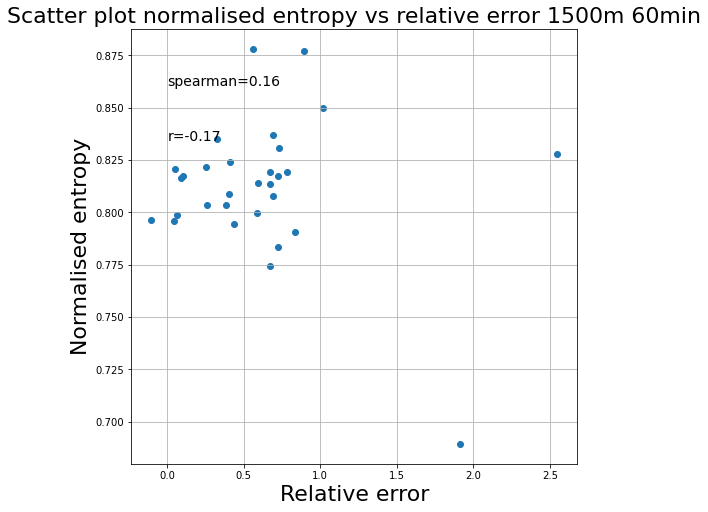

In [135]:
for tile_size in tile_sizes:
    for time_interval in time_intervals:
        entropies = entropy_node(AdjNet_real[str(tile_size)+time_interval][:,:,0])
        relative_improvement = comp_relative_improvement(AdjNet_real[str(tile_size)+time_interval][:,:,0], AdjNet_pred[str(tile_size)+time_interval][:,:,0])
        relative_improvement = np.array(relative_improvement)
        entropies = np.array(entropies)
        plt.figure(figsize=(8,8))
        plt.title("Scatter plot normalised entropy vs relative error "+str(tile_size)+"m "+time_interval, fontsize=22)
        plt.ylabel("Normalised entropy", fontsize=22)
        plt.xlabel("Relative error", fontsize=22)
        plt.scatter(relative_improvement[relative_improvement!=0], entropies[entropies!=0])
        plt.annotate("r="+"{:.2f}".format(np.corrcoef(relative_improvement[relative_improvement!=0].flatten(), entropies[entropies!=0].flatten())[0][1]), (0,entropies[entropies!=0].max()*0.95), fontsize=14)
        plt.annotate("spearman="+"{:.2f}".format(spearmanr(relative_improvement[relative_improvement!=0].flatten(), entropies[entropies!=0].flatten()).correlation), (0,entropies[entropies!=0].max()*0.98), fontsize=14)
        plt.grid()
        plt.show()

In [136]:
from math import radians, cos, sin, asin, sqrt

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371 # Radius of earth in kilometers. Use 3956 for miles
    return c * r

In [137]:
# scatterplot2: plottare sulle x (ogni punto è una tile) l'errore di previsione (che può essere relative 
# improvement oppure errore assoluto) e sulle y il valore H, definito come flusso tra la tile e uno dei 
# suoi vicini moltiplicato la distanza tra la tile e il vicino (per ogni tile avremo più valori di H, 
# uno per ogni vicino, prendi o la media o la somma). Calcola anche correlazione.

In [143]:
tess = {}
tess[750] = tilers.tiler.get("squared", base_shape="Manhattan, New York City, USA", meters=750)
tess[1000] = tilers.tiler.get("squared", base_shape="Manhattan, New York City, USA", meters=1000)
tess[1500] = tilers.tiler.get("squared", base_shape="Manhattan, New York City, USA", meters=1500)

In [144]:
def compute_H(adjnet_real, tessellations, min_tile_id):
    H = []
    for i, adj_flows in enumerate(adjnet_real.sum(axis=0)):
        h_values = []
        for j, flow in enumerate(adj_flows):
            origin_coords = tessellations['geometry'][i+min_tile_id].centroid
            dest_coords = tessellations['geometry'][j+min_tile_id].centroid
            h_dist = haversine(origin_coords.x, origin_coords.y, dest_coords.x, dest_coords.y)
            h_value = h_dist*flow
            h_values.append(h_value)
        H.append(np.mean(h_values))
    return H

In [145]:
compute_H(AdjNet_real[str(tile_size)+time_interval][:,:,0], tess[1000], min_tile_id[1000])

[22.856731261795744,
 78.89956515412963,
 43.49372848715873,
 53.63448614628559,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 67.42219205565037,
 102.61626027206268,
 52.10435203150556,
 150.7657353357599,
 45.787488355110355,
 45.36648663408031,
 44.619458095643246,
 45.779929029849136,
 60.73231888692995,
 29.17145637025638,
 0.0,
 0.0,
 24.12792186076196,
 51.243474577818034,
 69.27829102481049,
 53.43241449957543,
 49.09694036351945,
 61.37963587911409,
 128.47501561734273,
 111.14809591603303,
 148.67414828721263,
 211.76797019896995,
 102.38987489964394,
 18.11952108279871,
 39.34015490295032,
 0.0,
 0.0,
 41.108219284521695,
 62.816577359264365,
 114.5144787410219,
 106.32316936173207,
 89.40269297236544,
 151.13408761633892,
 240.13159872222477,
 168.68535647813903,
 235.33538476850435,
 154.89018847034708,
 25.3150608411401,
 25.81088223735219,
 0.0,
 0.0,
 49.02404325969535,
 60.01911787010915,
 92.76205200397352,
 82.34000947044333,
 239.4022736719364,
 159.23204390131716,
 191.8104756546

In [146]:
spearmanr(relative_improvement[relative_improvement!=0].flatten(), H[H!=0].flatten()).correlation

NameError: name 'H' is not defined

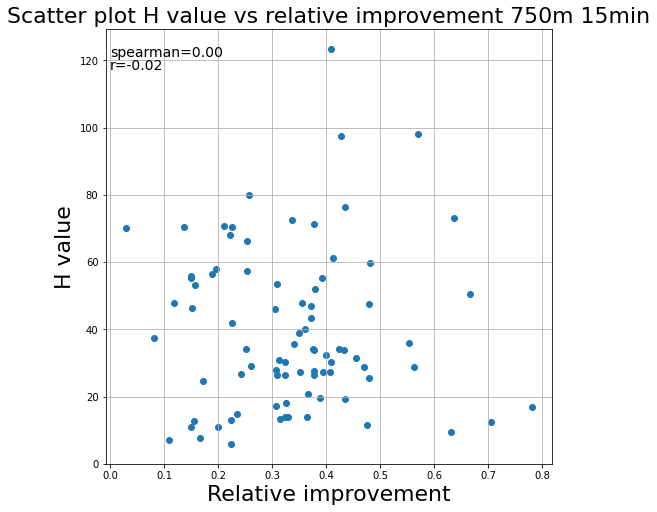

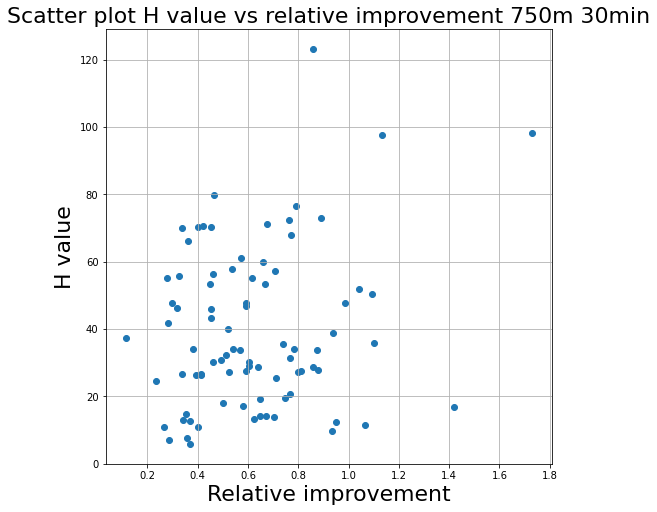

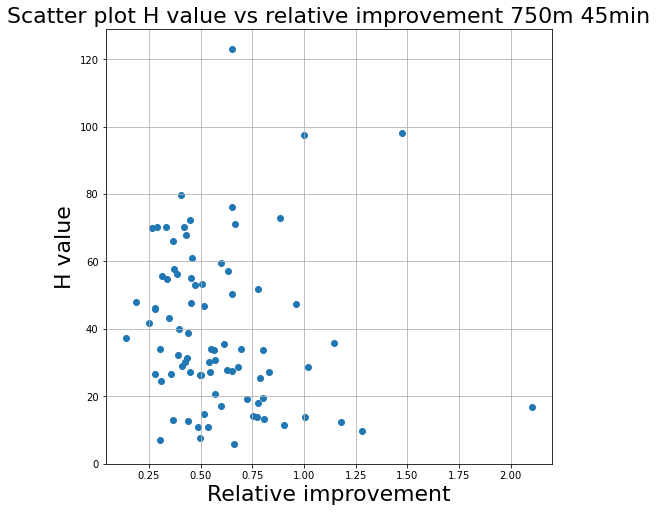

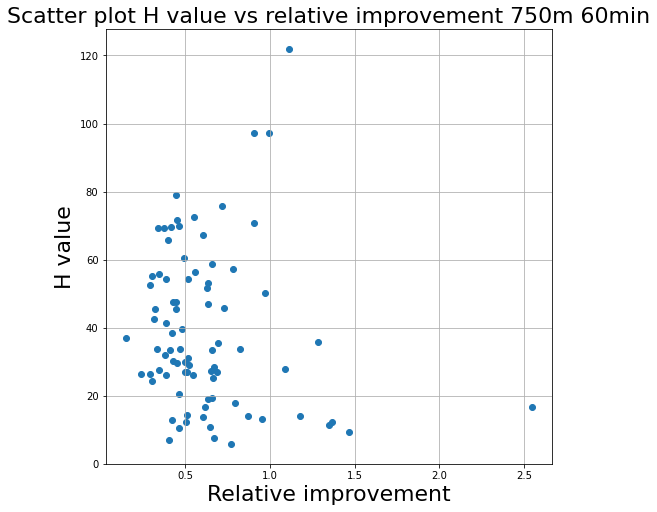

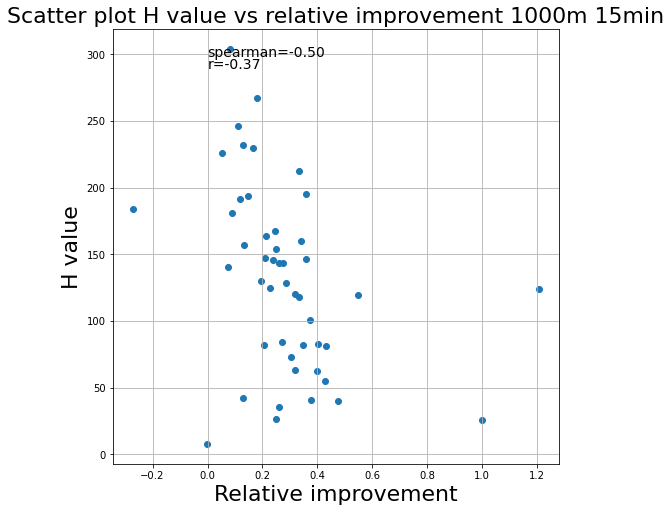

...

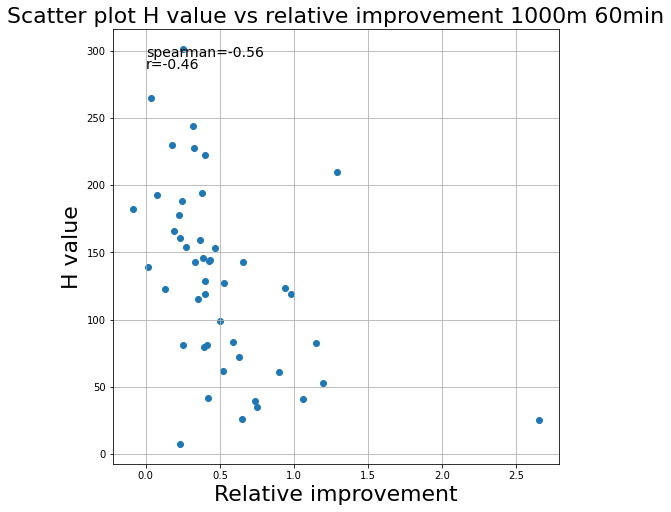

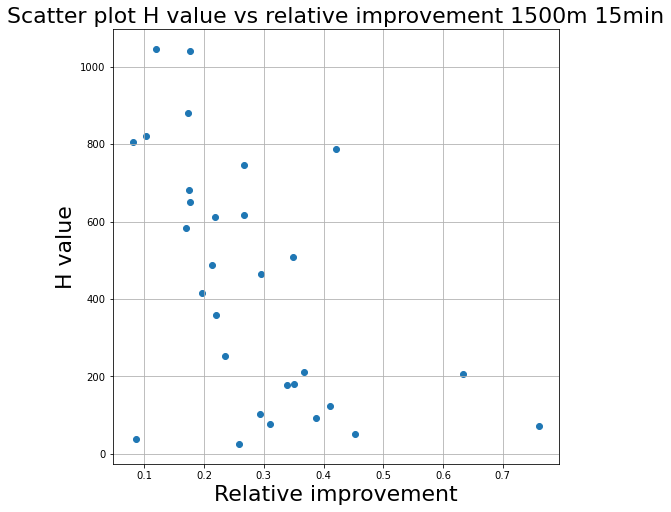

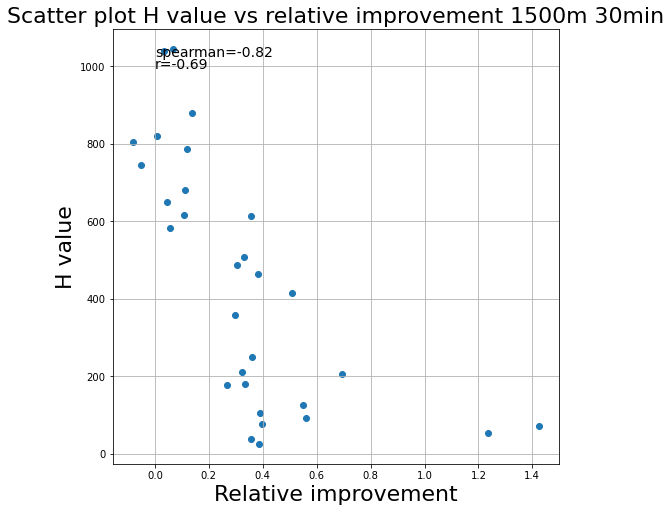

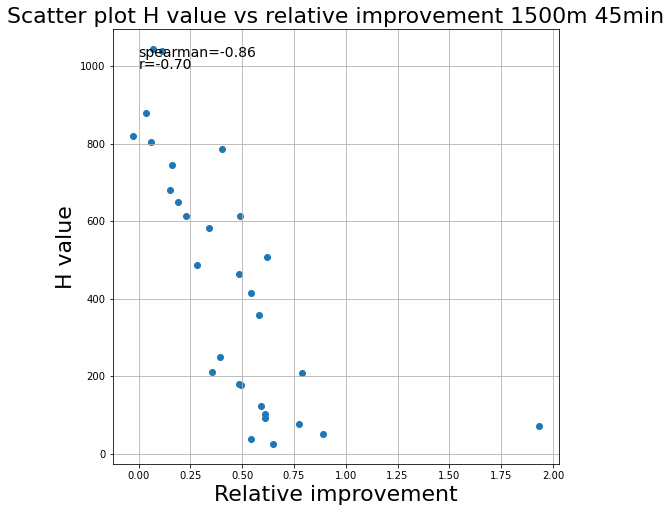

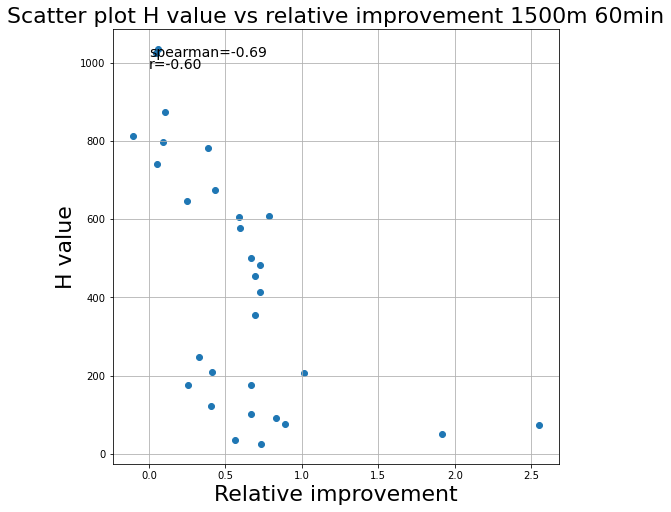

In [147]:
for tile_size in tile_sizes:
    for time_interval in time_intervals:
        H = compute_H(AdjNet_real[str(tile_size)+time_interval][:,:,0], tess[tile_size], min_tile_id[tile_size])
        relative_improvement = comp_relative_improvement(AdjNet_real[str(tile_size)+time_interval][:,:,0], AdjNet_pred[str(tile_size)+time_interval][:,:,0])
        relative_improvement = np.array(relative_improvement)
        H = np.array(H)
        plt.figure(figsize=(8,8))
        plt.title("Scatter plot H value vs relative improvement "+str(tile_size)+"m "+time_interval, fontsize=22)
        plt.ylabel("H value", fontsize=22)
        plt.xlabel("Relative improvement", fontsize=22)
        plt.scatter(relative_improvement[relative_improvement!=0], H[H!=0])
        plt.annotate("r="+"{:.2f}".format(np.corrcoef(relative_improvement[relative_improvement!=0].flatten(), H[H!=0].flatten())[0][1]), (0,H[H!=0].max()*0.95), fontsize=14)
        plt.annotate("spearman="+"{:.2f}".format(spearmanr(relative_improvement[relative_improvement!=0].flatten(), H[H!=0].flatten()).correlation), (0,H[H!=0].max()*0.98), fontsize=14)
        plt.grid()
        plt.show()

In [148]:
def compute_H_wrt_distance(adjnet_real, tessellations, min_tile_id):
    H = []
    for i, adj_flows in enumerate(adjnet_real.sum(axis=0)):
        h_values = []
        for j, flow in enumerate(adj_flows):
            origin_coords = tessellations['geometry'][i+min_tile_id].centroid
            dest_coords = tessellations['geometry'][j+min_tile_id].centroid
            h_dist = haversine(origin_coords.x, origin_coords.y, dest_coords.x, dest_coords.y)
            if i != j:
                h_value = flow/h_dist
                h_values.append(h_value)
        H.append(np.mean(h_values))
    return H

In [752]:
sizes

{'title': 30, 'ticks': 28, 'legend': 26, 'labels': 30, 'suptitle': 32}

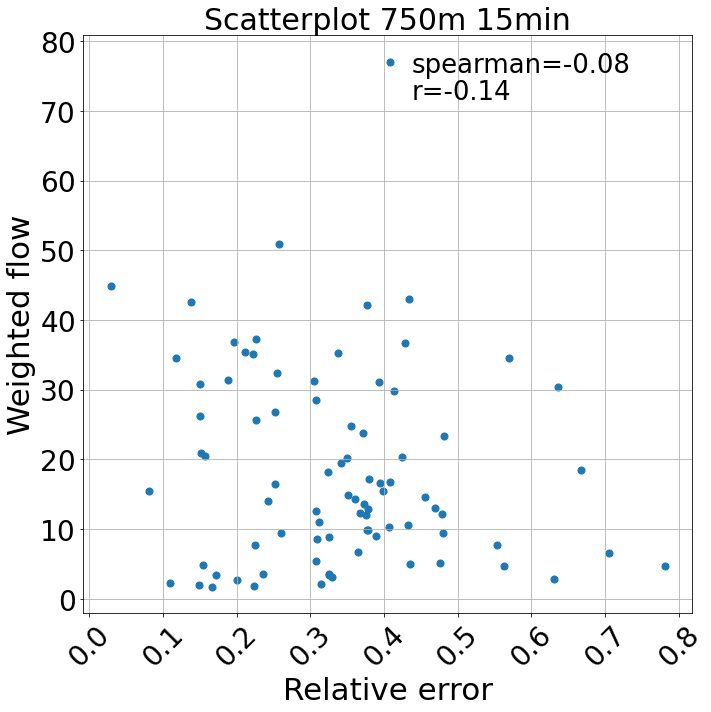

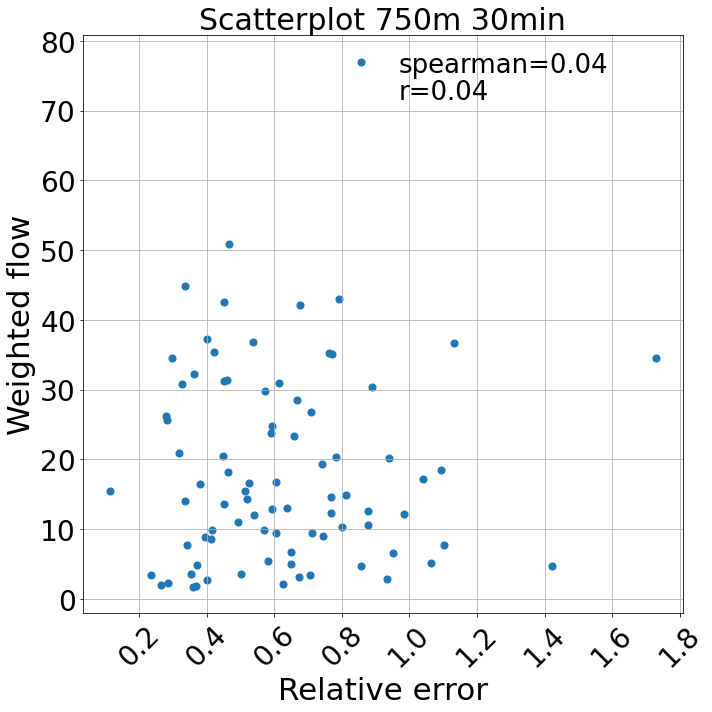

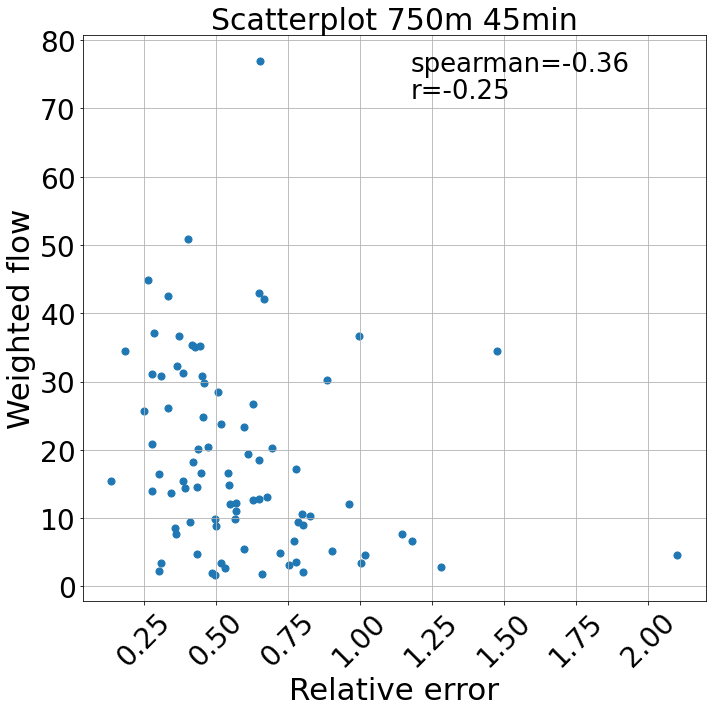

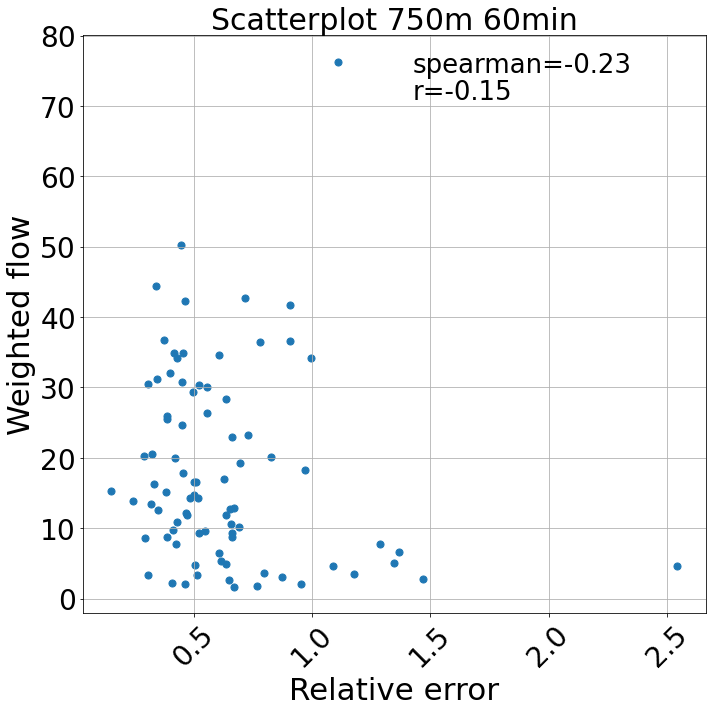

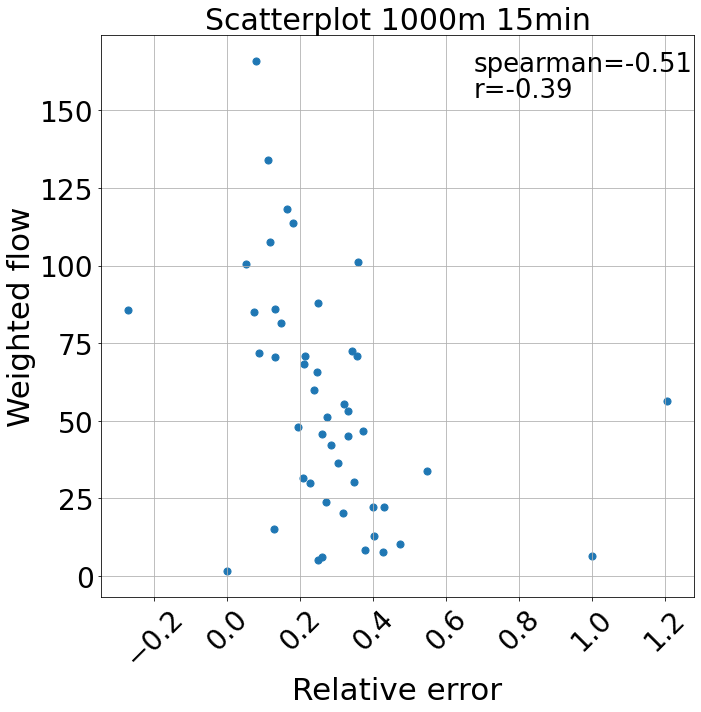

...

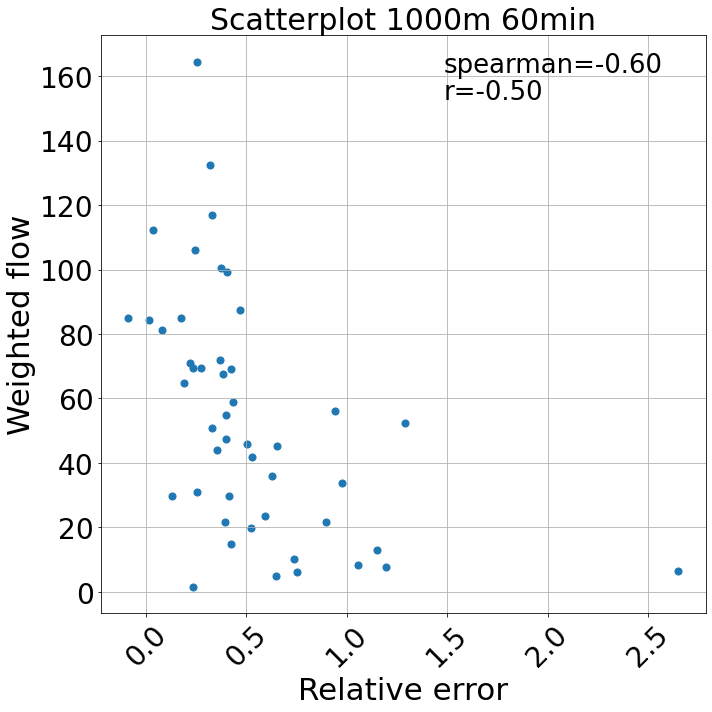

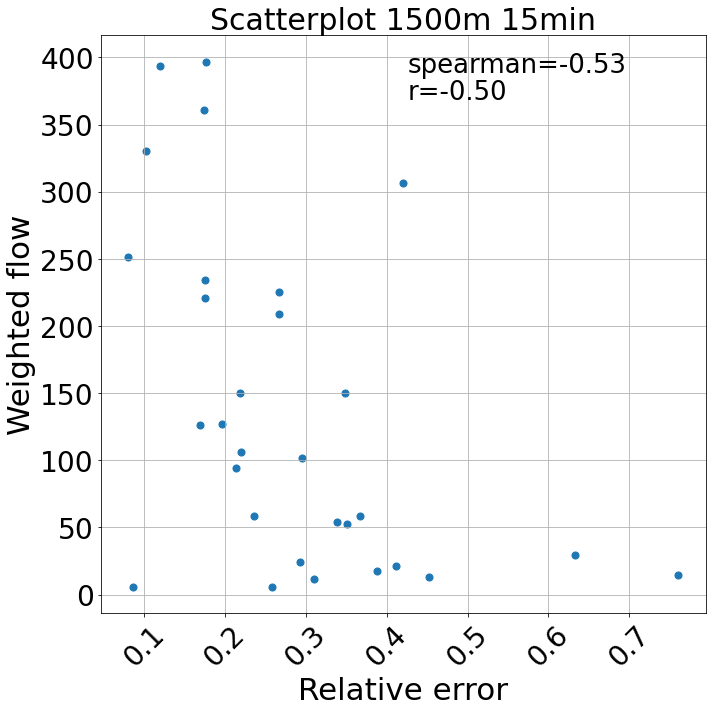

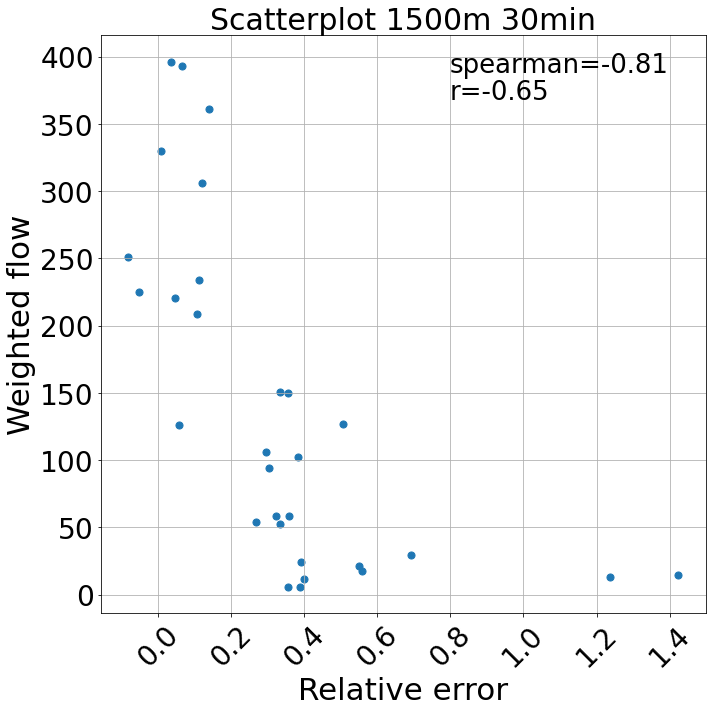

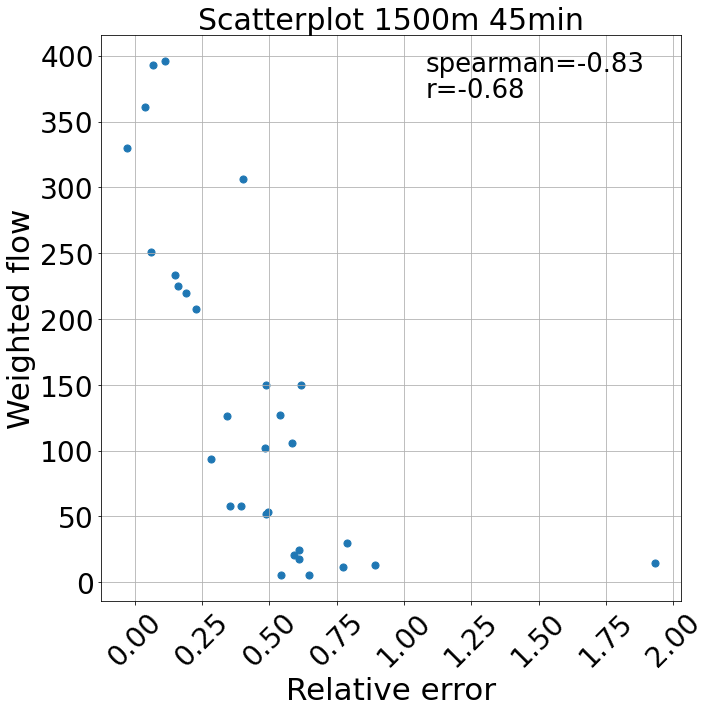

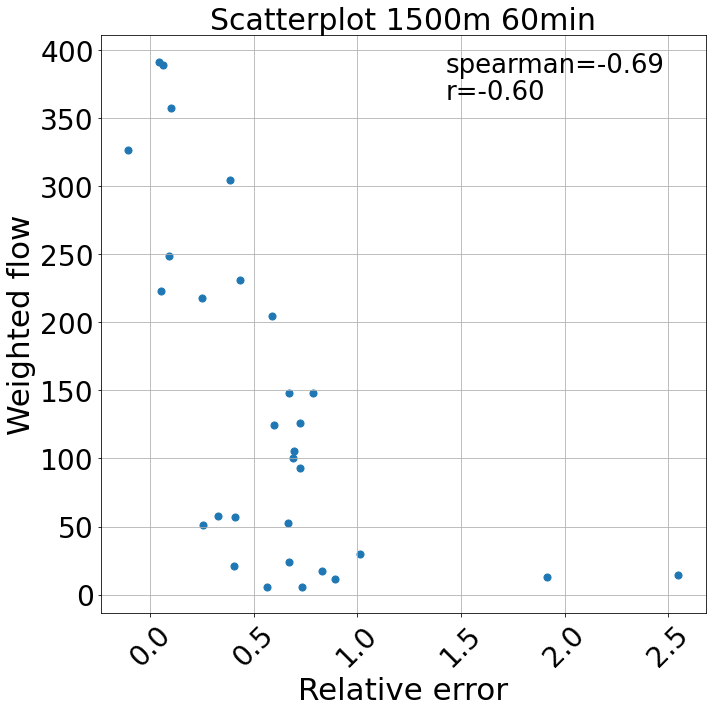

In [762]:
for tile_size in tile_sizes:
    for time_interval in time_intervals:
        H = compute_H_wrt_distance(AdjNet_real[str(tile_size)+time_interval][:,:,0], tess[tile_size], min_tile_id[tile_size])
        relative_improvement = comp_relative_improvement(AdjNet_real[str(tile_size)+time_interval][:,:,0], AdjNet_pred[str(tile_size)+time_interval][:,:,0])
        relative_improvement = np.array(relative_improvement)
        H = np.array(H)
        plt.figure(figsize=(10,10))
        plt.title("Scatterplot "+str(tile_size)+"m "+time_interval, fontsize=sizes['title'])
        plt.ylabel("Weighted flow", fontsize=sizes['labels']+1)
        plt.xlabel("Relative error", fontsize=sizes['labels']+1)
        plt.xticks(fontsize=sizes['ticks'], rotation=45)
        plt.yticks(fontsize=sizes['ticks'])
        plt.scatter(relative_improvement[relative_improvement!=0], H[H!=0], s=50)
#         plt.annotate("r="+"{:.2f}".format(np.corrcoef(relative_improvement[relative_improvement!=0].flatten(), entropies[entropies!=0].flatten())[0][1]), (0,entropies[entropies!=0].max()*0.95), fontsize=14)
        plt.annotate("r="+"{:.2f}".format(np.corrcoef(relative_improvement[relative_improvement!=0].flatten(), H[H!=0].flatten())[0][1]), (relative_improvement[relative_improvement!=0].max()*0.56, H[H!=0].max()*0.93), fontsize=sizes['legend'])
        plt.annotate("spearman="+"{:.2f}".format(spearmanr(relative_improvement[relative_improvement!=0].flatten(), H[H!=0].flatten()).correlation), (relative_improvement[relative_improvement!=0].max()*0.56, H[H!=0].max()*0.98), fontsize=sizes['legend'])
        plt.grid()
        plt.tight_layout()
        plt.savefig("Weightedflow_relative_error"+time_interval+"min"+str(tile_size)+"m.png")
        plt.show()

In [557]:
x_max = np.array(list(matrix_mapping.values()))[:,0].max()+1
y_max = np.array(list(matrix_mapping.values()))[:,1].max()+1

In [86]:
map_matrix = np.zeros([x_max, y_max])
for i, h in enumerate(H): # origin
        x, y = matrix_mapping[str(i+min_tile_id[1500])]
        map_matrix[x, y] = h
map_matrix = map_matrix[~(map_matrix==0).all(1)]
map_matrix = map_matrix[:, ~(map_matrix.T==0).all(1)]

<function matplotlib.pyplot.show(*args, **kw)>

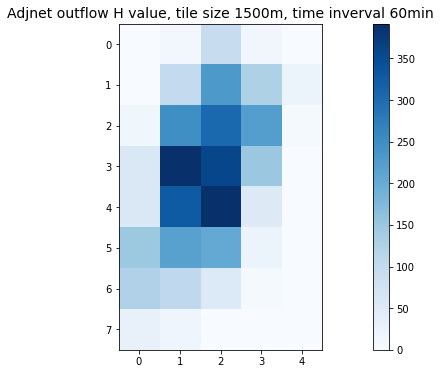

In [87]:
fig = plt.figure(figsize=(18,6))
plt.title("Adjnet outflow H value, tile size 1500m, time inverval 60min", fontsize=14)
plt.imshow(map_matrix.T, cmap='Blues', interpolation='nearest')
plt.colorbar()
plt.show

In [262]:
from matplotlib import cm
from matplotlib.colors import Normalize

In [263]:
plot_flows = tess[1000].copy()
plot_pred_flows = tess[1000].copy()

In [571]:
AdjNet_real['100060min'][:,:,0].sum(axis=0).sum(axis=1).shape[0]

76

In [268]:
tess[1000]

,tile_ID,geometry,position
0,0,"POLYGON ((-74.04722 40.68394, -74.04722 40.690...","[0, 0]"
1,1,"POLYGON ((-74.04722 40.69075, -74.04722 40.697...","[0, 1]"
2,2,"POLYGON ((-74.04722 40.69756, -74.04722 40.704...","[0, 2]"
3,3,"POLYGON ((-74.02926 40.68394, -74.02926 40.690...","[2, 0]"
4,4,"POLYGON ((-74.02926 40.69075, -74.02926 40.697...","[2, 1]"
...,...,...,...
150,150,"POLYGON ((-73.92146 40.86761, -73.92146 40.874...","[14, 27]"
151,151,"POLYGON ((-73.92146 40.87441, -73.92146 40.881...","[14, 28]"
152,152,"POLYGON ((-73.91247 40.86082, -73.91247 40.867...","[15, 26]"
153,153,"POLYGON ((-73.91247 40.86761, -73.91247 40.874...","[15, 27]"


In [272]:
plot_flows['outflow'] = real_outflow
# plot_flows['inflow'] = AdjNet_real['100060min'][:,:,0].sum(axis=0).sum(axis=1)

In [569]:
sizes

{'title': 30, 'ticks': 28, 'legend': 26, 'labels': 30, 'suptitle': 32}

In [574]:
AdjNet_real['75060min'][:,:,0].shape

(229, 141, 141)

In [595]:
plot_flows = tess[750].copy()
plot_pred_flows = tess[750].copy()

real_outflow = np.zeros(len(plot_flows))
real_outflow[min_tile_id[750]:min_tile_id[750]+AdjNet_real['75060min'][:,:,0].sum(axis=0).sum(axis=1).shape[0]] = AdjNet_real['75060min'][:,:,0].sum(axis=0).sum(axis=0)/AdjNet_real['75060min'][:,:,0].shape[0]

plot_flows['outflow'] = real_outflow
# plot_flows['inflow'] = AdjNet_real['100060min'][:,:,0].sum(axis=0).sum(axis=1)

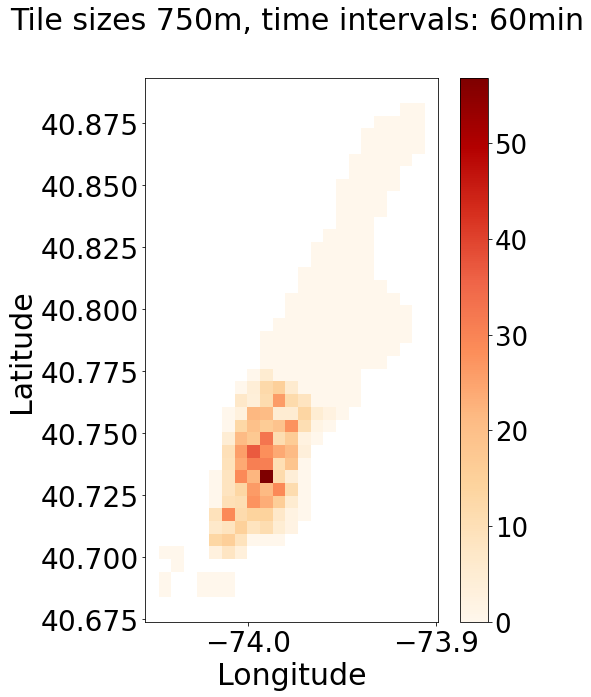

In [596]:
flow = 1
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
fig, ax1 = plt.subplots(1, 1, figsize=(8,10))
flow_str = "Outflow" if flow == 1 else "Inflow"
# fig = plt.figure(figsize=(8,8))
# for ax in [ax1]:
#         ax.set_xlabel('Longitude', fontsize=18)
#         ax.set_ylabel('Latitude', fontsize=18)
#         ax.set_yticks(np.arange(real_map.shape[2]))
#         ax.set_xticks(np.arange(real_map.shape[1]))
#         ax.set_yticklabels(np.arange(real_map.shape[2]), fontsize=16)
#         ax.set_xticklabels(np.arange(real_map.shape[1]), fontsize=16)
# plt.grid()
ax1.set_xlabel('Longitude', fontsize=sizes['labels'])
ax1.set_ylabel('Latitude', fontsize=sizes['labels'])
ax1.tick_params(axis='x', labelsize=sizes['ticks'])
ax1.tick_params(axis='y', labelsize=sizes['ticks'])
fig.suptitle('Tile sizes 750m, time intervals: '+time_interval, fontsize=sizes['title'])
# ax1.set_title("Real Map", fontsize=18)
c = plot_flows.plot(ax=ax1, column='outflow', k=3, cmap='OrRd')
fig.colorbar(cm.ScalarMappable(norm=Normalize(vmin=0, vmax=plot_flows['outflow'].max()), cmap='OrRd'), ax=ax1).ax.tick_params(labelsize=sizes['legend'])

# ax2.set_title("AdjNet Map", fontsize=18)
# c = plot_pred_flows.plot(ax=ax2, column='outflow', k=3, cmap='OrRd')
# fig.colorbar(cm.ScalarMappable(norm=Normalize(vmin=0, vmax=plot_pred_flows['outflow'].max()/AdjNet_real[time_interval][:,:,0].shape[0]), cmap='OrRd'), ax=ax2)


# plt.savefig(flow_str+"scatterplot_TileSize"+str(tile_size)+"_TimeInterval"+time_interval+".png")
plt.show()

In [591]:
plot_flows = tess[1000].copy()
plot_pred_flows = tess[1000].copy()

real_outflow = np.zeros(len(plot_flows))
real_outflow[min_tile_id[1000]:min_tile_id[1000]+76] = AdjNet_real['100060min'][:,:,0].sum(axis=0).sum(axis=0)

plot_flows['outflow'] = real_outflow
# plot_flows['inflow'] = AdjNet_real['100060min'][:,:,0].sum(axis=0).sum(axis=1)

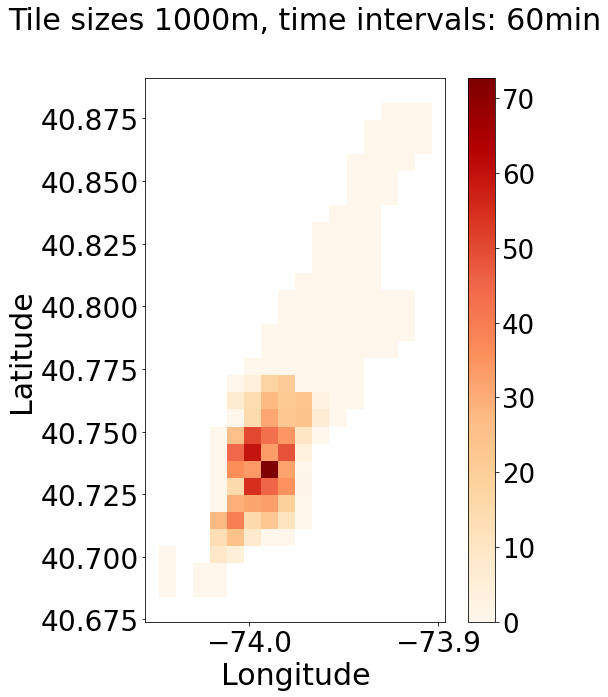

In [592]:
flow = 1
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
fig, ax1 = plt.subplots(1, 1, figsize=(8,10))
flow_str = "Outflow" if flow == 1 else "Inflow"
# fig = plt.figure(figsize=(8,8))
# for ax in [ax1]:
#         ax.set_xlabel('Longitude', fontsize=18)
#         ax.set_ylabel('Latitude', fontsize=18)
#         ax.set_yticks(np.arange(real_map.shape[2]))
#         ax.set_xticks(np.arange(real_map.shape[1]))
#         ax.set_yticklabels(np.arange(real_map.shape[2]), fontsize=16)
#         ax.set_xticklabels(np.arange(real_map.shape[1]), fontsize=16)
# plt.grid()
ax1.set_xlabel('Longitude', fontsize=sizes['labels'])
ax1.set_ylabel('Latitude', fontsize=sizes['labels'])
ax1.tick_params(axis='x', labelsize=sizes['ticks'])
ax1.tick_params(axis='y', labelsize=sizes['ticks'])
fig.suptitle('Tile sizes 1000m, time intervals: '+time_interval, fontsize=sizes['title'])
# ax1.set_title("Real Map", fontsize=18)
c = plot_flows.plot(ax=ax1, column='outflow', k=3, cmap='OrRd')
fig.colorbar(cm.ScalarMappable(norm=Normalize(vmin=0, vmax=plot_flows['outflow'].max()/AdjNet_real['100060min'][:,:,0].shape[0]), cmap='OrRd'), ax=ax1).ax.tick_params(labelsize=sizes['legend'])

# ax2.set_title("AdjNet Map", fontsize=18)
# c = plot_pred_flows.plot(ax=ax2, column='outflow', k=3, cmap='OrRd')
# fig.colorbar(cm.ScalarMappable(norm=Normalize(vmin=0, vmax=plot_pred_flows['outflow'].max()/AdjNet_real[time_interval][:,:,0].shape[0]), cmap='OrRd'), ax=ax2)


# plt.savefig(flow_str+"scatterplot_TileSize"+str(tile_size)+"_TimeInterval"+time_interval+".png")
plt.show()

In [652]:
plot_flows = tess[1500].copy()
plot_pred_flows = tess[1500].copy()

real_outflow = np.zeros(len(plot_flows))
real_outflow[min_tile_id[1500]:min_tile_id[1500]+AdjNet_real['150060min'][:,:,0].sum(axis=0).sum(axis=1).shape[0]] = AdjNet_real['150060min'][:,:,0].sum(axis=0).sum(axis=0)/AdjNet_real['150060min'][:,:,0].shape[0]

plot_flows['outflow'] = real_outflow
# plot_flows['inflow'] = AdjNet_real['100060min'][:,:,0].sum(axis=0).sum(axis=1)

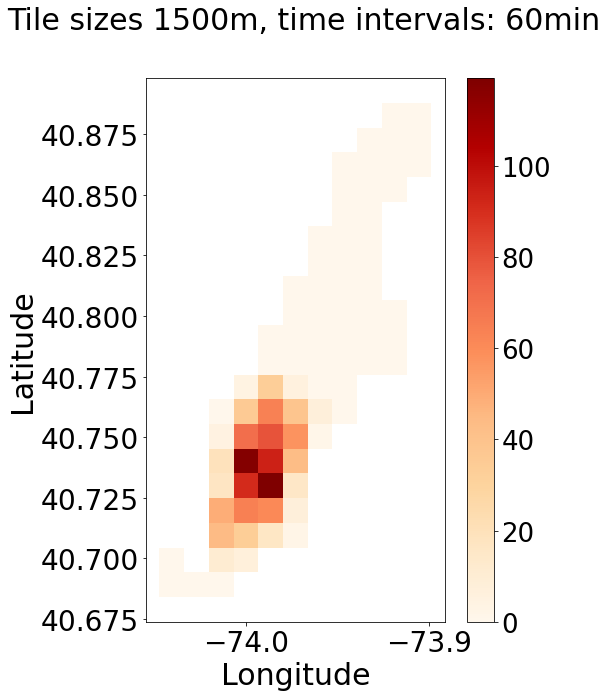

In [594]:
flow = 1
# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
fig, ax1 = plt.subplots(1, 1, figsize=(8,10))
flow_str = "Outflow" if flow == 1 else "Inflow"
# fig = plt.figure(figsize=(8,8))
# for ax in [ax1]:
#         ax.set_xlabel('Longitude', fontsize=18)
#         ax.set_ylabel('Latitude', fontsize=18)
#         ax.set_yticks(np.arange(real_map.shape[2]))
#         ax.set_xticks(np.arange(real_map.shape[1]))
#         ax.set_yticklabels(np.arange(real_map.shape[2]), fontsize=16)
#         ax.set_xticklabels(np.arange(real_map.shape[1]), fontsize=16)
# plt.grid()
ax1.set_xlabel('Longitude', fontsize=sizes['labels'])
ax1.set_ylabel('Latitude', fontsize=sizes['labels'])
ax1.tick_params(axis='x', labelsize=sizes['ticks'])
ax1.tick_params(axis='y', labelsize=sizes['ticks'])
fig.suptitle('Tile sizes 1500m, time intervals: '+time_interval, fontsize=sizes['title'])
# ax1.set_title("Real Map", fontsize=18)
c = plot_flows.plot(ax=ax1, column='outflow', k=3, cmap='OrRd')
fig.colorbar(cm.ScalarMappable(norm=Normalize(vmin=0, vmax=plot_flows['outflow'].max()), cmap='OrRd'), ax=ax1).ax.tick_params(labelsize=sizes['legend'])

# ax2.set_title("AdjNet Map", fontsize=18)
# c = plot_pred_flows.plot(ax=ax2, column='outflow', k=3, cmap='OrRd')
# fig.colorbar(cm.ScalarMappable(norm=Normalize(vmin=0, vmax=plot_pred_flows['outflow'].max()/AdjNet_real[time_interval][:,:,0].shape[0]), cmap='OrRd'), ax=ax2)


# plt.savefig(flow_str+"scatterplot_TileSize"+str(tile_size)+"_TimeInterval"+time_interval+".png")
plt.show()

In [256]:
tess[750]

,tile_ID,geometry,position
0,0,"POLYGON ((-74.04722 40.68394, -74.04722 40.689...","[0, 0]"
1,1,"POLYGON ((-74.04722 40.68905, -74.04722 40.694...","[0, 1]"
2,2,"POLYGON ((-74.04722 40.69927, -74.04722 40.704...","[0, 3]"
3,3,"POLYGON ((-74.04048 40.69416, -74.04048 40.699...","[1, 2]"
4,4,"POLYGON ((-74.04048 40.69927, -74.04048 40.704...","[1, 3]"
...,...,...,...
255,255,"POLYGON ((-73.91921 40.87780, -73.91921 40.882...","[19, 38]"
256,256,"POLYGON ((-73.91247 40.86252, -73.91247 40.867...","[20, 35]"
257,257,"POLYGON ((-73.91247 40.86761, -73.91247 40.872...","[20, 36]"
258,258,"POLYGON ((-73.91247 40.87271, -73.91247 40.877...","[20, 37]"


In [150]:
import networkx as nx

In [151]:
def get_df_flow(od_matrix, tessellations, min_tile_id):
    origins_id = []
    destinations_id = []
    origins = []
    destinations = []
    flows = []
    for o in range(od_matrix[:,:,0].shape[1]):
        for d in range(od_matrix[:,:,0].shape[2]):
            origins_id.append(o)
            destinations_id.append(d)
            origin_coords = tessellations['geometry'][o+min_tile_id].centroid
            dest_coords = tessellations['geometry'][d+min_tile_id].centroid
            origins.append((origin_coords.x, origin_coords.y))
            destinations.append((dest_coords.x, dest_coords.y))
            flows.append(od_matrix[:,o,0,d].sum())
    df_flows = pd.DataFrame()
    df_flows['origin_id'] = origins_id
    df_flows['destination_id'] = destinations_id
    df_flows['origin'] = origins
    df_flows['destination'] = destinations
    df_flows['flow'] = flows
    return df_flows

df_flows = {}
for tile_size in tile_sizes:
    for time_interval in time_intervals:
        df_flows[str(tile_size)+time_interval] = get_df_flow(AdjNet_real[str(tile_size)+time_interval], tess[tile_size], min_tile_id[tile_size])

In [813]:
df_f = df_flows[str(tile_size)+time_interval][df_flows[str(tile_size)+time_interval]['flow']>0.0]

In [814]:
graph = nx.from_pandas_edgelist(df_f, source = 'origin_id', target = 'destination_id', edge_attr = 'flow', create_using = nx.DiGraph())

In [815]:
# plt.figure(figsize = (10,9))
# nx.draw_networkx(graph)

In [816]:
str(tile_size)+time_interval

'150060min'

In [817]:
len(graph.edges()), len(graph.nodes())

(873, 30)

In [818]:
import cartopy.crs as ccrs

In [819]:
deg = nx.degree(graph)
sizes = [deg[code] for code in graph.nodes]

In [820]:
graph.nodes

NodeView((0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 24, 25, 26, 27, 28, 29, 30, 35, 36))

In [821]:
sizes = AdjNet_real[str(tile_size)+time_interval][:,:,0].sum(axis=0).sum(axis=1)

In [822]:
labels = {code: code for code in graph.nodes}

In [823]:
df_f['origin'].unique()

array([(-74.01353507684551, 40.69926631772947),
       (-74.01353507684551, 40.70948130178482),
       (-74.01353507684551, 40.71969471909463),
       (-74.01353507684551, 40.7299065695747),
       (-74.0135350768455, 40.74011685314107),
       (-74.01353507684551, 40.75032556970998),
       (-74.00006034758371, 40.699266317729474),
       (-74.00006034758371, 40.70948130178483),
       (-74.00006034758371, 40.71969471909463),
       (-74.00006034758371, 40.72990656957471),
       (-74.00006034758371, 40.740116853141075),
       (-74.00006034758371, 40.75032556970997),
       (-74.00006034758371, 40.76053271919784),
       (-74.00006034758371, 40.77073830152135),
       (-73.98658561832193, 40.70948130178483),
       (-73.98658561832193, 40.71969471909463),
       (-73.98658561832193, 40.72990656957471),
       (-73.98658561832193, 40.740116853141075),
       (-73.98658561832193, 40.75032556970997),
       (-73.98658561832193, 40.76053271919784),
       (-73.98658561832193, 40.77073830

In [824]:
flows = nx.get_edge_attributes(graph,'flow')

In [825]:
# no_zeros_edges = [(a,b) for a, b, attrs in graph.edges(data=True) if attrs["flow"] > 0]
# no_zeros_flows = {(a,b):attrs["flow"] for a, b, attrs in graph.edges(data=True) if attrs["flow"] > 0}

In [826]:
# G = nx.DiGraph()
# G.add_edges_from(no_zeros_edges)

In [827]:
# nx.set_edge_attributes(G, no_zeros_flows, 'flows')

In [828]:
# flows = nx.get_edge_attributes(G,'flows')

In [829]:
normalized_flows = np.array(list(flows.values()))/max(list(flows.values()))

In [830]:
sizes[sizes!=0]

array([ 2461., 10240., 11374.,  3794.,  4264.,  1116.,  1640.,  7478.,
       14343., 20258., 26284., 17250.,  7515.,   955.,  3668., 14027.,
       26751., 21541., 19006., 15364.,  7587.,   522.,  1708.,  3288.,
        9946., 14348.,  8696.,  1314.,   389.,  1719.], dtype=float32)

/home/mcardia/anaconda3/envs/results/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:563: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/home/mcardia/anaconda3/envs/results/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:660: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


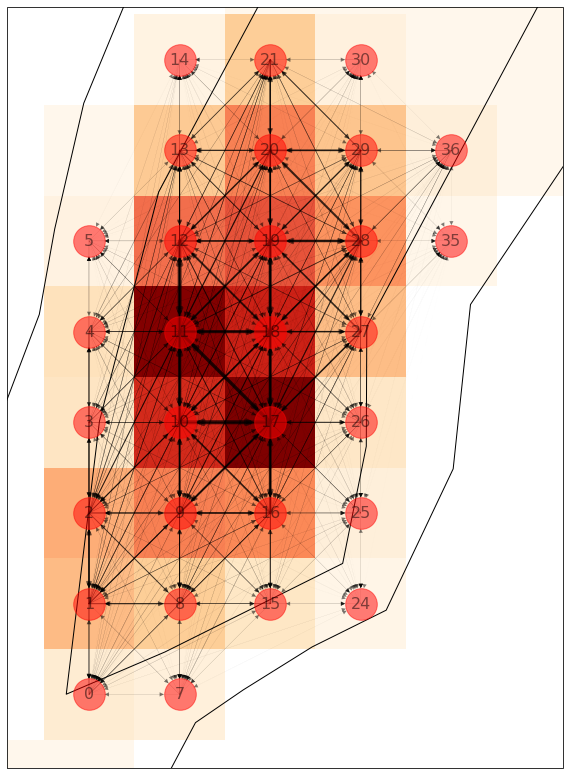

In [831]:
# Map projection
crs = ccrs.PlateCarree(central_longitude=0)
fig, ax = plt.subplots(
    1, 1, figsize=(20, 14),
    subplot_kw=dict(projection=crs))
ax.coastlines()
ax.set_global()
# ax.set_extent([-73.95963615979834, -74.01353507684551, 40.69926631772947, 40.77073830152135])
ax.set_extent([-73.943, -74.0257, 40.691, 40.7767], ccrs.PlateCarree())
c = plot_flows.plot(ax=ax, column='outflow', k=3, cmap='OrRd')

nx.draw_networkx(graph, 
                 ax=ax,
                 font_size=16,
                 alpha=.5,
                 width=normalized_flows*6,
#                  node_size=sizes[sizes!=0]/8,
                 node_size=1000,
#                  labels=labels,
                 pos=df_flows[str(tile_size)+time_interval]['origin'].unique(),
#                  node_color=altitudes,
                 cmap=plt.cm.autumn)

In [832]:
df_f = df_f[df_f['origin_id']==19]
graph = nx.from_pandas_edgelist(df_f, source = 'origin_id', target = 'destination_id', edge_attr = 'flow', create_using = nx.DiGraph())
deg = nx.degree(graph)
# sizes = [deg[code] for code in graph.nodes]
labels = {code: code for code in graph.nodes}
flows = nx.get_edge_attributes(graph,'flow')
# normalized_flows = np.array(list(flows.values()))/max(list(flows.values()))

In [833]:
normalized_flows = np.array(list(flows.values()))/max(list(flows.values()))

/home/mcardia/anaconda3/envs/results/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:563: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/home/mcardia/anaconda3/envs/results/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:660: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


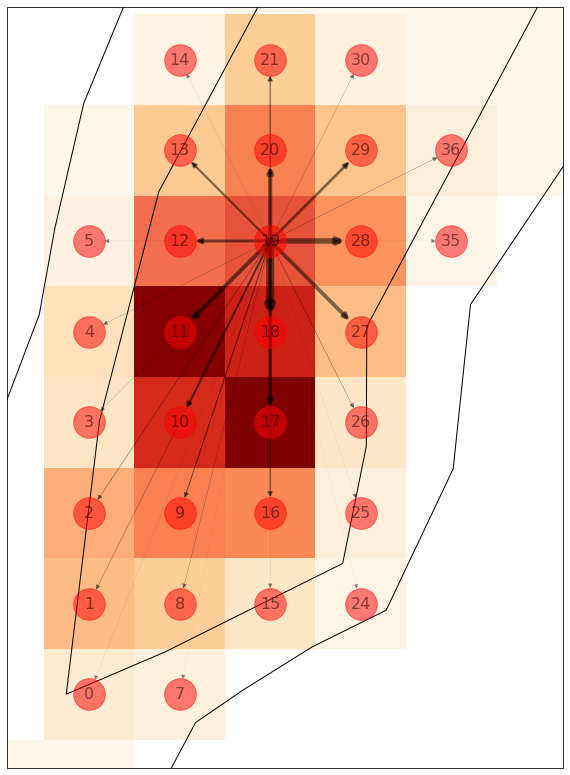

In [834]:
# Map projection
crs = ccrs.PlateCarree(central_longitude=0)
fig, ax = plt.subplots(
    1, 1, figsize=(20, 14),
    subplot_kw=dict(projection=crs))
ax.coastlines()
ax.set_global()
# ax.set_extent([-73.95963615979834, -74.01353507684551, 40.69926631772947, 40.77073830152135])
ax.set_extent([-73.943, -74.0257, 40.691, 40.7767], ccrs.PlateCarree())
c = plot_flows.plot(ax=ax, column='outflow', k=3, cmap='OrRd')

nx.draw_networkx(graph, 
                 ax=ax,
                 font_size=16,
                 alpha=.5,
                 width=normalized_flows*8,
#                  node_size=sizes[sizes!=0]/8,
                 node_size=1000,
#                  labels=labels,
                 pos=df_flows[str(tile_size)+time_interval]['origin'].unique(),
#                  node_color=altitudes,
                 cmap=plt.cm.autumn)

/home/mcardia/anaconda3/envs/results/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:563: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/home/mcardia/anaconda3/envs/results/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:660: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


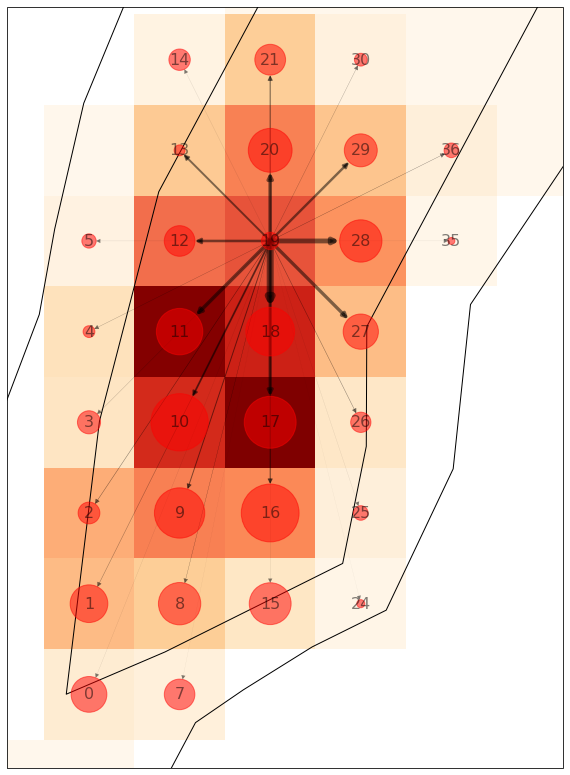

In [807]:
# Map projection
crs = ccrs.PlateCarree(central_longitude=0)
fig, ax = plt.subplots(
    1, 1, figsize=(20, 14),
    subplot_kw=dict(projection=crs))
ax.coastlines()
ax.set_global()
# ax.set_extent([-73.95963615979834, -74.01353507684551, 40.69926631772947, 40.77073830152135])
ax.set_extent([-73.943, -74.0257, 40.691, 40.7767], ccrs.PlateCarree())
c = plot_flows.plot(ax=ax, column='outflow', k=3, cmap='OrRd')

nx.draw_networkx(graph, 
                 ax=ax,
                 font_size=16,
                 alpha=.5,
                 width=normalized_flows*7,
                 node_size=sizes[sizes!=0]/8,
#                  labels=labels,
                 pos=df_flows[str(tile_size)+time_interval]['origin'].unique(),
#                  node_color=altitudes,
                 cmap=plt.cm.autumn)